In [4]:
import json
import os
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

In [5]:
import json
import os
import random
import time
from PIL import Image
import torch
from torch.utils.data import Dataset
from torchvision import transforms
from collections import defaultdict
import multiprocessing
from tqdm import tqdm

class RecipeDataset(Dataset):
    def __init__(self, json_path, image_base_path, partition, transform=None, 
                 num_workers=None, cache_path=None):
        """
        Args:
            json_path (str): Путь к JSON файлу с данными
            image_base_path (str): Базовый путь к папке с изображениями
            partition (str): Тип данных (train/val/test)
            transform (callable, optional): Трансформации для изображений
            num_workers (int): Количество процессов для проверки изображений
            cache_path (str): Путь для сохранения/загрузки кэша
        """
        self.image_base_path = image_base_path
        self.transform = transform or self.default_transform()
        
        # Загрузка данных
        with open(json_path, 'r') as f:
            all_data = json.load(f)
        
        # Фильтрация по разделу
        self.all_recipes = [item for item in all_data if item['partition'] == partition]
        
        # Проверка валидности изображений (с кэшированием)
        self.valid_recipes = self._filter_valid_recipes(
            num_workers=num_workers,
            cache_path=cache_path
        )
        
        print(f"Loaded {len(self.valid_recipes)}/{len(self.all_recipes)} "
              f"recipes with valid images for {partition} partition")
    
    def _filter_valid_recipes(self, num_workers=None, cache_path=None):
        """Фильтрует рецепты с валидными изображениями с возможностью кэширования"""
        # Проверка кэша
        if cache_path and os.path.exists(cache_path):
            try:
                with open(cache_path, 'r') as f:
                    return json.load(f)
                print(f"Loaded valid recipes from cache: {cache_path}")
            except:
                pass
        
        # Определение количества рабочих процессов
        if num_workers is None:
            num_workers = max(1, multiprocessing.cpu_count() // 2)
        
        # Разделение данных на чанки для параллельной обработки
        chunks = [self.all_recipes[i::num_workers] for i in range(num_workers)]
        
        # Параллельная проверка изображений
        with multiprocessing.Pool(num_workers) as pool:
            results = list(tqdm(
                pool.imap(self._validate_recipe_chunk, chunks),
                total=num_workers,
                desc="Validating images"
            ))
        
        # Сбор результатов
        valid_recipes = []
        for result in results:
            valid_recipes.extend(result)
        
        # Сохранение в кэш
        if cache_path:
            os.makedirs(os.path.dirname(cache_path), exist_ok=True)
            with open(cache_path, 'w') as f:
                json.dump(valid_recipes, f)
            print(f"Saved valid recipes cache to {cache_path}")
        
        return valid_recipes
    
    def _validate_recipe_chunk(self, recipes):
        """Проверяет чанк рецептов на наличие валидных изображений"""
        valid_chunk = []
        for item in recipes:
            recipe_id = item['id']
            valid_image = None
            
            for image_info in item['images']:
                image_id = image_info['image_id']
                image_path = self._get_image_path(recipe_id, image_id)
                
                if os.path.exists(image_path):
                    try:
                        # Проверка целостности изображения
                        with Image.open(image_path) as img:
                            img.verify()
                        
                        # Дополнительная проверка возможности открытия
                        with Image.open(image_path) as img:
                            img.convert('RGB')
                        
                        valid_image = image_path
                        break
                    except Exception as e:
                        # Файл битый, пропускаем
                        continue
            
            if valid_image:
                # Сохраняем рецепт с путем к изображению
                item['image_path'] = valid_image
                valid_chunk.append(item)
        
        return valid_chunk
    
    def _get_image_path(self, recipe_id, image_id):
        """Формирует путь к изображению на основе ID рецепта"""
        return os.path.join(
            self.image_base_path,
            image_id[0],
            image_id[1],
            image_id[2],
            image_id[3],
            image_id
        )
    
    def default_transform(self):
        """Трансформации по умолчанию для изображений"""
        return transforms.Compose([
            transforms.Resize((256, 256)),
            transforms.CenterCrop(224),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                                 std=[0.229, 0.224, 0.225])
        ])
    
    def __len__(self):
        """Количество рецептов с валидными изображениями"""
        return len(self.valid_recipes)
    
    def __getitem__(self, idx):
        """Возвращает элемент с гарантированно валидным изображением"""
        item = self.valid_recipes[idx]
        recipe_id = item['id']
        image_path = item['image_path']
        
        #

In [ ]:
dataset = RecipeDataset(json_path='processed_recipes/train.json',image_base_path='train',partition='train')

Validating images:   0%|          | 0/12 [00:00<?, ?it/s]

In [6]:
import json
import os
from PIL import Image

def is_valid_image(image_path):
    """Проверяет, является ли изображение валидным"""
    if not os.path.exists(image_path):
        return False
    try:
        with Image.open(image_path) as img:
            img.verify()  # Проверка целостности
        with Image.open(image_path) as img:
            img.convert('RGB')  # Проверка возможности конвертации
        return True
    except:
        return False

def filter_valid_recipes(input_json, output_json, image_base_path):
    """Создает новый JSON только с рецептами, имеющими валидные изображения"""
    with open(input_json, 'r') as f:
        all_recipes = json.load(f)
    
    valid_recipes = []
    
    for recipe in all_recipes:
        valid_images = []
        
        for img_info in recipe['images']:
            image_id = img_info['image_id']
            image_path = os.path.join(
                image_base_path,
                image_id[0],
                image_id[1],
                image_id[2],
                image_id[3],
                image_id
            )
            
            if is_valid_image(image_path):
                valid_images.append({
                    'image_id': image_id,
                    'url': img_info.get('url', ''),
                    'valid_path': image_path
                })
        
        if valid_images:
            # Создаем копию рецепта только с валидными изображениями
            new_recipe = recipe.copy()
            new_recipe['images'] = valid_images
            valid_recipes.append(new_recipe)
    
    # Сохраняем результат
    with open(output_json, 'w') as f:
        json.dump(valid_recipes, f, indent=2)
    
    print(f"Saved {len(valid_recipes)} valid recipes to {output_json}")
    print(f"Filtered out {len(all_recipes) - len(valid_recipes)} invalid recipes")

In [ ]:
filter_valid_recipes(input_json='processed_recipes/val.json', output_json = 'processed_recipes/val_fix.json',
                     image_base_path='./test/test')

Saved 2568 valid recipes to processed_recipes/val_fix.json
Filtered out 5119 invalid recipes


In [8]:
filter_valid_recipes(input_json='processed_recipes/test.json', output_json = 'processed_recipes/test_fix.json',
                     image_base_path='./test/test')

Saved 2721 valid recipes to processed_recipes/test_fix.json
Filtered out 4960 invalid recipes


In [19]:
import json
import os
from PIL import Image
import torch
from torch.utils.data import Dataset
from torchvision import transforms

class ValidRecipeDataset(Dataset):
    def __init__(self, valid_json_path, transform=None):
        """
        Args:
            valid_json_path (str): Путь к JSON с валидными рецептами
            transform (callable, optional): Трансформации изображений
        """
        with open(valid_json_path, 'r') as f:
            self.recipes = json.load(f)
        
        self.transform = transform or self.default_transform()
        print(f"Loaded {len(self.recipes)} recipes with valid images")

    def default_transform(self):
        """Трансформации по умолчанию"""
        return transforms.Compose([
            transforms.Resize((256, 256)),
            transforms.CenterCrop(224),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                               std=[0.229, 0.224, 0.225])
        ])

    def __len__(self):
        return len(self.recipes)

    def __getitem__(self, idx):
        recipe = self.recipes[idx]
        img_info = recipe['images'][0]  # Берем первое валидное изображение
        image_path = img_info['valid_path']
        
        # Загрузка изображения (гарантированно валидного)
        try:
            image = Image.open(image_path).convert('RGB')
        except:
            # На крайний случай - черное изображение
            image = Image.new('RGB', (224, 224), (0, 0, 0))
        
        # Применение трансформаций
        if self.transform:
            image = self.transform(image)
        
        # Целевые значения (калории и другие nutritional values)
        target = torch.tensor([
            recipe['nutr_per100g']['energy_kcal'],
            # Можно добавить другие nutritional values
        ], dtype=torch.float32)
        
        return {
            'image': image,
            'target': target,
            'recipe_id': recipe['id'],
            'image_path': image_path
        }

    def get_recipe_info(self, recipe_id):
        """Возвращает полную информацию о рецепте по ID"""
        for recipe in self.recipes:
            if recipe['id'] == recipe_id:
                return recipe
        return None

In [21]:
dataset = ValidRecipeDataset(
    valid_json_path="./processed_recipes/train_fix.json")


Loaded 33698 recipes with valid images


In [2]:
import json
import os
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

In [23]:
from torch.utils.data import DataLoader

def custom_collate_fn(batch):
    """Кастомная функция для объединения элементов батча с обработкой ошибок"""
    processed_batch = {
        'images': [],
        'targets': [],
        'recipe_ids': [],
        'image_paths': [],
        'local_found': []
    }
    
    for item in batch:
        # Обработка изображения (на случай, если transform не был применен)
        if isinstance(item['image'], Image.Image):
            try:
                img_tensor = dataset.transform(item['image']) if dataset.transform else transforms.ToTensor()(item['image'])
                processed_batch['images'].append(img_tensor)
            except Exception as e:
                print(f"Error transforming image {item['image_path']}: {e}")
                processed_batch['images'].append(torch.zeros(3, 224, 224))
        else:
            processed_batch['images'].append(item['image'])
        
        # Остальные поля
        processed_batch['targets'].append(item['target'])
        processed_batch['recipe_ids'].append(item['recipe_id'])
        processed_batch['image_paths'].append(item['image_path'])
        processed_batch['local_found'].append(item.get('local_found', True))  # По умолчанию True
    
    # Преобразуем списки в тензоры где нужно
    try:
        processed_batch['images'] = torch.stack(processed_batch['images'])
        processed_batch['targets'] = torch.stack(processed_batch['targets'])
    except Exception as e:
        print(f"Error stacking batch: {e}")
        # Возвращаем None в случае критической ошибки
        return None
    
    return processed_batch

dataloader = DataLoader(
    dataset,
    batch_size=32,
    shuffle=True,
    # num_workers=4,  # Можно увеличить для ускорения загрузки
    collate_fn=custom_collate_fn,
    pin_memory=True,  # Для ускорения передачи на GPU
    drop_last=True  # Игнорируем последний неполный батч
)

Saved visualization to batch_visualization.png


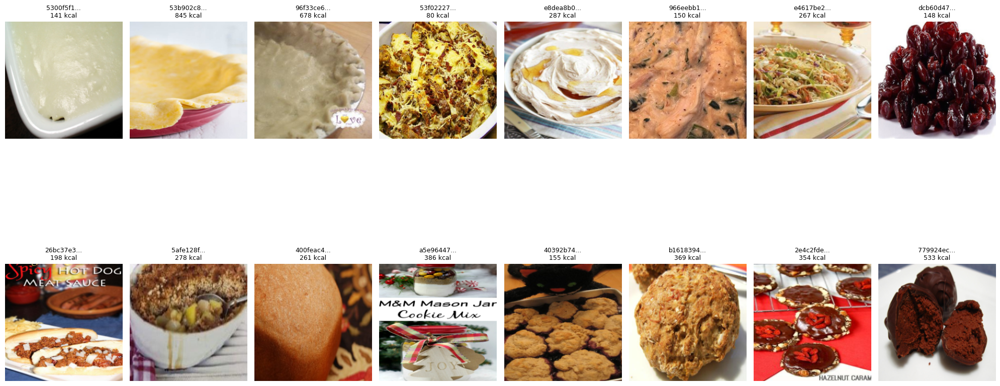


Batch statistics:
Images shape: torch.Size([32, 3, 224, 224])
Targets shape: torch.Size([32, 1])

Targets summary:
Min: 46.0 kcal
Max: 845.3 kcal
Mean: 283.2 kcal
Std: 190.9 kcal


In [29]:
import matplotlib.pyplot as plt
import numpy as np

def denormalize(tensor, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]):
    """Денормализует изображение для визуализации с обработкой разных форматов"""
    if isinstance(tensor, np.ndarray):
        tensor = torch.from_numpy(tensor)
    elif not isinstance(tensor, torch.Tensor):
        raise ValueError("Input must be torch.Tensor or numpy.ndarray")
    
    tensor = tensor.clone()
    if tensor.dim() == 3:
        # Одиночное изображение [C, H, W]
        for t, m, s in zip(tensor, mean, std):
            t.mul_(s).add_(m)
    elif tensor.dim() == 4:
        # Батч изображений [B, C, H, W]
        for c in range(tensor.size(1)):
            tensor[:, c].mul_(std[c]).add_(mean[c])
    tensor = torch.clamp(tensor, 0, 1)
    return tensor

def visualize_batch(dataloader, n_images=16, figsize=(20, 10), save_path=None):
    """Визуализирует батч изображений с таргетами"""
    # Получаем первый батч
    try:
        batch = next(iter(dataloader))
        if batch is None:
            print("Error: Received empty batch")
            return
            
        images = batch['images']
        targets = batch['targets']
        recipe_ids = batch.get('recipe_ids', ['N/A']*len(images))
        local_found = batch.get('local_found', [True]*len(images))
    except Exception as e:
        print(f"Error loading batch: {e}")
        return
    
    # Проверяем размер батча
    n_images = min(n_images, len(images))
    n_cols = min(8, n_images)  # Максимум 8 колонок
    n_rows = int(np.ceil(n_images / n_cols))
    
    # Создаем сетку для отображения
    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
    if n_rows == 1 and n_cols == 1:
        axes = np.array([axes])
    axes = axes.ravel()
    
    for i in range(n_images):
        ax = axes[i]
        try:
            # Денормализуем и преобразуем изображение
            img = denormalize(images[i])
            img_np = img.permute(1, 2, 0).numpy()
            
            # Получаем информацию о рецепте
            energy_kcal = targets[i].item() if torch.is_tensor(targets[i]) else targets[i]
            recipe_id = recipe_ids[i]
            local = local_found[i]
            
            # Отображаем изображение
            ax.imshow(img_np)
            title = f"{recipe_id[:8]}...\n{energy_kcal:.0f} kcal"
            if not local:
                title += "\n(downloaded)"
            ax.set_title(title, fontsize=9)
            ax.axis('off')
            
            # Добавляем рамку для скачанных изображений
            if not local:
                for spine in ax.spines.values():
                    spine.set_edgecolor('red')
                    spine.set_linewidth(2)
        except Exception as e:
            print(f"Error processing image {i}: {e}")
            ax.imshow(np.zeros((224, 224, 3)))
            ax.set_title("Error", color='red')
            ax.axis('off')
    
    # Скрываем пустые оси
    for j in range(i+1, len(axes)):
        axes[j].axis('off')
    
    plt.tight_layout()
    
    # Сохраняем если нужно
    if save_path:
        plt.savefig(save_path, bbox_inches='tight', dpi=150)
        print(f"Saved visualization to {save_path}")
    
    plt.show()
    
    # Выводим статистику
    print("\nBatch statistics:")
    print(f"Images shape: {images.shape}")
    print(f"Targets shape: {targets.shape}")
    
    if len(targets) > 0:
        targets_np = targets.numpy() if torch.is_tensor(targets) else np.array(targets)
        print(f"\nTargets summary:")
        print(f"Min: {np.min(targets_np):.1f} kcal")
        print(f"Max: {np.max(targets_np):.1f} kcal")
        print(f"Mean: {np.mean(targets_np):.1f} kcal")
        print(f"Std: {np.std(targets_np):.1f} kcal")

# Пример использования
visualize_batch(
    dataloader,
    n_images=16,
    figsize=(20, 12),
    save_path='batch_visualization.png'
)

In [ ]:
import json
import os
from PIL import Image
import torch
from torch.utils.data import Dataset
from torchvision import transforms

class ValidRecipeDataset(Dataset):
    def __init__(self, valid_json_path, transform=None):
        """
        Улучшенный датасет для работы с композитным лоссом
        
        Args:
            valid_json_path (str): Путь к JSON с валидными рецептами
            transform (callable, optional): Трансформации изображений
        """
        with open(valid_json_path, 'r') as f:
            self.recipes = json.load(f)
        
        self.transform = transform or self.default_transform()
        print(f"Loaded {len(self.recipes)} recipes with valid images")

    def default_transform(self):
        """Трансформации по умолчанию"""
        return transforms.Compose([
            transforms.Resize((256, 256)),
            transforms.CenterCrop(224),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                               std=[0.229, 0.224, 0.225])
        ])

    def __len__(self):
        return len(self.recipes)

    def __getitem__(self, idx):
        recipe = self.recipes[idx]
        img_info = recipe['images'][0]
        image_path = img_info['valid_path']
        
        # Загрузка изображения
        try:
            image = Image.open(image_path).convert('RGB')
            if self.transform:
                image = self.transform(image)
        except Exception as e:
            print(f"Error loading image {image_path}: {e}")
            
        # Подготовка всех таргетов для композитного лосса
        nutr_per100g = recipe['nutr_per100g']
        nutr_per_portion = recipe['nutr_per_portion']
        
        # Расчет пропорций БЖУ (правильный способ)
        total_bzu = (nutr_per100g['protein_g'] + 
                    nutr_per100g['fat_g'] + 
                    nutr_per100g['carbs_g']+1e-8)
        targets = {
            'weight': torch.tensor([recipe['total_weight_g']], dtype=torch.float32),
            'bzu_100g': torch.tensor([
                nutr_per100g['protein_g'],
                nutr_per100g['fat_g'],
                nutr_per100g['carbs_g']
            ], dtype=torch.float32),
            'calories_100g': torch.tensor([nutr_per100g['energy_kcal']], dtype=torch.float32),
            'bzu_proportions': torch.tensor([
                nutr_per100g['protein_g'] / total_bzu,
                nutr_per100g['fat_g'] / total_bzu,
                nutr_per100g['carbs_g'] / total_bzu
            ], dtype=torch.float32),
            # 'micro': torch.tensor([
            #     nutr_per_portion['sugars_g'],
            #     nutr_per_portion['salt_g'],
            #     nutr_per_portion['saturated_fat_g']
            # ], dtype=torch.float32)
        }
        
        return {
            'image': image,
            'targets': targets,
            'recipe_id': recipe['id'],
            'image_path': image_path
        }

def food_collate_fn(batch):
    """Кастомная функция для объединения в батчи"""
    images = torch.stack([item['image'] for item in batch])
    
    # Собираем все таргеты
    targets = {
        # 'weight': torch.stack([item['targets']['weight'] for item in batch]),
        'bzu': torch.stack([item['targets']['bzu_100g'] for item in batch]),
        'calories': torch.stack([item['targets']['calories_100g'] for item in batch]),
        'bzu_proportions': torch.stack([item['targets']['bzu_proportions'] for item in batch]),
        # 'micro': torch.stack([item['targets']['micro'] for item in batch])
    }
    
    return {
        'images': images,
        'targets': targets,
        'recipe_ids': [item['recipe_id'] for item in batch],
        'image_paths': [item['image_path'] for item in batch]
    }

# Пример использования:
dataset = ValidRecipeDataset(
    valid_json_path='./processed_recipes/train_fix.json',
    transform=None  # Можно указать кастомные трансформации
)

dataloader = torch.utils.data.DataLoader(
    dataset,
    batch_size=32,
    shuffle=True,
    # num_workers=4,
    collate_fn=food_collate_fn,
    # pin_memory=True
)

Loaded 33698 recipes with valid images


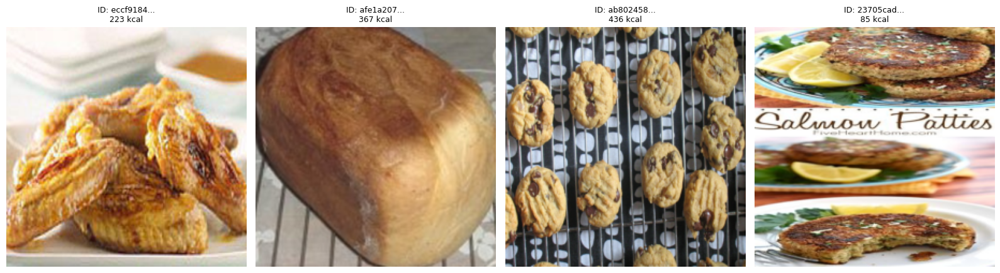


Batch Statistics:
Images shape: torch.Size([32, 3, 224, 224])

Targets Summary:
weight: min=34.5, max=43471.3, mean=3280.2
bzu: min=0.0, max=90.9, mean=16.0
calories: min=3.2, max=756.3, mean=269.4
bzu_proportions: min=0.0, max=1.0, mean=0.3


In [4]:
import matplotlib.pyplot as plt
import numpy as np
import torch
from typing import Union, Optional

def denormalize(
    tensor: Union[torch.Tensor, np.ndarray], 
    mean: list = [0.485, 0.456, 0.406], 
    std: list = [0.229, 0.224, 0.225]
) -> torch.Tensor:
    """Денормализует тензор изображения для визуализации
    
    Args:
        tensor: Входной тензор (3D или 4D)
        mean: Средние значения для каналов
        std: Стандартные отклонения для каналов
    
    Returns:
        Денормализованный тензор в диапазоне [0, 1]
    """
    if isinstance(tensor, np.ndarray):
        tensor = torch.from_numpy(tensor)
    elif not isinstance(tensor, torch.Tensor):
        raise ValueError("Input must be torch.Tensor or numpy.ndarray")
    
    tensor = tensor.clone()
    if tensor.dim() == 3:
        # Одиночное изображение [C, H, W]
        for t, m, s in zip(tensor, mean, std):
            t.mul_(s).add_(m)
    elif tensor.dim() == 4:
        # Батч изображений [B, C, H, W]
        for c in range(tensor.size(1)):
            tensor[:, c].mul_(std[c]).add_(mean[c])
    
    return torch.clamp(tensor, 0, 1)

def visualize_batch(
    dataloader: torch.utils.data.DataLoader,
    model: Optional[torch.nn.Module] = None,
    n_images: int = 16,
    figsize: tuple = (20, 10),
    save_path: Optional[str] = None,
    device: str = "cpu"
) -> None:
    """Визуализирует батч изображений с предсказаниями и таргетами
    
    Args:
        dataloader: DataLoader с данными
        model: Модель для предсказаний (опционально)
        n_images: Количество изображений для отображения
        figsize: Размер фигуры
        save_path: Путь для сохранения (опционально)
        device: Устройство для модели
    """
    try:
        batch = next(iter(dataloader))
        images = batch['images']
        targets = batch['targets']
        recipe_ids = batch.get('recipe_ids', ['N/A']*len(images))
    except Exception as e:
        print(f"Error loading batch: {e}")
        return
    
    # Получаем предсказания если есть модель
    preds = None
    if model is not None:
        model.eval()
        with torch.no_grad():
            preds = model(images.to(device))
    
    # Настройка отображения
    n_images = min(n_images, len(images))
    n_cols = min(8, n_images)
    n_rows = int(np.ceil(n_images / n_cols))
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
    if n_rows == 1 and n_cols == 1:
        axes = np.array([axes])
    axes = axes.ravel()
    
    for i in range(n_images):
        ax = axes[i]
        try:
            # Денормализация и подготовка изображения
            img = denormalize(images[i]).permute(1, 2, 0).cpu().numpy()
            ax.imshow(img)
            
            # Формируем заголовок
            title_parts = []
            
            # ID рецепта
            if recipe_ids[i] != 'N/A':
                title_parts.append(f"ID: {recipe_ids[i][:8]}...")
            
            # Таргеты и предсказания
            if isinstance(targets, dict):
                target_kcal = targets['calories'][i].item()
                if preds:
                    pred_kcal = preds['calories'][i].item()
                    title_parts.append(f"Target: {target_kcal:.0f} kcal\nPred: {pred_kcal:.0f} kcal")
                else:
                    title_parts.append(f"{target_kcal:.0f} kcal")
            else:
                target_kcal = targets[i].item()
                title_parts.append(f"{target_kcal:.0f} kcal")
            
            ax.set_title("\n".join(title_parts), fontsize=9)
            ax.axis('off')
            
            # Подсветка ошибок
            if preds and isinstance(targets, dict):
                error = abs(pred_kcal - target_kcal)
                if error > 50:  # Порог для выделения
                    for spine in ax.spines.values():
                        spine.set_edgecolor('red')
                        spine.set_linewidth(2)
                        
        except Exception as e:
            print(f"Error processing image {i}: {e}")
            ax.imshow(np.zeros((224, 224, 3)))
            ax.set_title("Error", color='red')
            ax.axis('off')
    
    # Скрываем пустые оси
    for j in range(i+1, len(axes)):
        axes[j].axis('off')
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, bbox_inches='tight', dpi=150)
        print(f"Saved to {save_path}")
    
    plt.show()
    
    # Вывод статистики
    print("\nBatch Statistics:")
    print(f"Images shape: {images.shape}")
    
    if isinstance(targets, dict):
        print("\nTargets Summary:")
        for k, v in targets.items():
            if torch.is_tensor(v):
                v = v.numpy()
                print(f"{k}: min={v.min():.1f}, max={v.max():.1f}, mean={v.mean():.1f}")
    elif torch.is_tensor(targets):
        targets_np = targets.numpy()
        print(f"\nTargets: min={targets_np.min():.1f}, max={targets_np.max():.1f}, mean={targets_np.mean():.1f}")


visualize_batch(
    dataloader,
    n_images=4,
    figsize=(16, 8),
    device='cuda'
)

In [2]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models
import json
import os
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

In [15]:
class CompositeFoodLoss(nn.Module):
    """
    Комбинированная функция потерь:
    - MSE для веса
    - MSE для абсолютных значений БЖУ
    - MSE для калорий
    - KL-дивергенция для пропорций БЖУ
    - Физическая согласованность калорий
    """
    def __init__(self, weights={'weight':0.1, 'bzu':0.4, 'cal':0.6, 'kl':1.}):
        super().__init__()
        self.weights = weights
        self.mse = nn.MSELoss()
        self.kl = nn.KLDivLoss(reduction='batchmean')
        self.huber = nn.SmoothL1Loss(beta=0.5)
        
    def forward(self, outputs, targets):
        # Основные потери
        # loss_weight = self.mse(outputs['weight'], targets['weight'])
        loss_bzu = self.huber(outputs['bzu'], targets['bzu'])
        loss_cal = self.mse(torch.log1p(outputs['calories']), torch.log1p(targets['calories']))
        
        # KL-дивергенция для пропорций
        true_proportions = targets['bzu_proportions'] 
        loss_kl = self.kl(torch.log(outputs['bzu_proportions'] + 1e-8), true_proportions)
        
        # Физическая согласованность
        loss_phys = self.mse(
            torch.log1p(outputs['calculated_cal']), torch.log1p(targets['calories'])
        )

        # Комбинированная потеря
        total_loss = (
            self.weights['bzu'] * loss_bzu +
            self.weights['cal'] * (loss_cal + 0.5*loss_phys) +
            self.weights['kl'] * loss_kl
        )
        
        return {
            'total': total_loss,
            # 'weight': loss_weight,
            'bzu': loss_bzu,
            'cal': loss_cal,
            'kl': loss_kl,
            'phys': loss_phys
        }


In [ ]:

class NutritionHead(nn.Module):
    def __init__(self, in_features, out_features):
        super().__init__()
        self.fc1 = nn.Linear(in_features, in_features//2)
        self.bn1 = nn.BatchNorm1d(in_features//2)
        self.fc2 = nn.Linear(in_features//2, out_features)
        
    def forward(self, x):
        x = self.fc1(x)
        x = F.silu(self.bn1(x))
        x = self.fc2(x)
        return F.relu(x) 
    

class FoodNutritionNet(nn.Module):
    def __init__(self):
        """
        Нейросеть для предсказания пищевой ценности:
        - Основана на EfficientNet
        - Мультитасковая архитектура
        - Выходы адаптированы под CompositeFoodLoss
        """
        super().__init__()
        
        # Основной энкодер (предобученный)
        self.backbone = models.efficientnet_b1(pretrained=True)
        in_features = self.backbone.classifier[1].in_features
        self.backbone.classifier = nn.Identity()  # Удаляем последний слой
        
        # Общие признаки
        self.shared_fc = nn.Sequential(
                    nn.Linear(in_features, 1024),
                    nn.BatchNorm1d(1024),
                    nn.SiLU(),
                    nn.Linear(1024, 512),
                    nn.BatchNorm1d(512),
                    nn.SiLU(),
        )
        
        # Улучшенные головы
        self.bzu_head = NutritionHead(512, 3)
        self.cal_head = NutritionHead(512, 1)

        self._init_weights()
    
    def _init_weights(self):
        """Инициализация весов головных слоев"""
        for m in [self.bzu_head, self.cal_head]:
            if isinstance(m, nn.Linear):
                nn.init.xavier_normal_(m.weight)
                nn.init.constant_(m.bias, 0)
    
    def forward(self, x):
        features = self.backbone(x)
        shared = self.shared_fc(features)
        
        # Основные выходы
        # weight = F.relu(self.weight_head(shared)) + 1.0  # Вес > 1г
        bzu =self.bzu_head(shared)  # БЖУ > 0.1г
        calories = self.cal_head(shared)+ 0.001 # Калории > 5
        
        # Микронутриенты
        # micro = F.relu(self.micro_head(shared))
        
        # Рассчитанные пропорции БЖУ
        bzu_proportions = F.softmax(bzu, dim=1)
        
        # Рассчитанные калории по формуле 4-4-9
        calculated_cal = 4*bzu[:,0] + 9*bzu[:,1] + 4*bzu[:,2]
        
        return {
            # 'weight': weight.squeeze(1),
            'bzu': bzu,
            'calories': calories.squeeze(1),
            'bzu_proportions': bzu_proportions,
            'calculated_cal': calculated_cal,
            # 'micro': micro  # sugars, salt, saturated_fat
        }

In [37]:
import matplotlib.pyplot as plt
from tqdm import tqdm
import numpy as np

class FoodNutritionPredictor:
    def __init__(self, device='cuda'):
        self.device = torch.device(device)
        self.model = FoodNutritionNet().to(self.device)
        self.criterion = CompositeFoodLoss()
        self.optimizer = torch.optim.AdamW(self.model.parameters(), lr=1e-4, weight_decay=1e-5)
        self.scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
            self.optimizer, 'min', patience=3, factor=0.5
        )
        
        # Для сохранения истории лоссов
        self.train_history = {'total': [],  'bzu': [], 'cal': [], 'kl': [], 'phys': []}
        self.val_history = {'total': [],  'bzu': [], 'cal': [], 'kl': [], 'phys': []}
        
    def train_step(self, batch):
        self.model.train()
        images = batch['images'].to(self.device)
        targets = {k: v.to(self.device) for k, v in batch['targets'].items()}
        
        self.optimizer.zero_grad()
        outputs = self.model(images)
        loss_dict = self.criterion(outputs, targets)
        loss_dict['total'].backward()
        self.optimizer.step()
        
        # Сохраняем значения лоссов
        for k in self.train_history.keys():
            self.train_history[k].append(loss_dict[k].item())
            
        return loss_dict
    
    def validate(self, dataloader):
        self.model.eval()
        metrics = {k: 0.0 for k in self.train_history.keys()}
        
        with torch.no_grad():
            for batch in dataloader:
                images = batch['images'].to(self.device)
                targets = {k: v.to(self.device) for k, v in batch['targets'].items()}
                
                outputs = self.model(images)
                loss_dict = self.criterion(outputs, targets)
                
                for k in metrics.keys():
                    metrics[k] += loss_dict[k].item()
        
        # Усредняем и сохраняем метрики
        n = len(dataloader)
        for k in metrics.keys():
            metrics[k] /= n
            self.val_history[k].append(metrics[k])
        
        self.scheduler.step(metrics['total'])
        return metrics
    
    def plot_losses(self):
        """Визуализация лоссов"""
        plt.figure(figsize=(12, 6))
        
        # Общий лосс
        plt.subplot(1, 2, 1)
        plt.plot(self.train_history['total'], label='Train')
        plt.plot(self.val_history['total'], label='Validation')
        plt.title('Total Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.legend()
        plt.grid(True)
        
        # Компоненты лосса
        plt.subplot(1, 2, 2)
        for k in [ 'bzu', 'cal', 'kl', 'phys']:
            plt.plot(self.val_history[k], label=k)
        plt.title('Loss Components')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.legend()
        plt.grid(True)
        
        plt.tight_layout()
        plt.show()


In [44]:
import torchvision.transforms as T
from PIL import ImageFilter
import random
class GaussianBlur:
    def __init__(self, radius=[0.1, 2.0]):
        self.radius = radius
    
    def __call__(self, img):
        radius = random.uniform(self.radius[0], self.radius[1])
        return img.filter(ImageFilter.GaussianBlur(radius))

In [13]:
import torchvision.transforms as T
from PIL import ImageFilter
import random

class ValidRecipeDataset(Dataset):
    def __init__(self, valid_json_path, transform=None, mode='train'):
        """
        Args:
            valid_json_path: путь к JSON с валидными рецептами
            transform: кастомные трансформации (если None, будут использованы дефолтные)
            mode: 'train' или 'val' для разных аугментаций
        """
        with open(valid_json_path, 'r') as f:
            self.recipes = json.load(f)
        self.mode = mode
        self.transform = transform or self.get_default_transforms()
        print(f"Loaded {len(self.recipes)} recipes with valid images")
        
    def get_default_transforms(self):
        """Возвращает трансформации в зависимости от режима"""
        if self.mode == 'train':
            return T.Compose([
                T.RandomResizedCrop(224, scale=(0.8, 1.0), ratio=(0.9, 1.1)),
                T.RandomHorizontalFlip(p=0.5),
                T.RandomApply([T.ColorJitter(0.4, 0.4, 0.2, 0.1)], p=0.8),
                T.RandomGrayscale(p=0.1),
                T.RandomApply([GaussianBlur()], p=0.2),
                T.ToTensor(),
                T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
                T.RandomErasing(p=0.2, scale=(0.02, 0.1)), 
            ])
        else:  # val/test
            return T.Compose([
                T.Resize(256),
                T.CenterCrop(224),
                T.ToTensor(),
                T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
            ])

    def __len__(self):
        return len(self.recipes)

    def __getitem__(self, idx):
        recipe = self.recipes[idx]
        img_info = recipe['images'][0]
        image_path = img_info['valid_path']
        
        # Загрузка изображения
       
        image = Image.open(image_path).convert('RGB')

        
        if self.transform:
            image = self.transform(image)
        
        nutr_per100g = recipe['nutr_per100g']
        
        # Основные таргеты
        targets = {
            'calories': torch.tensor([nutr_per100g['energy_kcal']], dtype=torch.float32),
            'bzu': torch.tensor([
                nutr_per100g['protein_g'],
                nutr_per100g['fat_g'],
                nutr_per100g['carbs_g']
            ], dtype=torch.float32),
            
        }
        
        # Рассчитываем пропорции БЖУ
        total_bzu = targets['bzu'].sum()
        targets['bzu_proportions'] = targets['bzu'] / (total_bzu + 1e-8)
        
        return {
            'image': image,
            'targets': targets,
            'recipe_id': recipe['id'],
            'image_path': image_path
        }



In [1]:

def food_collate_fn(batch):
    """Кастомная функция для объединения в батчи"""
    images = torch.stack([item['image'] for item in batch])
    
    # Собираем все таргеты
    targets = {
        # 'weight': torch.stack([item['targets']['weight'] for item in batch]),
        'bzu': torch.stack([item['targets']['bzu'] for item in batch]),
        'calories': torch.stack([item['targets']['calories'] for item in batch]),
        'bzu_proportions': torch.stack([item['targets']['bzu_proportions'] for item in batch]),
        # 'micro': torch.stack([item['targets']['micro'] for item in batch])
    }
    
    return {
        'images': images,
        'targets': targets,
        'recipe_ids': [item['recipe_id'] for item in batch],
        'image_paths': [item['image_path'] for item in batch]
    }


In [ ]:
train_dataset = ValidRecipeDataset(
    valid_json_path='./processed_recipes/train_fix.json',
    transform=None  # Можно указать кастомные трансформации
)

train_dataloader = torch.utils.data.DataLoader(
    train_dataset,
    batch_size=96,
    shuffle=True,
    collate_fn=food_collate_fn,
    pin_memory=True
)

Loaded 33698 recipes with valid images


In [ ]:

val_dataset = ValidRecipeDataset(
    valid_json_path='./processed_recipes/val_fix.json',
    transform=None  # Можно указать кастомные трансформации
)

val_dataloader = torch.utils.data.DataLoader(
    val_dataset,
    batch_size=96,
    shuffle=False,
    # num_workers=4,
    collate_fn=food_collate_fn,
    pin_memory=True
)

Loaded 2568 recipes with valid images


In [52]:
# Пример использования:
test_dataset = ValidRecipeDataset(
    valid_json_path='./processed_recipes/test_fix.json',
    transform=None  # Можно указать кастомные трансформации
)

test_dataloader = torch.utils.data.DataLoader(
    test_dataset,
    batch_size=96,
    shuffle=False,
    collate_fn=food_collate_fn,
    pin_memory=True
)

Loaded 2721 recipes with valid images


c:\Users\User\anaconda3\envs\MTS\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\User\anaconda3\envs\MTS\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B1_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B1_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Epoch 0:   0%|          | 0/352 [00:00<?, ?it/s]c:\Users\User\anaconda3\envs\MTS\Lib\site-packages\torch\nn\modules\loss.py:535: UserWarning: Using a target size (torch.Size([96, 1])) that is different to the input size (torch.Size([96])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size


Epoch 0: Train Loss 21.0462 | Val Loss 18.1776 | LR 1.00e-04


c:\Users\User\anaconda3\envs\MTS\Lib\site-packages\torch\nn\modules\loss.py:535: UserWarning: Using a target size (torch.Size([72, 1])) that is different to the input size (torch.Size([72])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


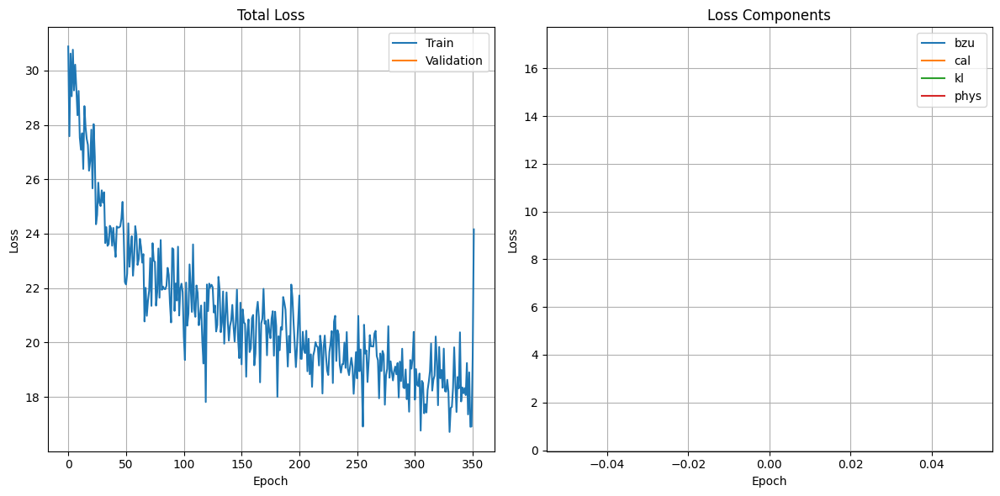


Epoch 1: Train Loss 16.9600 | Val Loss 16.7346 | LR 1.00e-04



Epoch 2: Train Loss 14.9810 | Val Loss 15.2344 | LR 1.00e-04



Epoch 3: Train Loss 13.4370 | Val Loss 13.5438 | LR 1.00e-04



Epoch 4: Train Loss 12.1306 | Val Loss 11.3286 | LR 1.00e-04



Epoch 5: Train Loss 11.0700 | Val Loss 11.0446 | LR 1.00e-04


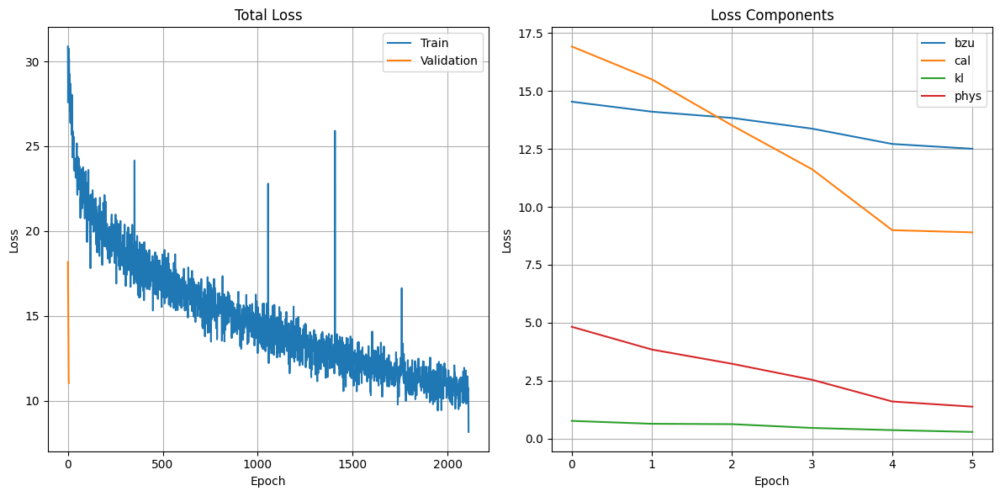


Epoch 6: Train Loss 10.3453 | Val Loss 10.2742 | LR 1.00e-04



Epoch 7: Train Loss 9.8040 | Val Loss 9.9684 | LR 1.00e-04



Epoch 8: Train Loss 9.4060 | Val Loss 9.7725 | LR 1.00e-04



Epoch 9: Train Loss 9.0065 | Val Loss 9.1227 | LR 1.00e-04



Epoch 10: Train Loss 8.6697 | Val Loss 8.7899 | LR 1.00e-04


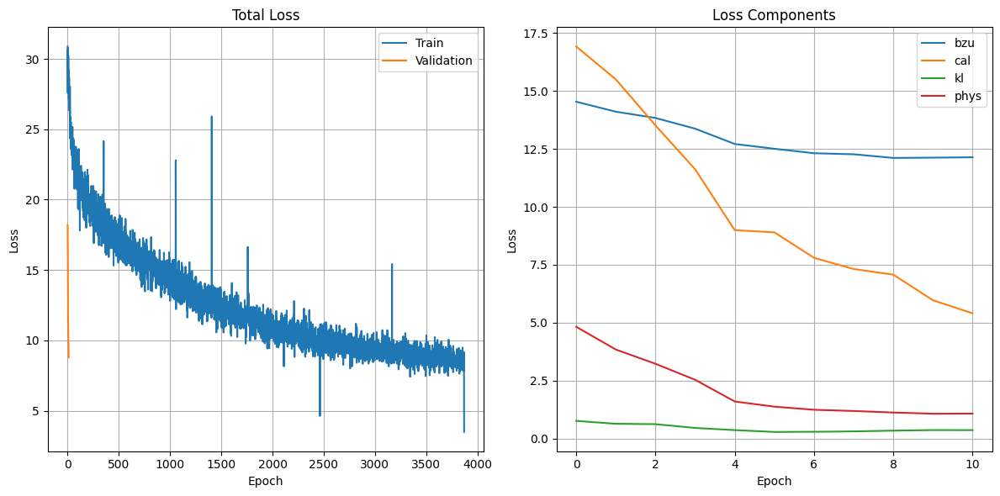


Epoch 11: Train Loss 8.3893 | Val Loss 8.3993 | LR 1.00e-04



Epoch 12: Train Loss 8.1649 | Val Loss 8.0950 | LR 1.00e-04



Epoch 13: Train Loss 7.9372 | Val Loss 8.2321 | LR 1.00e-04



Epoch 14: Train Loss 7.7759 | Val Loss 7.7111 | LR 1.00e-04



Epoch 15: Train Loss 7.6040 | Val Loss 7.4499 | LR 1.00e-04


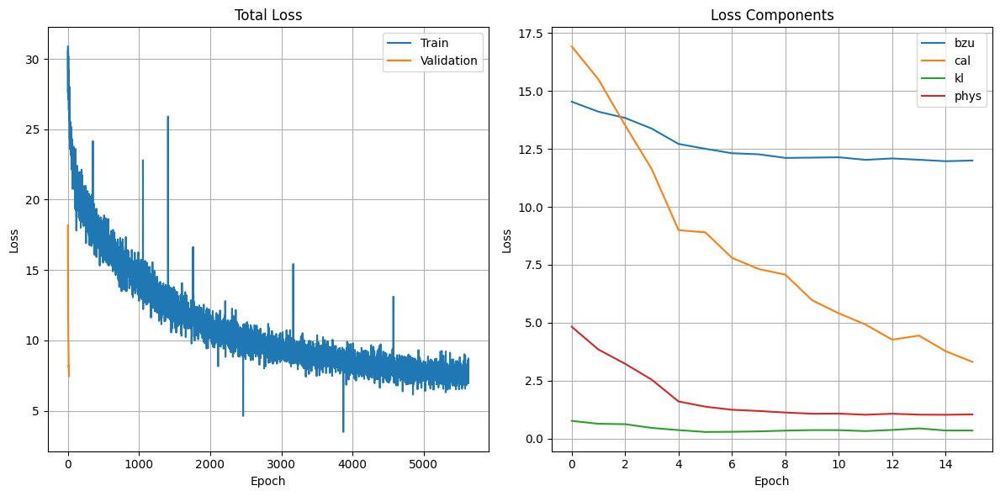


Epoch 16: Train Loss 7.4986 | Val Loss 7.2917 | LR 1.00e-04



Epoch 17: Train Loss 7.2827 | Val Loss 7.1008 | LR 1.00e-04



Epoch 18: Train Loss 7.1444 | Val Loss 6.9972 | LR 1.00e-04



Epoch 19: Train Loss 7.0223 | Val Loss 6.8670 | LR 1.00e-04



Epoch 20: Train Loss 6.9700 | Val Loss 6.8814 | LR 1.00e-04


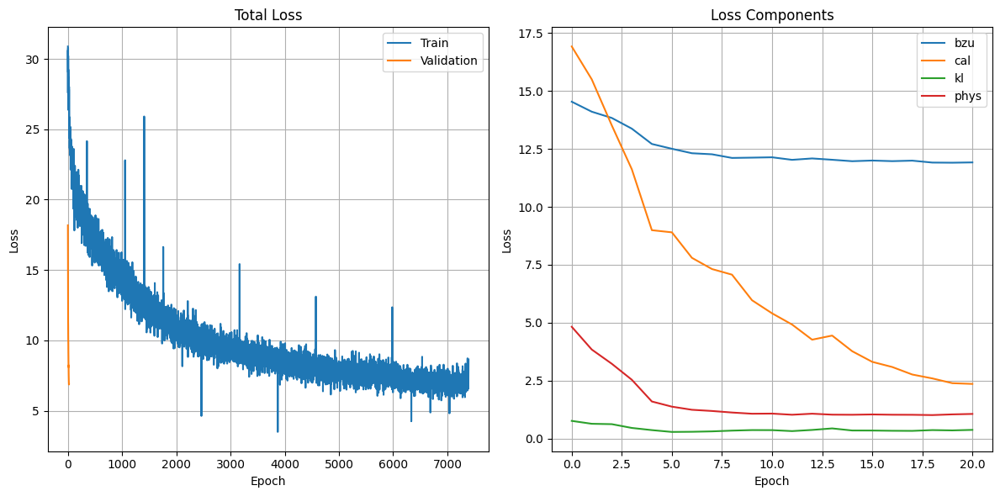


Epoch 21: Train Loss 6.8489 | Val Loss 6.8052 | LR 1.00e-04



Epoch 22: Train Loss 6.7755 | Val Loss 6.4816 | LR 1.00e-04



Epoch 23: Train Loss 6.6652 | Val Loss 6.5171 | LR 1.00e-04



Epoch 24: Train Loss 6.5536 | Val Loss 6.4286 | LR 1.00e-04



Epoch 25: Train Loss 6.4812 | Val Loss 6.4475 | LR 1.00e-04


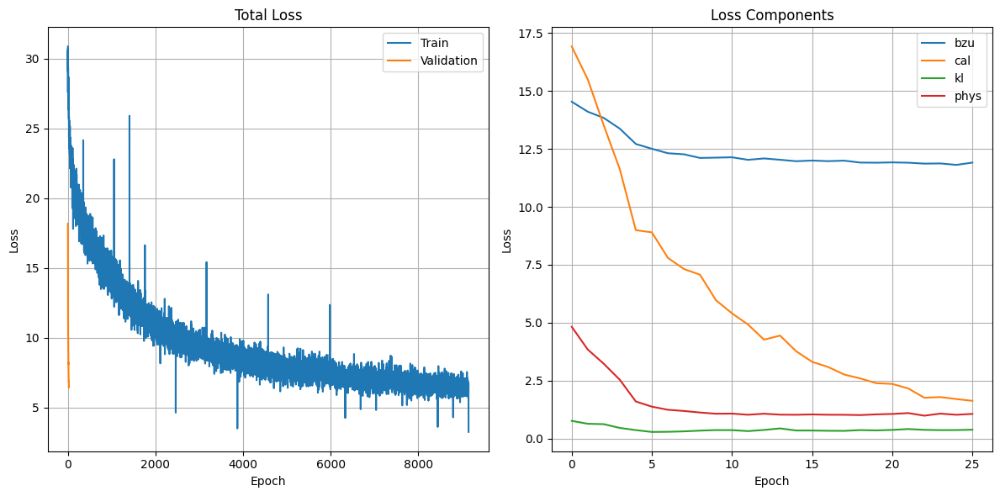


Epoch 26: Train Loss 6.4267 | Val Loss 6.3904 | LR 1.00e-04



Epoch 27: Train Loss 6.3700 | Val Loss 6.2771 | LR 1.00e-04



Epoch 28: Train Loss 6.3100 | Val Loss 6.3387 | LR 1.00e-04



Epoch 29: Train Loss 6.2847 | Val Loss 6.4438 | LR 1.00e-04



Epoch 30: Train Loss 6.2598 | Val Loss 6.2514 | LR 1.00e-04


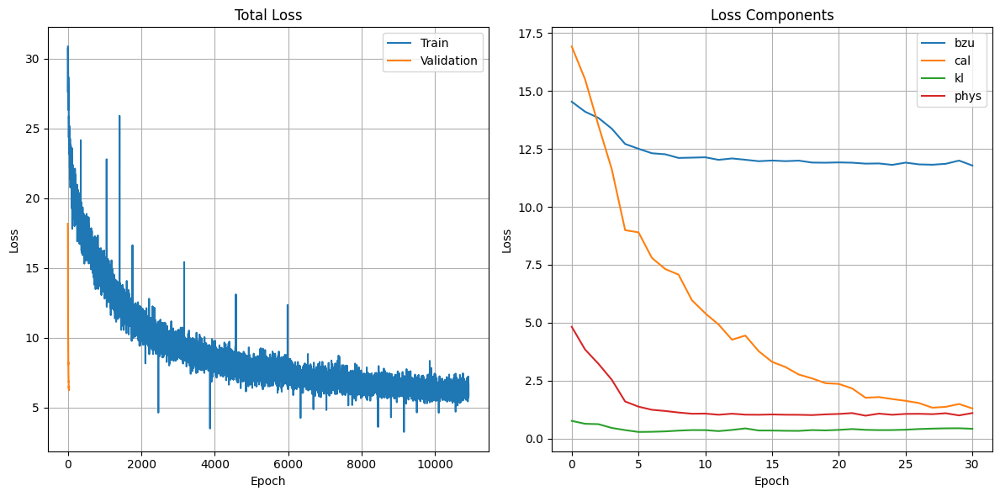


Epoch 31: Train Loss 6.2177 | Val Loss 6.3140 | LR 1.00e-04



Epoch 32: Train Loss 6.1961 | Val Loss 7.1845 | LR 1.00e-04



Epoch 33: Train Loss 6.1407 | Val Loss 6.6641 | LR 1.00e-04



Epoch 34: Train Loss 6.1184 | Val Loss 6.3380 | LR 5.00e-05



Epoch 35: Train Loss 5.9810 | Val Loss 6.0655 | LR 5.00e-05


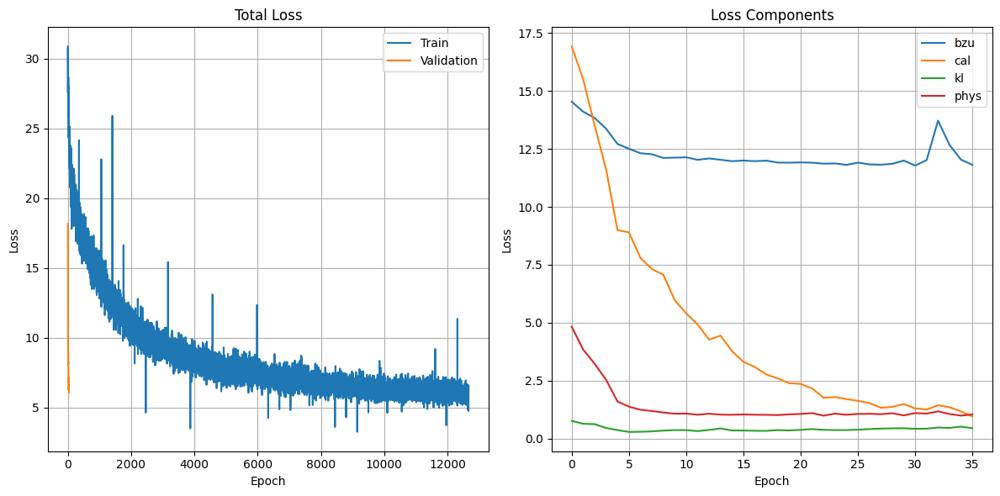


Epoch 36: Train Loss 5.9301 | Val Loss 6.1084 | LR 5.00e-05



Epoch 37: Train Loss 5.9055 | Val Loss 6.1748 | LR 5.00e-05



Epoch 38: Train Loss 5.8911 | Val Loss 6.1656 | LR 5.00e-05



Epoch 39: Train Loss 5.8888 | Val Loss 6.1671 | LR 2.50e-05



Epoch 40: Train Loss 5.8597 | Val Loss 6.0834 | LR 2.50e-05


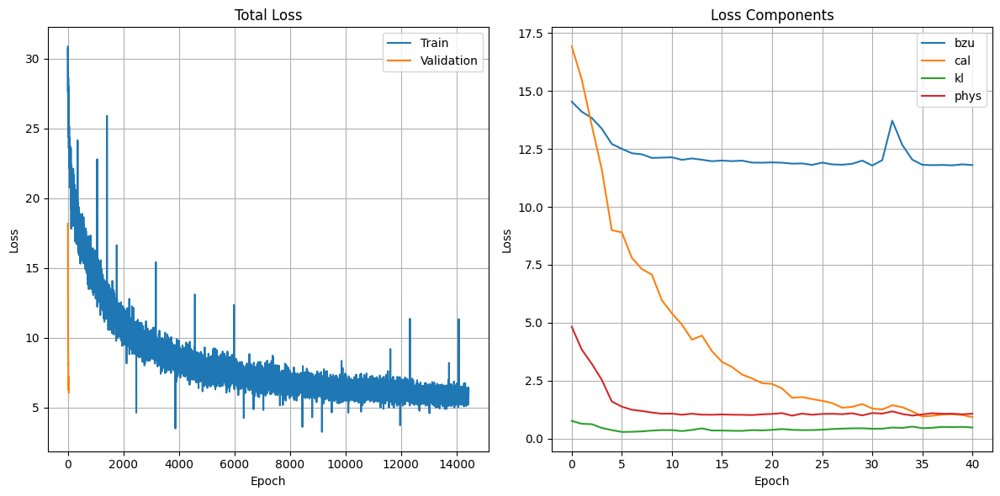


Epoch 41: Train Loss 5.8502 | Val Loss 6.2223 | LR 2.50e-05



Epoch 42: Train Loss 5.8360 | Val Loss 6.2898 | LR 2.50e-05



Epoch 43: Train Loss 5.8205 | Val Loss 6.1193 | LR 1.25e-05



Epoch 44: Train Loss 5.8094 | Val Loss 6.1291 | LR 1.25e-05



Epoch 45: Train Loss 5.8007 | Val Loss 6.2482 | LR 1.25e-05


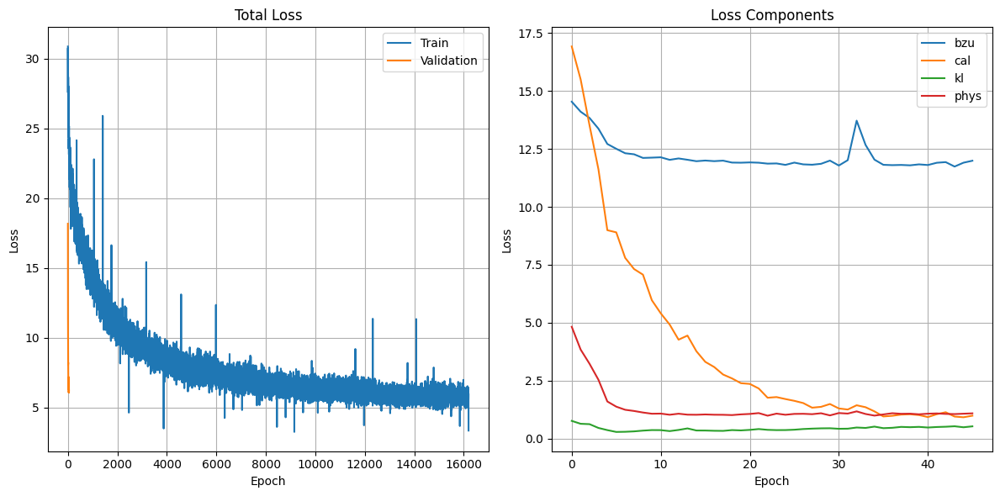


Epoch 46: Train Loss 5.8035 | Val Loss 6.3441 | LR 1.25e-05



Epoch 47: Train Loss 5.7968 | Val Loss 5.9825 | LR 1.25e-05



Epoch 48: Train Loss 5.7910 | Val Loss 6.2144 | LR 1.25e-05



Epoch 49: Train Loss 5.7772 | Val Loss 6.1584 | LR 1.25e-05


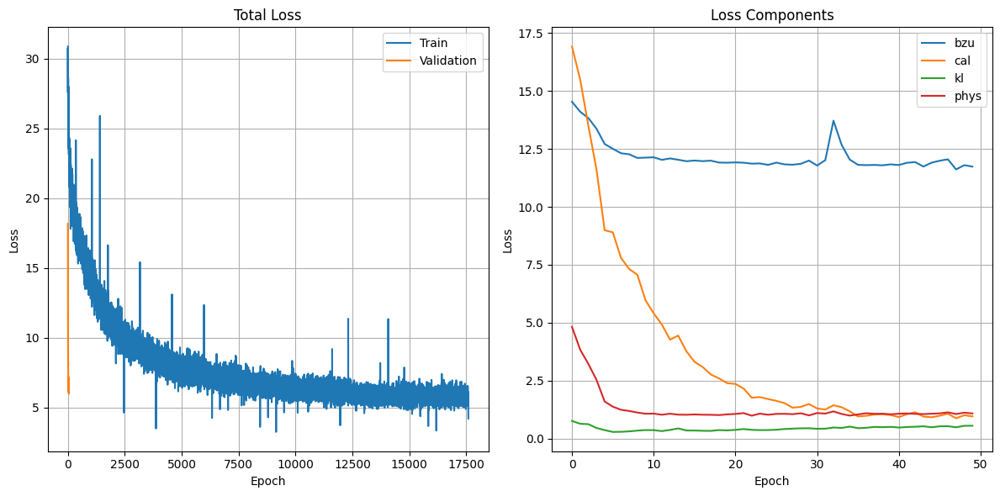

In [44]:
# Инициализация
predictor = FoodNutritionPredictor(device='cuda')

# Обучение с прогресс-баром
for epoch in range(50):
    train_losses = []
    train_bar = tqdm(train_dataloader, leave=False, desc=f'Epoch {epoch}')
    for batch in train_bar:
        loss_dict = predictor.train_step(batch)
        train_bar.set_postfix({
            'loss': f"{loss_dict['total'].item():.4f}",
            # 'weight': f"{loss_dict['weight'].item():.4f}",
            'cal': f"{loss_dict['cal'].item():.4f}",
            'phys': f"{loss_dict['phys'].item():.4f}",
            'kl': f"{loss_dict['kl'].item():.4f}",
            'bzu': f"{loss_dict['bzu'].item():.4f}"
        })
    
    # Валидация
    val_metrics = predictor.validate(val_dataloader)
    print(f"\nEpoch {epoch}: "
          f"Train Loss {np.mean(predictor.train_history['total'][-len(train_dataloader):]):.4f} | "
          f"Val Loss {val_metrics['total']:.4f} | "
          f"LR {predictor.optimizer.param_groups[0]['lr']:.2e}")
    
    # Визуализация каждые 5 эпох
    if epoch % 5 == 0 or epoch == 49:
        predictor.plot_losses()

In [58]:
sample = next(iter(test_dataloader))

# Перемещаем данные на то же устройство, что и модель
device = next(predictor.model.parameters()).device
inputs = sample['images'].to(device)

with torch.no_grad():
    predictor.model.eval()
    prediction = predictor.model(inputs)  # Не нужно перемещать на cuda, так как inputs уже на правильном устройстве
    
    print("\nPrediction:")
    for k, v in prediction.items():
        if torch.is_tensor(v):
            # Для тензоров - берем первые значения из батча
            if v.dim() > 1:
                # Для многомерных тензоров берем первый элемент батча
                print(f"{k:>20}: {v[0].cpu().numpy()}")
            else:
                print(f"{k:>20}: {v[0].item():.2f}")
        else:
            print(f"{k:>20}: {v}")


Prediction:
                 bzu: [6.175252 7.122669 8.339004]
            calories: 159.80
     bzu_proportions: [0.08141486 0.20997219 0.7086129 ]
      calculated_cal: 122.16


In [63]:
# Пример использования:
test_dataset = ValidRecipeDataset(
    valid_json_path='./processed_recipes/test_fix.json',
    transform=None  # Можно указать кастомные трансформации
)

test_dataloader = torch.utils.data.DataLoader(
    test_dataset,
    batch_size=96,
    shuffle=True,
    collate_fn=food_collate_fn,
    pin_memory=True
)

Loaded 2721 recipes with valid images


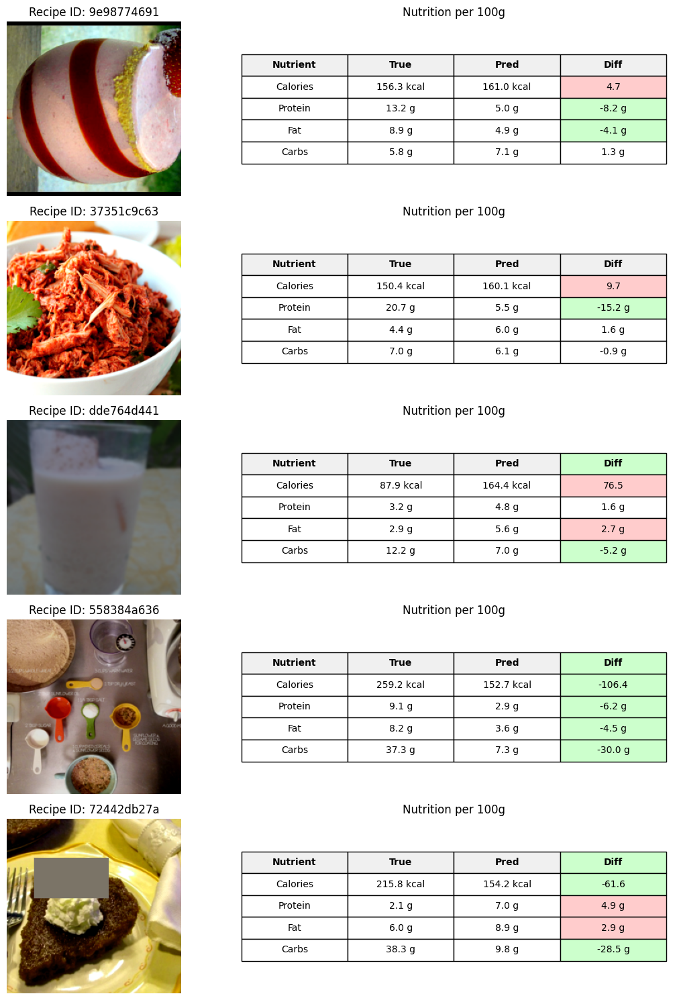

In [66]:
import matplotlib.pyplot as plt
import numpy as np

def visualize_predictions(model, dataloader, n_samples=5, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]):
    """Визуализирует изображения, оригинальные значения и предсказания"""
    # Получаем батч данных
    batch = next(iter(dataloader))
    images = batch['images']
    targets = batch['targets']
    recipe_ids = batch.get('recipe_ids', ['Unknown'] * len(images))
    
    # Определяем устройство модели
    device = next(model.parameters()).device
    
    # Получаем предсказания
    model.eval()
    with torch.no_grad():
        predictions = model(images.to(device))
    
    # Ограничиваем количество образцов
    n_samples = min(n_samples, len(images))
    
    # Создаем фигуру
    fig, axes = plt.subplots(n_samples, 2, figsize=(12, 3 * n_samples))
    if n_samples == 1:
        axes = axes.reshape(1, -1)
    
    for i in range(n_samples):
        # Денормализуем изображение
        img_tensor = images[i]
        for t, m, s in zip(img_tensor, mean, std):
            t.mul_(s).add_(m)
        img = img_tensor.permute(1, 2, 0).numpy()
        img = np.clip(img, 0, 1)
        
        # Отображаем изображение
        axes[i, 0].imshow(img)
        axes[i, 0].set_title(f"Recipe ID: {recipe_ids[i]}")
        axes[i, 0].axis('off')
        
        # Создаем таблицу с данными
        data = []
        headers = ["Nutrient", "True", "Pred", "Diff"]
        
        # Калории
        true_cal = targets['calories'][i].item()
        pred_cal = predictions['calories'][i].item()
        data.append([
            "Calories", 
            f"{true_cal:.1f} kcal", 
            f"{pred_cal:.1f} kcal", 
            f"{pred_cal - true_cal:.1f}"
        ])
        
        # БЖУ
        nutrients = ["Protein", "Fat", "Carbs"]
        for j, name in enumerate(nutrients):
            true_val = targets['bzu'][i][j].item()
            pred_val = predictions['bzu'][i][j].item()
            data.append([
                name,
                f"{true_val:.1f} g",
                f"{pred_val:.1f} g",
                f"{pred_val - true_val:.1f} g"
            ])
        
        # Создаем таблицу
        table = axes[i, 1].table(
            cellText=data,
            colLabels=headers,
            loc='center',
            cellLoc='center'
        )
        table.auto_set_font_size(False)
        table.set_fontsize(10)
        table.scale(1, 1.5)
        
        # Настраиваем внешний вид таблицы
        for (row, col), cell in table.get_celld().items():
            if row == 0:
                cell.set_text_props(weight='bold')
                cell.set_facecolor('#f0f0f0')
            if col == 3:  # Diff column
                diff = float(data[row-1][3].split()[0])
                if abs(diff) > 2.0:
                    cell.set_facecolor('#ffcccc' if diff > 0 else '#ccffcc')
        
        axes[i, 1].axis('off')
        axes[i, 1].set_title("Nutrition per 100g")
    
    plt.tight_layout()
    plt.show()

# Пример использования
visualize_predictions(predictor.model, test_dataloader, n_samples=5)

Evaluating test: 100%|██████████| 29/29 [00:30<00:00,  1.06s/it]


Metrics for Test Set:
------------------------------------------------------------
Calories MAE:       14870.22 kcal
Calories RMSE:      1993.25 kcal
Calories MAPE:      114142658040.95%
Protein MAE:        4.25 g
Fat MAE:            12.40 g
Carbs MAE:          19.82 g
Total samples:      2721
------------------------------------------------------------


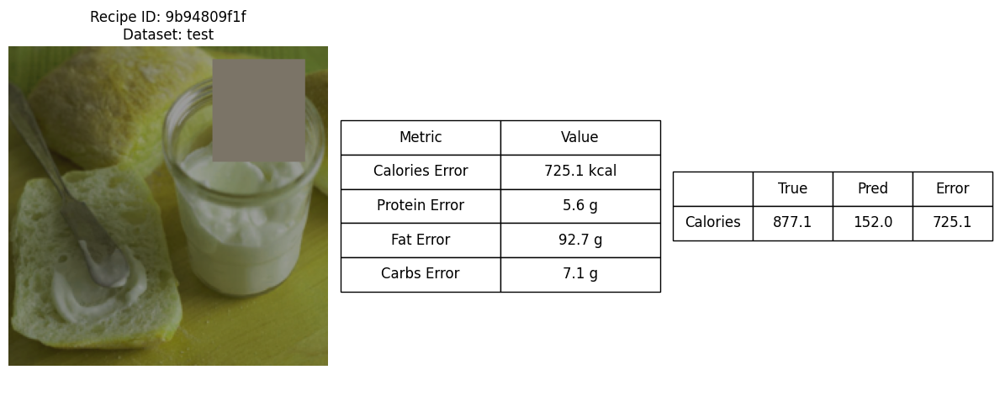

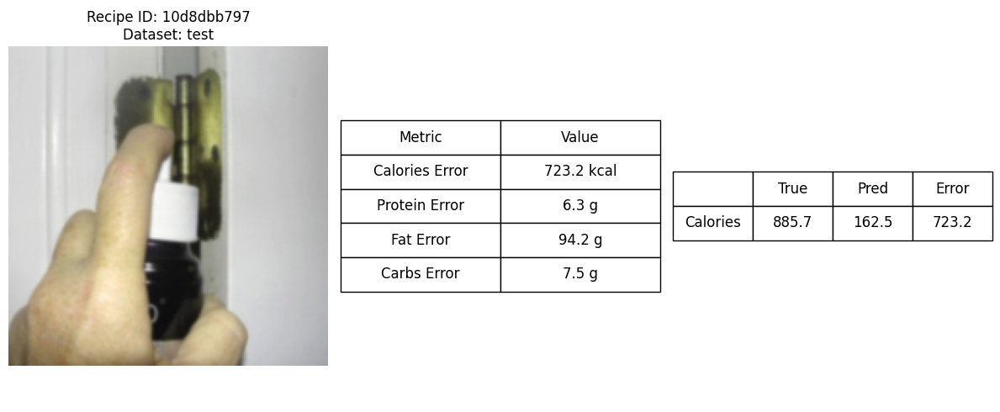

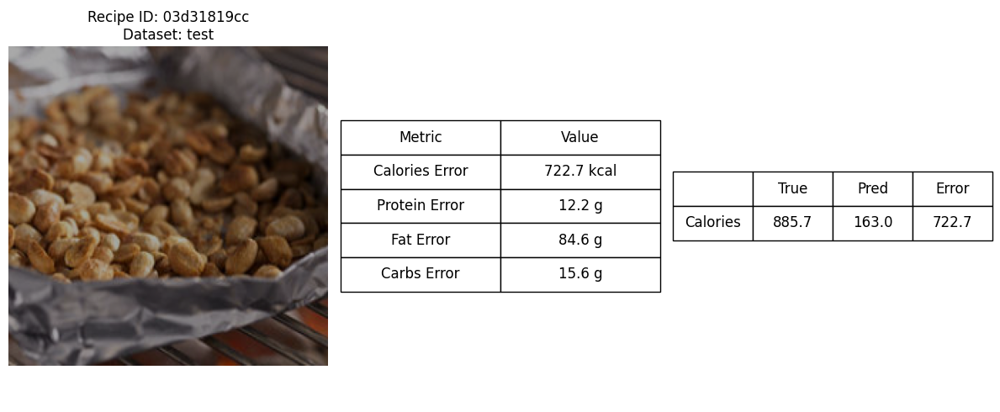

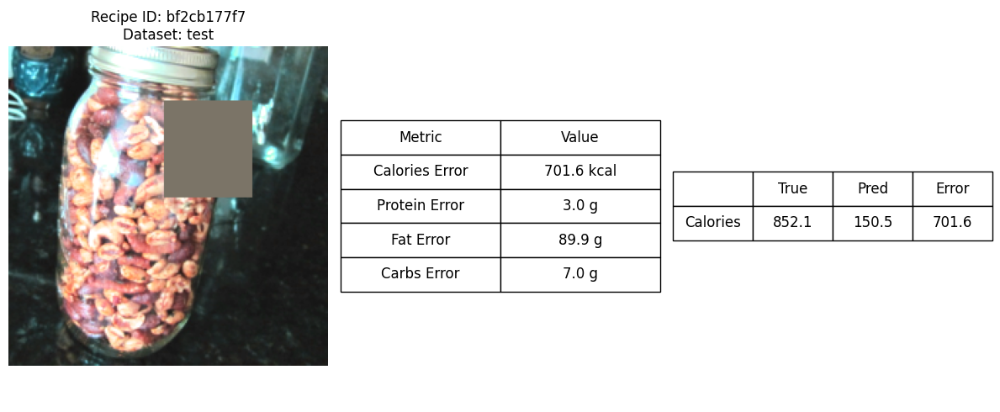

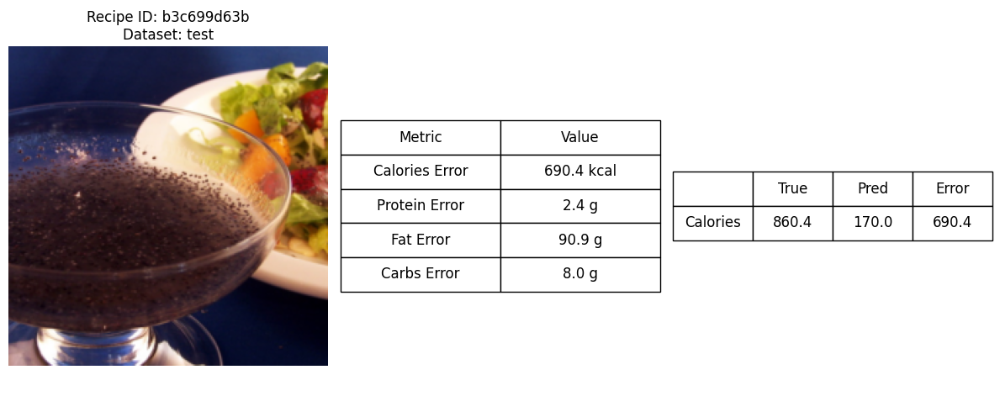


Error Analysis:
------------------------------------------------------------
Calories Error Stats:
count    2721.000000
mean      155.606513
std       132.038095
min         0.069046
25%        59.733734
50%       112.683708
75%       218.826752
max       725.132645
Name: calories_error, dtype: float64

Error Correlations:
                calories_error  protein_error  fat_error  carbs_error
calories_error        1.000000       0.135489   0.789492     0.087479
protein_error         0.135489       1.000000   0.157546    -0.050968
fat_error             0.789492       0.157546   1.000000    -0.155265
carbs_error           0.087479      -0.050968  -0.155265     1.000000


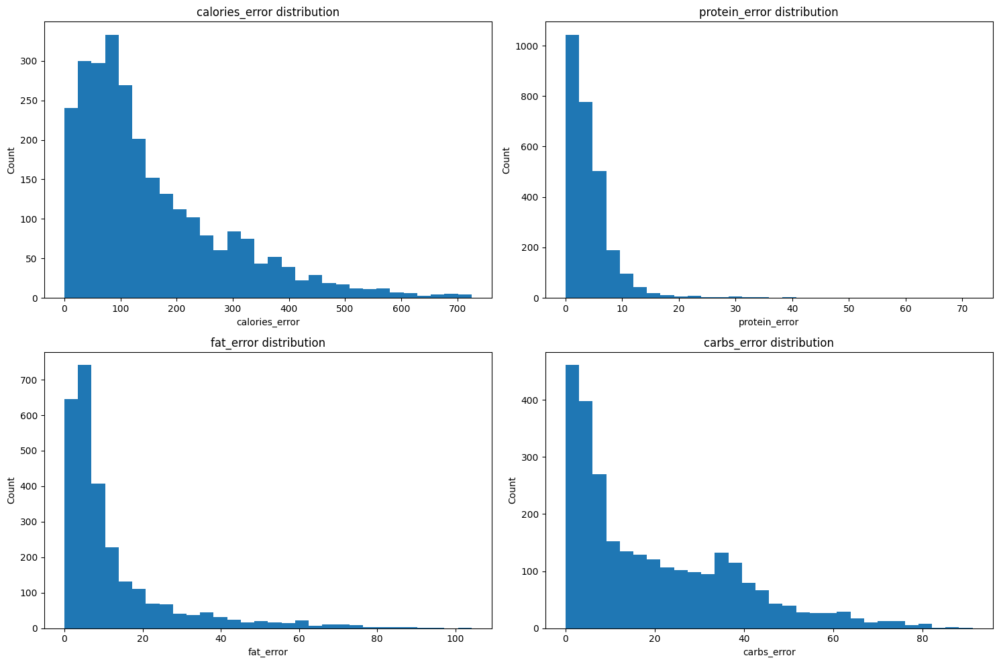

In [68]:
import numpy as np
import pandas as pd
from tqdm import tqdm
import matplotlib.pyplot as plt
from PIL import Image
import torch

def denormalize_image(tensor, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]):
    """Денормализует тензор изображения для отображения"""
    tensor = tensor.clone().cpu()
    for t, m, s in zip(tensor, mean, std):
        t.mul_(s).add_(m)
    tensor = torch.clamp(tensor, 0, 1)
    return tensor.permute(1, 2, 0).numpy()

def evaluate_model(model, dataloader, dataset_type='test'):
    """Вычисляет метрики и возвращает примеры с наибольшими ошибками"""
    device = next(model.parameters()).device
    model.eval()
    
    # Списки для хранения результатов
    sample_details = []
    
    # Основные метрики
    metrics = {
        'calories': {'mae': 0, 'rmse': 0, 'mape': 0},
        'protein': {'mae': 0},
        'fat': {'mae': 0},
        'carbs': {'mae': 0},
        'total_samples': 0
    }
    
    with torch.no_grad():
        for batch in tqdm(dataloader, desc=f"Evaluating {dataset_type}"):
            inputs = batch['images'].to(device)
            targets = {k: v.to(device) for k, v in batch['targets'].items()}
            
            # Получаем предсказания
            outputs = model(inputs)
            
            # Рассчитываем ошибки
            calories_error = (outputs['calories'] - targets['calories']).abs()
            calories_relative = (calories_error / (targets['calories'] + 1e-8)).abs()
            bzu_error = (outputs['bzu'] - targets['bzu']).abs()
            
            # Обновляем метрики
            batch_size = inputs.size(0)
            metrics['calories']['mae'] += calories_error.sum().item()
            metrics['calories']['rmse'] += (calories_error**2).sum().item()
            metrics['calories']['mape'] += calories_relative.sum().item()
            metrics['protein']['mae'] += bzu_error[:, 0].sum().item()
            metrics['fat']['mae'] += bzu_error[:, 1].sum().item()
            metrics['carbs']['mae'] += bzu_error[:, 2].sum().item()
            metrics['total_samples'] += batch_size
            
            # Сохраняем детали для анализа ошибок
            for i in range(batch_size):
                error_info = {
                    'dataset': dataset_type,
                    'recipe_id': batch['recipe_ids'][i],
                    'image_path': batch['image_paths'][i],
                    'image_tensor': batch['images'][i],
                    'calories_true': targets['calories'][i].item(),
                    'calories_pred': outputs['calories'][i].item(),
                    'protein_true': targets['bzu'][i][0].item(),
                    'protein_pred': outputs['bzu'][i][0].item(),
                    'fat_true': targets['bzu'][i][1].item(),
                    'fat_pred': outputs['bzu'][i][1].item(),
                    'carbs_true': targets['bzu'][i][2].item(),
                    'carbs_pred': outputs['bzu'][i][2].item(),
                }
                sample_details.append(error_info)
    
    # Рассчитываем итоговые метрики
    n = metrics['total_samples']
    metrics['calories']['mae'] /= n
    metrics['calories']['rmse'] = np.sqrt(metrics['calories']['rmse'] / n)
    metrics['calories']['mape'] = (metrics['calories']['mape'] / n) * 100  # в процентах
    metrics['protein']['mae'] /= n
    metrics['fat']['mae'] /= n
    metrics['carbs']['mae'] /= n
    
    # Создаем DataFrame с ошибками
    errors_df = pd.DataFrame(sample_details)
    errors_df['calories_error'] = (errors_df['calories_pred'] - errors_df['calories_true']).abs()
    errors_df['protein_error'] = (errors_df['protein_pred'] - errors_df['protein_true']).abs()
    errors_df['fat_error'] = (errors_df['fat_pred'] - errors_df['fat_true']).abs()
    errors_df['carbs_error'] = (errors_df['carbs_pred'] - errors_df['carbs_true']).abs()
    
    # Находим примеры с наибольшими ошибками
    top_cal_errors = errors_df.nlargest(5, 'calories_error')
    top_prot_errors = errors_df.nlargest(5, 'protein_error')
    top_fat_errors = errors_df.nlargest(5, 'fat_error')
    top_carbs_errors = errors_df.nlargest(5, 'carbs_error')
    
    return metrics, errors_df, {
        'calories': top_cal_errors,
        'protein': top_prot_errors,
        'fat': top_fat_errors,
        'carbs': top_carbs_errors
    }

def print_metrics(metrics, dataset_name):
    """Выводит метрики в читаемом формате"""
    print(f"\nMetrics for {dataset_name}:")
    print("-" * 60)
    print(f"{'Calories MAE:':<20}{metrics['calories']['mae']:.2f} kcal")
    print(f"{'Calories RMSE:':<20}{metrics['calories']['rmse']:.2f} kcal")
    print(f"{'Calories MAPE:':<20}{metrics['calories']['mape']:.2f}%")
    print(f"{'Protein MAE:':<20}{metrics['protein']['mae']:.2f} g")
    print(f"{'Fat MAE:':<20}{metrics['fat']['mae']:.2f} g")
    print(f"{'Carbs MAE:':<20}{metrics['carbs']['mae']:.2f} g")
    print(f"{'Total samples:':<20}{metrics['total_samples']}")
    print("-" * 60)

def visualize_top_errors(top_errors_dict, nutrient_type='calories'):
    """Визуализирует примеры с наибольшими ошибками для конкретного нутриента"""
    top_errors = top_errors_dict[nutrient_type]
    
    for _, row in top_errors.iterrows():
        # Подготовка изображения
        img = denormalize_image(row['image_tensor'])
        
        # Создаем фигуру
        plt.figure(figsize=(12, 5))
        
        # Изображение
        plt.subplot(1, 3, 1)
        plt.imshow(img)
        plt.title(f"Recipe ID: {row['recipe_id']}\nDataset: {row['dataset']}")
        plt.axis('off')
        
        # Таблица с ошибками
        plt.subplot(1, 3, 2)
        data = [
            ["Metric", "Value"],
            ["Calories Error", f"{row['calories_error']:.1f} kcal"],
            ["Protein Error", f"{row['protein_error']:.1f} g"],
            ["Fat Error", f"{row['fat_error']:.1f} g"],
            ["Carbs Error", f"{row['carbs_error']:.1f} g"]
        ]
        table = plt.table(cellText=data, loc='center', cellLoc='center')
        table.auto_set_font_size(False)
        table.set_fontsize(12)
        table.scale(1, 2)
        plt.axis('off')
        
        # Таблица с конкретным нутриентом
        plt.subplot(1, 3, 3)
        nutrient_data = [
            ["", "True", "Pred", "Error"],
            [nutrient_type.capitalize(), 
             f"{row[f'{nutrient_type}_true']:.1f}", 
             f"{row[f'{nutrient_type}_pred']:.1f}", 
             f"{row[f'{nutrient_type}_error']:.1f}"]
        ]
        nutrient_table = plt.table(cellText=nutrient_data, loc='center', cellLoc='center')
        nutrient_table.auto_set_font_size(False)
        nutrient_table.set_fontsize(12)
        nutrient_table.scale(1, 2)
        plt.axis('off')
        
        plt.tight_layout()
        plt.show()

def analyze_errors(errors_df):
    """Анализ распределения ошибок"""
    print("\nError Analysis:")
    print("-" * 60)
    
    # Основные статистики
    print("Calories Error Stats:")
    print(errors_df['calories_error'].describe())
    
    # Корреляции между ошибками
    print("\nError Correlations:")
    error_cols = ['calories_error', 'protein_error', 'fat_error', 'carbs_error']
    print(errors_df[error_cols].corr())
    
    # Визуализация распределения ошибок
    plt.figure(figsize=(15, 10))
    
    for i, col in enumerate(error_cols):
        plt.subplot(2, 2, i+1)
        plt.hist(errors_df[col], bins=30)
        plt.title(f'{col} distribution')
        plt.xlabel(col)
        plt.ylabel('Count')
    
    plt.tight_layout()
    plt.show()

# Пример использования
test_metrics, test_errors_df, test_top_errors = evaluate_model(predictor.model, test_dataloader, 'test')
print_metrics(test_metrics, 'Test Set')
visualize_top_errors(test_top_errors, 'calories')
analyze_errors(test_errors_df)

# Сохранение результатов
test_errors_df.to_csv('test_set_errors.csv', index=False)

In [69]:
import torch
import os

# Создать папку, если её нет
os.makedirs('models', exist_ok=True)

# Сохранить только веса модели
torch.save(predictor.model.state_dict(), 'models/b1_bzu_call.pth')

In [ ]:
class CompositeFoodLoss(nn.Module):
    """
    Комбинированная функция потерь:
    - MSE для веса
    - MSE для абсолютных значений БЖУ
    - MSE для калорий
    - KL-дивергенция для пропорций БЖУ
    - Физическая согласованность калорий
    """
    def __init__(self, weights={'bzu':1.4, 'cal':1.6, 'kl':10.}):
        super().__init__()
        self.weights = weights
        self.mse = nn.MSELoss()
        self.kl = nn.KLDivLoss(reduction='batchmean')
        self.huber = nn.SmoothL1Loss(beta=0.5)
        
    def forward(self, outputs, targets):
        # Основные потери

        loss_b = self.huber(outputs['bzu'][:, 0], targets['bzu'][:, 0])
        loss_zh = self.huber(outputs['bzu'][:, 1], targets['bzu'][:, 1])
        loss_u = self.huber(outputs['bzu'][:, 2], targets['bzu'][:, 2])
        
        # KL-дивергенция для пропорций
        true_proportions = targets['bzu_proportions'] 
        loss_kl = self.kl(torch.log(outputs['bzu_proportions'] + 1e-8), true_proportions)
        
        # Физическая согласованность
        loss_phys = self.mse(
            torch.log1p(outputs['calculated_cal']), torch.log1p(targets['calories'])
        )

        total_loss = (
            self.weights['b'] * loss_b +
            self.weights['zh'] * loss_zh +
            self.weights['u'] * loss_u +
            self.weights['cal'] * loss_phys +
            self.weights['kl'] * loss_kl
        )
        
        return {
            'total': total_loss,
            'b': loss_b,
            'zh': loss_zh, 
            'u': loss_u,
            'kl': loss_kl,
            'phys': loss_phys
        }

In [42]:

import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models
import math

class AdvancedNutritionHead(nn.Module):
    def __init__(self, in_features, out_features, dropout=0.3, use_residual=True):
        super().__init__()
        hidden_dim = max(in_features // 2, 128)  # Минимум 128 нейронов
        
        self.use_residual = use_residual and (in_features == out_features)
        
        # Основные слои
        self.fc1 = nn.Linear(in_features, hidden_dim)
        self.bn1 = nn.BatchNorm1d(hidden_dim)
        self.dropout1 = nn.Dropout(dropout)
        
        self.fc2 = nn.Linear(hidden_dim, hidden_dim // 2)
        self.bn2 = nn.BatchNorm1d(hidden_dim // 2)
        self.dropout2 = nn.Dropout(dropout * 0.5)
        
        self.fc3 = nn.Linear(hidden_dim // 2, out_features)
        
        # Residual connection (если размерности совпадают)
        if self.use_residual:
            self.residual = nn.Linear(in_features, out_features)
            
        self._init_weights()
    
    def _init_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Linear):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)
    
    def forward(self, x):
        identity = x
        
        x = self.fc1(x)
        x = F.silu(self.bn1(x))
        x = self.dropout1(x)
        
        x = self.fc2(x)
        x = F.silu(self.bn2(x))
        x = self.dropout2(x)
        
        x = self.fc3(x)
        
        # Residual connection
        if self.use_residual:
            x = x + self.residual(identity)
        
        return F.relu(x)

class AttentionPooling(nn.Module):
    def __init__(self, in_features):
        super().__init__()
        self.attention = nn.Sequential(
            nn.Linear(in_features, in_features // 4),
            nn.ReLU(),
            nn.Linear(in_features // 4, 1),
            nn.Sigmoid()
        )
        
    def forward(self, x):
        weights = self.attention(x)
        return x * weights

class EnhancedFoodNutritionNet(nn.Module):
    def __init__(self, backbone='resnet50', pretrained=True, 
                 use_attention=True, dropout=0.2):
        """
        Args:
            backbone: тип backbone (efficientnet_b1, efficientnet_b2, resnet50)
            pretrained: использовать предобученные веса
            use_attention: использовать attention pooling
            feature_fusion: использовать fusion разных уровней признаков
        """
        super().__init__()
        
        # Backbone
        self.backbone_name = backbone
        if backbone == 'efficientnet_b1':
            self.backbone = models.efficientnet_b1(weights='IMAGENET1K_V1' if pretrained else None)
            in_features = self.backbone.classifier[1].in_features
        elif backbone == 'efficientnet_b2':
            self.backbone = models.efficientnet_b2(weights='IMAGENET1K_V1' if pretrained else None)
            in_features = self.backbone.classifier[1].in_features
        elif backbone == 'resnet50':
            self.backbone = models.resnet50(weights='IMAGENET1K_V1' if pretrained else None)
            in_features = self.backbone.fc.in_features
            self.backbone.fc = nn.Identity()
        else:
            raise ValueError(f"Неподдерживаемый backbone: {backbone}")
            
        if 'efficientnet' in backbone:
            self.backbone.classifier = nn.Identity()
        

 
        fusion_features = in_features
        
        self.use_attention = use_attention
        if use_attention:
            self.attention_pool = AttentionPooling(fusion_features)
        
        self.shared_fc = nn.Sequential(
            nn.Linear(fusion_features, 1024),
            nn.BatchNorm1d(1024),
            nn.SiLU(),
            nn.Dropout(dropout),
            
            nn.Linear(1024, 512),
            nn.BatchNorm1d(512),
            nn.SiLU(),
            nn.Dropout(dropout * 0.5),
            
            # Дополнительный слой для лучшего разделения признаков
            nn.Linear(512, 256),
            nn.BatchNorm1d(256),
            nn.SiLU(),
        )
        
        # Специализированные головы
        self.bzu_head = AdvancedNutritionHead(256, 3)
        
        # # Отдельные головы для каждого компонента (эксперимент)
        self.protein_head = AdvancedNutritionHead(256, 1)
        self.fat_head = AdvancedNutritionHead(256, 1)
        self.carb_head = AdvancedNutritionHead(256, 1)

        self.combination_weight = nn.Parameter(torch.tensor(0.7))
        
        self._init_weights()
    
    def _register_hooks(self):
        def hook_fn(name):
            def hook(module, input, output):
                self.feature_hooks[name] = output
            return hook
        
        if hasattr(self.backbone, 'features'):
            self.backbone.features[-2].register_forward_hook(hook_fn('mid_features'))
    
    def _init_weights(self):
        """Улучшенная инициализация весов"""
        for name, module in self.named_modules():
            if isinstance(module, nn.Linear):
                if 'head' in name:
                    # Более консервативная инициализация для голов
                    nn.init.xavier_normal_(module.weight, gain=0.5)
                else:
                    nn.init.kaiming_normal_(module.weight, mode='fan_out', nonlinearity='relu')
                if module.bias is not None:
                    nn.init.constant_(module.bias, 0)
            elif isinstance(module, nn.BatchNorm1d):
                nn.init.constant_(module.weight, 1)
                nn.init.constant_(module.bias, 0)
    
    def forward(self, x):

        features = self.backbone(x)
        
        # Attention pooling
        if self.use_attention:
            features = self.attention_pool(features)
        
        # Обработка признаков
        shared = self.shared_fc(features)
        
        # Предсказания о

        bzu_general = self.bzu_head(shared)
        
        # Предсказания от отдельных голов
        protein_specific = self.protein_head(shared)
        fat_specific = self.fat_head(shared)
        carb_specific = self.carb_head(shared)
        
    
        w = torch.sigmoid(self.combination_weight)
        bzu_specific = torch.cat([protein_specific, fat_specific, carb_specific], dim=1)
        bzu = w * bzu_general + (1 - w) * bzu_specific
        
        # bzu = bzu_specific
        # Обеспечиваем положительность
        bzu = F.relu(bzu) + 1e-6
        
        # Пропорции БЖУ
        bzu_sum = bzu.sum(dim=1, keepdim=True) + 1e-8
        bzu_proportions = bzu / bzu_sum
        
        # Калории по формуле 4-4-9
        calculated_cal = 4 * bzu[:, 0] + 9 * bzu[:, 1] + 4 * bzu[:, 2]
        
        
        return {
            'bzu': bzu,
            'bzu_general': bzu_general,
            'bzu_specific': bzu_specific,

            # 'bzu_specific': bzu_specific,
            'calculated_cal': calculated_cal,
            'bzu_proportions': bzu_proportions,
            'combination_weight': w,
        }

In [36]:

class AdaptiveFoodLoss(nn.Module):
    def __init__(self, initial_weights=None, adaptation_rate=0.01):
        super().__init__()
        
        if initial_weights is None:
            self.weights = {
                'b': 1.0,
                'zh': 1.2,
                'u': 1.5,      # Начинаем с высокого веса для углеводов
                'cal': 0.5,
                'kl': 0.1
            }
        else:
            self.weights = initial_weights
            
        self.adaptation_rate = adaptation_rate
        self.loss_history = {'b': [], 'zh': [], 'u': [], 'cal': [], 'kl': []}
        self.mse = nn.MSELoss()
        self.huber = nn.SmoothL1Loss()
        
    def update_weights(self):
        """Адаптация весов на основе истории лоссов"""
        if len(self.loss_history['u']) > 10:  # Достаточно истории
            # Если углеводы все еще плохо предсказываются, увеличиваем вес
            recent_u_loss = sum(self.loss_history['u'][-5:]) / 5
            recent_b_loss = sum(self.loss_history['b'][-5:]) / 5
            recent_zh_loss = sum(self.loss_history['zh'][-5:]) / 5
            
            # Нормализуем по среднему
            avg_loss = (recent_u_loss + recent_b_loss + recent_zh_loss) / 3
            
            if recent_u_loss > avg_loss * 1.5:  # Углеводы значительно хуже
                self.weights['u'] = min(self.weights['u'] * 1.1, 5.0)  # Увеличиваем, но ограничиваем
                print(f"Увеличен вес углеводов до {self.weights['u']:.2f}")
            elif recent_u_loss < avg_loss * 0.8:  # Углеводы стали лучше
                self.weights['u'] = max(self.weights['u'] * 0.95, 1.0)  # Уменьшаем
                
    def forward(self, outputs,targets):
        loss_b = self.huber(outputs['bzu'][:, 0], targets['bzu'][:, 0])
        loss_zh = self.huber(outputs['bzu'][:, 1], targets['bzu'][:, 1])
        loss_u = self.huber(outputs['bzu'][:, 2], targets['bzu'][:, 2])
        loss_phys = self.mse(
            torch.log1p(outputs['calculated_cal']), torch.log1p(targets['calories'])
        )
 
        target_proportions = targets['bzu'] / (targets['bzu'].sum(dim=1, keepdim=True) + 1e-8)
        loss_kl = F.kl_div(
            F.log_softmax(outputs['bzu'], dim=1),
            target_proportions,
            reduction='batchmean'
        )

        
        # Сохраняем историю
        self.loss_history['b'].append(loss_b.item())
        self.loss_history['zh'].append(loss_zh.item())
        self.loss_history['u'].append(loss_u.item())
        self.loss_history['cal'].append(loss_phys.item())
        self.loss_history['kl'].append(loss_kl.item())
        
   
        for key in self.loss_history:
            if len(self.loss_history[key]) > 200:
                self.loss_history[key] = self.loss_history[key][-200:]
        
        total_loss = (
            self.weights['b'] * loss_b +
            self.weights['zh'] * loss_zh +
            self.weights['u'] * loss_u +
            self.weights['cal'] * loss_phys +
            self.weights['kl'] * loss_kl
        )
        
        return {
            'total': total_loss,
            'b': loss_b,
            'zh': loss_zh, 
            'u': loss_u,
            'kl': loss_kl,
            'phys': loss_phys
        }



In [43]:
class CompositeFoodLoss(nn.Module):
    """
    Комбинированная функция потерь:
    - MSE для веса
    - MSE для абсолютных значений БЖУ
    - MSE для калорий
    - KL-дивергенция для пропорций БЖУ
    - Физическая согласованность калорий
    """
    def __init__(self, weights={
            'b': 1.0,
            'zh': 1.2,
            'u': 1.5,      # Начинаем с высокого веса для углеводов
            'cal': 1.0,
            'kl': 0.1}):
        super().__init__()
        self.weights = weights
        
        self.mse = nn.MSELoss()
        self.kl = nn.KLDivLoss(reduction='batchmean')
        self.huber = nn.SmoothL1Loss(beta=0.5)
        
    def forward(self, outputs, targets):
        # Основные потери

        loss_b = self.huber(outputs['bzu'][:, 0], targets['bzu'][:, 0])
        loss_zh = self.huber(outputs['bzu'][:, 1], targets['bzu'][:, 1])
        loss_u = self.huber(outputs['bzu'][:, 2], targets['bzu'][:, 2])
        
        # KL-дивергенция для пропорций
        true_proportions = targets['bzu_proportions'] 
        loss_kl = self.kl(torch.log(outputs['bzu_proportions'] + 1e-8), true_proportions)
        
        # Физическая согласованность
        loss_phys = self.mse(
            torch.log1p(outputs['calculated_cal']), torch.log1p(targets['calories'])
        )

        total_loss = (
            self.weights['b'] * loss_b +
            self.weights['zh'] * loss_zh +
            self.weights['u'] * loss_u +
            self.weights['cal'] * loss_phys
              + self.weights['kl'] * loss_kl
        )
        
        return {
            'total': total_loss,
            'b': loss_b,
            'zh': loss_zh, 
            'u': loss_u,
            'kl': loss_kl,
            'phys': loss_phys
        }

In [ ]:

import matplotlib.pyplot as plt
from tqdm import tqdm
import numpy as np
import torch
import torch.nn as nn
import os
from datetime import datetime

class EnhancedFoodNutritionPredictor:
    def __init__(self, model_config=None, device='cuda'):
        self.device = torch.device(device if torch.cuda.is_available() else 'cpu')
        
        # Конфигурация модели по умолчанию
        default_config = {
            'backbone': 'efficientnet_b1',
            'pretrained': True,
            'use_attention': False,
        }
        
        if model_config:
            default_config.update(model_config)
        
        # Создаем модель
        self.model = EnhancedFoodNutritionNet(**default_config).to(self.device)
        
        # Адаптивная функция потерь с акцентом на углеводы
        self.criterion = CompositeFoodLoss({
            'b': 1.0,
            'zh': 1.2,
            'u': 3.0,
            'cal': 0.5,
            'kl': 0.1
        })
        
        # Оптимизатор с разными learning rate для backbone и голов
        self.optimizer = self._setup_optimizer()
        
        # Планировщик learning rate
        self.scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
            self.optimizer, 
            mode='min', 
            patience=5, 
            factor=0.7,
            min_lr=1e-7,
            verbose=True
        )
        
        # Сохранение лучшей модели
        self.best_val_loss = float('inf')
        self.model_saver = ModelSaver(save_dir='models/enhanced')
        
        # Расширенная история метрик
        self.train_history = {
            'total': [], 'b': [], 'zh': [], 'u': [], 'kl': [], 'phys': [],
            'bzu_general': [], 'bzu_specific': [], 'combination_weight': []
        }
        self.val_history = {
            'total': [], 'b': [], 'zh': [], 'u': [], 'kl': [], 'phys': [],
            'mae_b': [], 'mae_zh': [], 'mae_u': [], 'mae_cal': [],
            'mape_b': [], 'mape_zh': [], 'mape_u': [], 'mape_cal': []
        }
        
    def _setup_optimizer(self):

        optimizer = torch.optim.AdamW([
            {'params':  self.model.parameters(), 'lr': 1e-4, 'weight_decay': 1e-5}
        ])
        
        return optimizer
    
    def train_step(self, batch):
        """Один шаг обучения"""
        self.model.train()
        images = batch['images'].to(self.device)
        targets = {k: v.to(self.device) for k, v in batch['targets'].items()}
        
        self.optimizer.zero_grad()
        outputs = self.model(images)

        loss_dict = self.criterion(outputs, targets)
        loss_dict['total'].backward()
        loss_dict['bzu_general'] = outputs['bzu_general'].mean()
        loss_dict['bzu_specific'] = outputs['bzu_specific'].mean()
        loss_dict['w'] = outputs['combination_weight'].mean()

        torch.nn.utils.clip_grad_norm_(self.model.parameters(), max_norm=100.0)
        
        self.optimizer.step()
        

        self._update_train_history(loss_dict, outputs)
        
        return loss_dict
    
    def _update_train_history(self, loss_dict, outputs):
        """Обновление истории обучения"""
        for k in ['total', 'b', 'zh', 'u', 'kl', 'phys']:
            if k in loss_dict:
                self.train_history[k].append(loss_dict[k].item())
        

        if 'combination_weight' in outputs:
            self.train_history['combination_weight'].append(
                outputs['combination_weight'].mean().item()
            )
        
        # Можно добавить расхождение между общими и специфичными предсказаниями
        if 'bzu_general' in outputs and 'bzu_specific' in outputs:
            diff = torch.mean(torch.abs(outputs['bzu_general'] - outputs['bzu_specific']))
            self.train_history['bzu_general'].append(diff.item())
    
    def validate(self, dataloader):
        """Валидация с расширенными метриками"""
        self.model.eval()
        
        # Инициализация метрик
        loss_metrics = {k: 0.0 for k in ['total', 'b', 'zh', 'u', 'kl', 'phys']}
        error_metrics = {
            'mae_b': 0.0, 'mae_zh': 0.0, 'mae_u': 0.0, 'mae_cal': 0.0,
            'mape_b': 0.0, 'mape_zh': 0.0, 'mape_u': 0.0, 'mape_cal': 0.0
        }
        
        all_predictions = {'bzu': [], 'calories': []}
        all_targets = {'bzu': [], 'calories': []}
         
        with torch.no_grad():
            for batch in tqdm(dataloader, desc="Validation"):
                images = batch['images'].to(self.device)
                targets = {k: v.to(self.device) for k, v in batch['targets'].items()}
                
                outputs = self.model(images)
                loss_dict = self.criterion(outputs, targets)
                
                # Накапливаем лоссы
                for k in loss_metrics.keys():
                    if k in loss_dict:
                        loss_metrics[k] += loss_dict[k].item()
                
                # Сохраняем предсказания для расчета метрик
                all_predictions['bzu'].append(outputs['bzu'].cpu())
                all_predictions['calories'].append(outputs['calculated_cal'].cpu())
                all_targets['bzu'].append(targets['bzu'].cpu())
                all_targets['calories'].append(targets['calories'].cpu())
        
        # Объединяем все предсказания
        pred_bzu = torch.cat(all_predictions['bzu'], dim=0)
        pred_cal = torch.cat(all_predictions['calories'], dim=0)
        true_bzu = torch.cat(all_targets['bzu'], dim=0)
        true_cal = torch.cat(all_targets['calories'], dim=0)
        
        # Вычисляем дополнительные метрики
        n = len(dataloader)
        

        for k in loss_metrics.keys():
            loss_metrics[k] /= n
        
        # MAE и MAPE для каждого компонента
        error_metrics['mae_b'] = torch.mean(torch.abs(pred_bzu[:, 0] - true_bzu[:, 0])).item()
        error_metrics['mae_zh'] = torch.mean(torch.abs(pred_bzu[:, 1] - true_bzu[:, 1])).item()
        error_metrics['mae_u'] = torch.mean(torch.abs(pred_bzu[:, 2] - true_bzu[:, 2])).item()
        error_metrics['mae_cal'] = torch.mean(torch.abs(pred_cal - true_cal)).item()
        
        # MAPE (Mean Absolute Percentage Error)
        error_metrics['mape_b'] = torch.mean(torch.abs((pred_bzu[:, 0] - true_bzu[:, 0]) / (true_bzu[:, 0] + 1e-8)) * 100).item()
        error_metrics['mape_zh'] = torch.mean(torch.abs((pred_bzu[:, 1] - true_bzu[:, 1]) / (true_bzu[:, 1] + 1e-8)) * 100).item()
        error_metrics['mape_u'] = torch.mean(torch.abs((pred_bzu[:, 2] - true_bzu[:, 2]) / (true_bzu[:, 2] + 1e-8)) * 100).item()
        error_metrics['mape_cal'] = torch.mean(torch.abs((pred_cal - true_cal) / (true_cal + 1e-8)) * 100).item()
        
        # Объединяем все метрики
        all_metrics = {
            **loss_metrics,
            **error_metrics
        }
        
        # Обновляем историю валидации
        for k, v in all_metrics.items():
            self.val_history[k].append(v)
        
        # Обновляем scheduler
        self.scheduler.step(loss_metrics['total'])
        
        # Адаптируем веса лосса
        if hasattr(self.criterion, 'update_weights'):
            self.criterion.update_weights()
        
        return all_metrics
    
    def train_epoch(self, train_loader, epoch):
        """Обучение одной эпохи с детальным логированием"""


        epoch_losses = []
        
        pbar = tqdm(train_loader, desc=f"Epoch {epoch}")
        for batch_idx, batch in enumerate(pbar):
            loss_dict = self.train_step(batch)
            epoch_losses.append(loss_dict['total'].item())
            pbar.set_postfix({
                'Loss': f"{loss_dict['total'].item():.4f}",
                'Б': f"{loss_dict['b'].item():.4f}",
                'Ж': f"{loss_dict['zh'].item():.4f}",
                'У': f"{loss_dict['u'].item():.4f}",
                'KL':f"{loss_dict['kl'].item():.4f}",
                'cal':f"{loss_dict['phys'].item():.4f}",
                'combination_weight': f"{loss_dict['w'].item():.4f}",
                'bzu_general': f"{loss_dict['bzu_general'].item():.4f}",
                'bzu_specific': f"{loss_dict['bzu_specific'].item():.4f}",
                
            })    
        
        return np.mean(epoch_losses)
    
    def fit(self, train_loader, val_loader, epochs, save_every=5):
        """Полный цикл обучения"""
        print(f"Начинаем обучение на {epochs} эпох")
        print(f"Устройство: {self.device}")
        
        for epoch in range(epochs):
            print(f"\n=== Эпоха {epoch+1}/{epochs} ===")
            
            # Обучение
            train_loss = self.train_epoch(train_loader, epoch)
            
            # Валидация
            val_metrics = self.validate(val_loader)
            
            # Логирование
            print(f"Train Loss: {train_loss:.4f}")
            print(f"Val Loss: {val_metrics['total']:.4f}")
            print(f"MAE - Б: {val_metrics['mae_b']:.2f}, Ж: {val_metrics['mae_zh']:.2f}, У: {val_metrics['mae_u']:.2f}, Кал: {val_metrics['mae_cal']:.1f}")
            print(f"MAPE - Б: {val_metrics['mape_b']:.1f}%, Ж: {val_metrics['mape_zh']:.1f}%, У: {val_metrics['mape_u']:.1f}%, Кал: {val_metrics['mape_cal']:.1f}%")
            
            # Сохранение лучшей модели
            if val_metrics['total'] < self.best_val_loss:
                self.best_val_loss = val_metrics['total']
                self.save_checkpoint(epoch, val_metrics, is_best=True)
                print(f"💾 Сохранена лучшая модель! Val Loss: {val_metrics['total']:.4f}")
            
            # Периодическое сохранение
            if (epoch + 1) % save_every == 0:
                self.save_checkpoint(epoch, val_metrics, is_best=False)
            
            # Early stopping (опционально)
            current_lr = self.optimizer.param_groups[0]['lr']
            if current_lr < 1e-6:
                print("Learning rate слишком мал, останавливаем обучение")
                break
    
    def save_checkpoint(self, epoch, metrics, is_best=False):
        """Сохранение чекпоинта"""
        checkpoint = {
            'model_state_dict': self.model.state_dict(),
            'optimizer_state_dict': self.optimizer.state_dict(),
            'scheduler_state_dict': self.scheduler.state_dict(),
            'epoch': epoch,
            'metrics': metrics,
            'train_history': self.train_history,
            'val_history': self.val_history,
            'model_config': {
                'backbone': self.model.backbone_name if hasattr(self.model, 'backbone_name') else 'unknown'
            }
        }
        
        os.makedirs('models/enhanced', exist_ok=True)
        
        if is_best:
            torch.save(checkpoint, 'models/enhanced/best_model.pth')
        else:
            torch.save(checkpoint, f'models/enhanced/checkpoint_epoch_{epoch}.pth')
    
    def load_checkpoint(self, path):
        """Загрузка чекпоинта"""
        checkpoint = torch.load(path, map_location=self.device)
        
        self.model.load_state_dict(checkpoint['model_state_dict'])
        self.optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        
        if 'scheduler_state_dict' in checkpoint:
            self.scheduler.load_state_dict(checkpoint['scheduler_state_dict'])
        
        if 'train_history' in checkpoint:
            self.train_history = checkpoint['train_history']
        if 'val_history' in checkpoint:
            self.val_history = checkpoint['val_history']
        
        print(f"Загружен чекпоинт с эпохи {checkpoint['epoch']}")
        return checkpoint['epoch'], checkpoint.get('metrics', {})
    
    def plot_losses(self, save_path=None):
        """Расширенная визуализация метрик"""
        fig, axes = plt.subplots(2, 3, figsize=(18, 10))
        
        # 1. Общий лосс
        axes[0, 0].plot(self.train_history['total'], label='Train', alpha=0.7)
        axes[0, 0].plot(self.val_history['total'], label='Validation', linewidth=2)
        axes[0, 0].set_title('Total Loss')
        axes[0, 0].set_xlabel('Epoch')
        axes[0, 0].legend()
        axes[0, 0].grid(True)
        
        # 2. Компоненты лосса
        axes[0, 1].plot(self.val_history['b'], label='Белки')
        axes[0, 1].plot(self.val_history['zh'], label='Жиры')
        axes[0, 1].plot(self.val_history['u'], label='Углеводы')
        axes[0, 1].plot(self.val_history['phys'], label='Калории')
        axes[0, 1].set_title('Loss Components')
        axes[0, 1].set_xlabel('Epoch')
        axes[0, 1].legend()
        axes[0, 1].grid(True)
        
        # 3. MAE для каждого компонента
        axes[0, 2].plot(self.val_history['mae_b'], label='Белки MAE')
        axes[0, 2].plot(self.val_history['mae_zh'], label='Жиры MAE')
        axes[0, 2].plot(self.val_history['mae_u'], label='Углеводы MAE')
        axes[0, 2].set_title('Mean Absolute Error (БЖУ)')
        axes[0, 2].set_xlabel('Epoch')
        axes[0, 2].legend()
        axes[0, 2].grid(True)
        
        # 4. MAPE для каждого компонента
        axes[1, 0].plot(self.val_history['mape_b'], label='Белки MAPE')
        axes[1, 0].plot(self.val_history['mape_zh'], label='Жиры MAPE')
        axes[1, 0].plot(self.val_history['mape_u'], label='Углеводы MAPE')
        axes[1, 0].set_title('Mean Absolute Percentage Error (%)')
        axes[1, 0].set_xlabel('Epoch')
        axes[1, 0].legend()
        axes[1, 0].grid(True)
        
        # 5. MAE калорий
        axes[1, 1].plot(self.val_history['mae_cal'], label='Калории MAE', color='red')
        axes[1, 1].set_title('Калории - Mean Absolute Error')
        axes[1, 1].set_xlabel('Epoch')
        axes[1, 1].legend()
        axes[1, 1].grid(True)
        
        # 6. Combination weight (если есть)
        if 'combination_weight' in self.train_history and self.train_history['combination_weight']:
            axes[1, 2].plot(self.train_history['combination_weight'], label='Combination Weight')
            axes[1, 2].set_title('Model Combination Weight')
            axes[1, 2].set_xlabel('Batch')
            axes[1, 2].legend()
            axes[1, 2].grid(True)
        else:
            axes[1, 2].text(0.5, 0.5, 'No combination\nweight data', 
                           ha='center', va='center', transform=axes[1, 2].transAxes)
            axes[1, 2].set_title('Combination Weight')
        
        plt.tight_layout()
        
        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
            print(f"График сохранен: {save_path}")
        
        plt.show()
    
    def predict(self, image_or_batch):
        """Предсказание для одного изображения или батча"""
        self.model.eval()
        
        with torch.no_grad():
            if isinstance(image_or_batch, torch.Tensor):
                if image_or_batch.dim() == 3:
                    image_or_batch = image_or_batch.unsqueeze(0)
                
                images = image_or_batch.to(self.device)
                outputs = self.model(images)
                
                return {
                    'bzu': outputs['bzu'].cpu().numpy(),
                    'calories': outputs['calories'].cpu().numpy(),
                    'bzu_proportions': outputs.get('bzu_proportions', torch.zeros_like(outputs['bzu'])).cpu().numpy()
                }


class ModelSaver:
    def __init__(self, save_dir='models', patience=5):

        self.save_dir = save_dir
        self.best_loss = float('inf')
        self.patience = patience
        self.wait = 0
        os.makedirs(save_dir, exist_ok=True)
        
    def save_if_best(self, model, optimizer, epoch, val_loss, metrics=None):
        if val_loss < self.best_loss:
            self.best_loss = val_loss
            self.wait = 0
            return True
        else:
            self.wait += 1
        return False
  

In [ ]:
train_dataset = ValidRecipeDataset(
    valid_json_path='./processed_recipes/train_fix.json',
    transform=  T.Compose([
                T.RandomResizedCrop(224, scale=(0.8, 1.0), ratio=(0.9, 1.1)),
                T.RandomHorizontalFlip(p=0.5),
                T.RandomApply([T.ColorJitter(0.4, 0.4, 0.2, 0.1)], p=0.8),
                T.RandomGrayscale(p=0.2),
                T.RandomApply([GaussianBlur()], p=0.3),
                T.ToTensor(),
                T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
                T.RandomErasing(p=0.2, scale=(0.02, 0.1)), 
            ])
)

train_dataloader = torch.utils.data.DataLoader(
    train_dataset,
    batch_size=96,
    shuffle=True,
    collate_fn=food_collate_fn,
    pin_memory=True
)

val_dataset = ValidRecipeDataset(
    valid_json_path='./processed_recipes/val_fix.json',
    transform=None  # Можно указать кастомные трансформации
)

val_dataloader = torch.utils.data.DataLoader(
    val_dataset,
    batch_size=96,
    shuffle=False,
    # num_workers=4,
    collate_fn=food_collate_fn,
    pin_memory=True
)

# Пример использования:
test_dataset = ValidRecipeDataset(
    valid_json_path='./processed_recipes/test_fix.json',
    transform=None  # Можно указать кастомные трансформации
)

test_dataloader = torch.utils.data.DataLoader(
    test_dataset,
    batch_size=96,
    shuffle=False,
    collate_fn=food_collate_fn,
    pin_memory=True
)

Loaded 33698 recipes with valid images
Loaded 2568 recipes with valid images
Loaded 2721 recipes with valid images


Начинаем обучение на 200 эпох
Устройство: cuda

=== Эпоха 1/200 ===


Epoch 0: 100%|█████████▉| 351/352 [07:32<00:01,  1.29s/it, Loss=101.3093, Б=4.1632, Ж=15.5284, У=25.1693, KL=1.3354, cal=5.7412, combination_weight=0.6605, bzu_general=1.2146, bzu_specific=1.6230]c:\Users\User\anaconda3\envs\MTS\Lib\site-packages\torch\nn\modules\loss.py:535: UserWarning: Using a target size (torch.Size([2, 1])) that is different to the input size (torch.Size([2])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
Validation:  96%|█████████▋| 26/27 [00:24<00:00,  1.13it/s]c:\Users\User\anaconda3\envs\MTS\Lib\site-packages\torch\nn\modules\loss.py:535: UserWarning: Using a target size (torch.Size([72, 1])) that is different to the input size (torch.Size([72])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
Validation: 100%|██████████| 27/27 

Train Loss: 102.7030
Val Loss: 100.5736
MAE - Б: 4.78, Ж: 14.70, У: 25.39, Кал: 249.0
MAPE - Б: 91700912.0%, Ж: 73505576.0%, У: 294339680.0%, Кал: 72709728.0%
💾 Сохранена лучшая модель! Val Loss: 100.5736

=== Эпоха 2/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.06it/s]


Train Loss: 97.3212
Val Loss: 96.0145
MAE - Б: 4.38, Ж: 14.80, У: 24.21, Кал: 240.9
MAPE - Б: 156179584.0%, Ж: 92565392.0%, У: 588078528.0%, Кал: 105777864.0%
💾 Сохранена лучшая модель! Val Loss: 96.0145

=== Эпоха 3/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 94.1368
Val Loss: 94.1111
MAE - Б: 4.31, Ж: 14.43, У: 23.90, Кал: 234.6
MAPE - Б: 184258400.0%, Ж: 108989584.0%, У: 710839296.0%, Кал: 131875304.0%
💾 Сохранена лучшая модель! Val Loss: 94.1111

=== Эпоха 4/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 91.1361
Val Loss: 91.5275
MAE - Б: 4.16, Ж: 14.19, У: 23.27, Кал: 228.4
MAPE - Б: 238920032.0%, Ж: 53146160.0%, У: 882957056.0%, Кал: 159693664.0%
💾 Сохранена лучшая модель! Val Loss: 91.5275

=== Эпоха 5/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.06it/s]


Train Loss: 88.6257
Val Loss: 87.4797
MAE - Б: 3.95, Ж: 13.72, У: 22.40, Кал: 211.3
MAPE - Б: 297506912.0%, Ж: 224531440.0%, У: 1216934144.0%, Кал: 240778032.0%
💾 Сохранена лучшая модель! Val Loss: 87.4797

=== Эпоха 6/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.05it/s]


Train Loss: 85.8115
Val Loss: 84.7467
MAE - Б: 3.92, Ж: 13.54, У: 21.61, Кал: 205.9
MAPE - Б: 302201312.0%, Ж: 188170960.0%, У: 1465690752.0%, Кал: 270643456.0%
💾 Сохранена лучшая модель! Val Loss: 84.7467

=== Эпоха 7/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.06it/s]


Train Loss: 83.7105
Val Loss: 82.2399
MAE - Б: 3.89, Ж: 13.33, У: 20.91, Кал: 198.4
MAPE - Б: 303728096.0%, Ж: 228316784.0%, У: 1572698368.0%, Кал: 315562656.0%
💾 Сохранена лучшая модель! Val Loss: 82.2399

=== Эпоха 8/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.06it/s]


Train Loss: 81.5751
Val Loss: 80.1676
MAE - Б: 3.85, Ж: 13.36, У: 20.23, Кал: 196.9
MAPE - Б: 323851744.0%, Ж: 207633536.0%, У: 1937556736.0%, Кал: 330247808.0%
💾 Сохранена лучшая модель! Val Loss: 80.1676

=== Эпоха 9/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.06it/s]


Train Loss: 79.4881
Val Loss: 77.1654
MAE - Б: 3.84, Ж: 12.95, У: 19.43, Кал: 188.5
MAPE - Б: 329808384.0%, Ж: 251693248.0%, У: 2318423552.0%, Кал: 399007872.0%
💾 Сохранена лучшая модель! Val Loss: 77.1654

=== Эпоха 10/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.06it/s]


Train Loss: 77.4840
Val Loss: 76.8170
MAE - Б: 3.84, Ж: 13.11, У: 19.24, Кал: 191.2
MAPE - Б: 299885536.0%, Ж: 243309568.0%, У: 2205001728.0%, Кал: 374218656.0%
💾 Сохранена лучшая модель! Val Loss: 76.8170

=== Эпоха 11/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 75.9090
Val Loss: 73.9809
MAE - Б: 3.85, Ж: 12.89, У: 18.42, Кал: 183.1
MAPE - Б: 317723648.0%, Ж: 268753504.0%, У: 2728334336.0%, Кал: 445400288.0%
💾 Сохранена лучшая модель! Val Loss: 73.9809

=== Эпоха 12/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.06it/s]


Train Loss: 74.1557
Val Loss: 73.0311
MAE - Б: 3.83, Ж: 12.78, У: 18.14, Кал: 184.5
MAPE - Б: 286669728.0%, Ж: 266919808.0%, У: 2492156160.0%, Кал: 440307360.0%
💾 Сохранена лучшая модель! Val Loss: 73.0311

=== Эпоха 13/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.06it/s]


Train Loss: 72.9718
Val Loss: 70.5012
MAE - Б: 3.80, Ж: 12.59, У: 17.40, Кал: 180.9
MAPE - Б: 313080704.0%, Ж: 327180000.0%, У: 2834790656.0%, Кал: 495759776.0%
💾 Сохранена лучшая модель! Val Loss: 70.5012

=== Эпоха 14/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.08it/s]


Train Loss: 72.0061
Val Loss: 70.0521
MAE - Б: 3.80, Ж: 12.68, У: 17.24, Кал: 174.0
MAPE - Б: 309571200.0%, Ж: 350779296.0%, У: 2909187840.0%, Кал: 523205984.0%
💾 Сохранена лучшая модель! Val Loss: 70.0521

=== Эпоха 15/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.06it/s]


Train Loss: 70.8747
Val Loss: 68.6762
MAE - Б: 3.81, Ж: 12.62, У: 16.82, Кал: 173.7
MAPE - Б: 311107552.0%, Ж: 365888288.0%, У: 3097008384.0%, Кал: 536688192.0%
💾 Сохранена лучшая модель! Val Loss: 68.6762

=== Эпоха 16/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.06it/s]


Train Loss: 69.9633
Val Loss: 67.8071
MAE - Б: 3.80, Ж: 12.54, У: 16.55, Кал: 172.7
MAPE - Б: 302936704.0%, Ж: 368369696.0%, У: 3085607936.0%, Кал: 565160384.0%
💾 Сохранена лучшая модель! Val Loss: 67.8071

=== Эпоха 17/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.06it/s]


Train Loss: 69.1841
Val Loss: 66.5904
MAE - Б: 3.78, Ж: 12.45, У: 16.19, Кал: 168.7
MAPE - Б: 295364672.0%, Ж: 360488032.0%, У: 3718090496.0%, Кал: 616397952.0%
💾 Сохранена лучшая модель! Val Loss: 66.5904

=== Эпоха 18/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 68.2174
Val Loss: 67.3887
MAE - Б: 3.81, Ж: 12.53, У: 16.40, Кал: 174.9
MAPE - Б: 276346464.0%, Ж: 281249312.0%, У: 3432029184.0%, Кал: 564566912.0%

=== Эпоха 19/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 67.6551
Val Loss: 65.6506
MAE - Б: 3.79, Ж: 12.49, У: 15.85, Кал: 171.0
MAPE - Б: 311083072.0%, Ж: 437107808.0%, У: 3966469120.0%, Кал: 663390976.0%
💾 Сохранена лучшая модель! Val Loss: 65.6506

=== Эпоха 20/200 ===


Validation: 100%|██████████| 27/27 [00:26<00:00,  1.03it/s]


Train Loss: 66.6992
Val Loss: 65.1091
MAE - Б: 3.74, Ж: 12.39, У: 15.72, Кал: 169.1
MAPE - Б: 287221408.0%, Ж: 368908384.0%, У: 4043773696.0%, Кал: 659397184.0%
💾 Сохранена лучшая модель! Val Loss: 65.1091

=== Эпоха 21/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 65.9556
Val Loss: 64.9329
MAE - Б: 3.75, Ж: 12.45, У: 15.64, Кал: 171.2
MAPE - Б: 279170912.0%, Ж: 342898176.0%, У: 4027278592.0%, Кал: 640271296.0%
💾 Сохранена лучшая модель! Val Loss: 64.9329

=== Эпоха 22/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 65.7339
Val Loss: 65.7418
MAE - Б: 3.76, Ж: 12.41, У: 15.94, Кал: 168.0
MAPE - Б: 270438848.0%, Ж: 306385504.0%, У: 3772224768.0%, Кал: 641233728.0%

=== Эпоха 23/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 65.0271
Val Loss: 64.5783
MAE - Б: 3.74, Ж: 12.31, У: 15.58, Кал: 172.4
MAPE - Б: 268423200.0%, Ж: 355014880.0%, У: 3924908544.0%, Кал: 639155968.0%
💾 Сохранена лучшая модель! Val Loss: 64.5783

=== Эпоха 24/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 64.2873
Val Loss: 64.4132
MAE - Б: 3.72, Ж: 12.39, У: 15.50, Кал: 169.4
MAPE - Б: 280256192.0%, Ж: 405284288.0%, У: 4344100352.0%, Кал: 704719744.0%
💾 Сохранена лучшая модель! Val Loss: 64.4132

=== Эпоха 25/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.06it/s]


Train Loss: 63.7907
Val Loss: 65.0369
MAE - Б: 3.73, Ж: 12.36, У: 15.71, Кал: 170.4
MAPE - Б: 284909568.0%, Ж: 334601216.0%, У: 3945865472.0%, Кал: 628367296.0%

=== Эпоха 26/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 63.3234
Val Loss: 64.6447
MAE - Б: 3.73, Ж: 12.31, У: 15.59, Кал: 171.3
MAPE - Б: 258271456.0%, Ж: 305906848.0%, У: 3716864256.0%, Кал: 659588032.0%

=== Эпоха 27/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 62.0191
Val Loss: 65.6850
MAE - Б: 3.72, Ж: 12.35, У: 15.94, Кал: 171.7
MAPE - Б: 298717440.0%, Ж: 413254336.0%, У: 3893224960.0%, Кал: 669314432.0%

=== Эпоха 28/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 61.3260
Val Loss: 65.6140
MAE - Б: 3.71, Ж: 12.39, У: 15.89, Кал: 170.3
MAPE - Б: 287426496.0%, Ж: 320330336.0%, У: 4145686784.0%, Кал: 737863808.0%

=== Эпоха 29/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 60.7581
Val Loss: 65.0155
MAE - Б: 3.71, Ж: 12.34, У: 15.73, Кал: 166.6
MAPE - Б: 306627744.0%, Ж: 386730016.0%, У: 3466540800.0%, Кал: 679768384.0%

=== Эпоха 30/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.08it/s]


Epoch 00030: reducing learning rate of group 0 to 7.0000e-05.
Train Loss: 59.8732
Val Loss: 65.6772
MAE - Б: 3.71, Ж: 12.26, У: 15.97, Кал: 166.3
MAPE - Б: 312920992.0%, Ж: 441646176.0%, У: 4179378944.0%, Кал: 739838400.0%

=== Эпоха 31/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.08it/s]


Train Loss: 58.0125
Val Loss: 65.3472
MAE - Б: 3.73, Ж: 12.29, У: 15.85, Кал: 172.3
MAPE - Б: 281043744.0%, Ж: 386064928.0%, У: 3396582656.0%, Кал: 660932672.0%

=== Эпоха 32/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.06it/s]


Train Loss: 57.2512
Val Loss: 65.1857
MAE - Б: 3.68, Ж: 12.34, У: 15.78, Кал: 170.9
MAPE - Б: 281232448.0%, Ж: 467403520.0%, У: 3484328192.0%, Кал: 679123392.0%

=== Эпоха 33/200 ===


Validation: 100%|██████████| 27/27 [00:26<00:00,  1.00it/s]


Train Loss: 56.4341
Val Loss: 64.9831
MAE - Б: 3.70, Ж: 12.37, У: 15.68, Кал: 169.7
MAPE - Б: 285362016.0%, Ж: 393909440.0%, У: 4441766400.0%, Кал: 731035456.0%

=== Эпоха 34/200 ===


Validation: 100%|██████████| 27/27 [00:26<00:00,  1.04it/s]


Train Loss: 55.4716
Val Loss: 64.7331
MAE - Б: 3.70, Ж: 12.40, У: 15.60, Кал: 167.2
MAPE - Б: 315007648.0%, Ж: 470666496.0%, У: 4219218176.0%, Кал: 715368256.0%

=== Эпоха 35/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.04it/s]


Train Loss: 54.4491
Val Loss: 65.7121
MAE - Б: 3.70, Ж: 12.33, У: 15.96, Кал: 169.1
MAPE - Б: 295695264.0%, Ж: 490086592.0%, У: 4649273856.0%, Кал: 722732864.0%

=== Эпоха 36/200 ===


Validation: 100%|██████████| 27/27 [00:27<00:00,  1.01s/it]


Epoch 00036: reducing learning rate of group 0 to 4.9000e-05.
Train Loss: 53.8227
Val Loss: 66.4582
MAE - Б: 3.70, Ж: 12.43, У: 16.16, Кал: 169.3
MAPE - Б: 273037280.0%, Ж: 394064800.0%, У: 4740752896.0%, Кал: 718717440.0%

=== Эпоха 37/200 ===


Validation: 100%|██████████| 27/27 [00:26<00:00,  1.03it/s]


Train Loss: 52.2249
Val Loss: 66.7042
MAE - Б: 3.68, Ж: 12.34, У: 16.28, Кал: 169.1
MAPE - Б: 304508672.0%, Ж: 460227072.0%, У: 4642780160.0%, Кал: 741946752.0%

=== Эпоха 38/200 ===


Validation: 100%|██████████| 27/27 [00:26<00:00,  1.03it/s]


Train Loss: 51.1863
Val Loss: 65.3960
MAE - Б: 3.69, Ж: 12.33, У: 15.85, Кал: 170.4
MAPE - Б: 319291872.0%, Ж: 614561344.0%, У: 4359441408.0%, Кал: 754526208.0%

=== Эпоха 39/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.05it/s]


Train Loss: 50.6393
Val Loss: 67.1448
MAE - Б: 3.71, Ж: 12.36, У: 16.40, Кал: 172.2
MAPE - Б: 286693312.0%, Ж: 364637792.0%, У: 4255024640.0%, Кал: 718967296.0%

=== Эпоха 40/200 ===


Validation: 100%|██████████| 27/27 [00:26<00:00,  1.04it/s]


Train Loss: 50.0437
Val Loss: 66.9306
MAE - Б: 3.71, Ж: 12.48, У: 16.28, Кал: 170.5
MAPE - Б: 267117360.0%, Ж: 378010784.0%, У: 3694469632.0%, Кал: 677429248.0%

=== Эпоха 41/200 ===


Validation: 100%|██████████| 27/27 [00:26<00:00,  1.03it/s]


Train Loss: 49.3410
Val Loss: 66.2329
MAE - Б: 3.68, Ж: 12.58, У: 16.04, Кал: 171.8
MAPE - Б: 285085664.0%, Ж: 378815136.0%, У: 4348193792.0%, Кал: 686405184.0%

=== Эпоха 42/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.04it/s]


Epoch 00042: reducing learning rate of group 0 to 3.4300e-05.
Train Loss: 48.3040
Val Loss: 66.1954
MAE - Б: 3.70, Ж: 12.51, У: 16.02, Кал: 171.0
MAPE - Б: 286961664.0%, Ж: 309432576.0%, У: 4274584064.0%, Кал: 724200320.0%

=== Эпоха 43/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.04it/s]


Train Loss: 47.3079
Val Loss: 66.0867
MAE - Б: 3.69, Ж: 12.54, У: 15.98, Кал: 171.9
MAPE - Б: 283163136.0%, Ж: 414417600.0%, У: 4103948800.0%, Кал: 728654656.0%

=== Эпоха 44/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.08it/s]


Train Loss: 46.6117
Val Loss: 66.8864
MAE - Б: 3.68, Ж: 12.50, У: 16.28, Кал: 169.2
MAPE - Б: 262864176.0%, Ж: 367048416.0%, У: 4597559808.0%, Кал: 729483392.0%

=== Эпоха 45/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Train Loss: 45.8987
Val Loss: 67.8119
MAE - Б: 3.70, Ж: 12.83, У: 16.43, Кал: 170.0
MAPE - Б: 314731136.0%, Ж: 529630368.0%, У: 4460528128.0%, Кал: 785452032.0%

=== Эпоха 46/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Train Loss: 45.4120
Val Loss: 66.8606
MAE - Б: 3.67, Ж: 12.45, У: 16.29, Кал: 168.6
MAPE - Б: 302803360.0%, Ж: 430558816.0%, У: 4982827008.0%, Кал: 776122048.0%

=== Эпоха 47/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.09it/s]


Train Loss: 44.5779
Val Loss: 67.8999
MAE - Б: 3.71, Ж: 12.75, У: 16.47, Кал: 174.6
MAPE - Б: 259343536.0%, Ж: 335404000.0%, У: 4282643968.0%, Кал: 676476416.0%

=== Эпоха 48/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Epoch 00048: reducing learning rate of group 0 to 2.4010e-05.
Train Loss: 44.3394
Val Loss: 66.8523
MAE - Б: 3.69, Ж: 12.59, У: 16.22, Кал: 172.6
MAPE - Б: 259658448.0%, Ж: 288462560.0%, У: 3663520768.0%, Кал: 713423616.0%

=== Эпоха 49/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Train Loss: 43.4240
Val Loss: 66.5264
MAE - Б: 3.69, Ж: 12.77, У: 16.05, Кал: 173.1
MAPE - Б: 254355216.0%, Ж: 399681920.0%, У: 4007457280.0%, Кал: 735835328.0%

=== Эпоха 50/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.09it/s]


Train Loss: 42.8264
Val Loss: 66.7925
MAE - Б: 3.67, Ж: 12.72, У: 16.16, Кал: 171.1
MAPE - Б: 263877696.0%, Ж: 243529216.0%, У: 4305157632.0%, Кал: 741649472.0%

=== Эпоха 51/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Train Loss: 42.2680
Val Loss: 68.9373
MAE - Б: 3.69, Ж: 12.90, У: 16.80, Кал: 170.8
MAPE - Б: 310509888.0%, Ж: 418257952.0%, У: 4196383232.0%, Кал: 814976512.0%

=== Эпоха 52/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Train Loss: 41.7928
Val Loss: 67.3668
MAE - Б: 3.68, Ж: 12.57, У: 16.41, Кал: 170.6
MAPE - Б: 285369184.0%, Ж: 432959104.0%, У: 4572623360.0%, Кал: 750555008.0%

=== Эпоха 53/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Train Loss: 41.7649
Val Loss: 66.9975
MAE - Б: 3.71, Ж: 12.74, У: 16.22, Кал: 173.1
MAPE - Б: 273315424.0%, Ж: 283818528.0%, У: 3451147520.0%, Кал: 752320384.0%

=== Эпоха 54/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.08it/s]


Epoch 00054: reducing learning rate of group 0 to 1.6807e-05.
Train Loss: 40.9944
Val Loss: 67.1006
MAE - Б: 3.69, Ж: 12.64, У: 16.28, Кал: 172.6
MAPE - Б: 267017712.0%, Ж: 326517696.0%, У: 4062664960.0%, Кал: 726457536.0%

=== Эпоха 55/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Train Loss: 40.4368
Val Loss: 65.5687
MAE - Б: 3.66, Ж: 12.49, У: 15.83, Кал: 171.3
MAPE - Б: 299944032.0%, Ж: 375039648.0%, У: 4397339136.0%, Кал: 746848064.0%

=== Эпоха 56/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.11it/s]


Train Loss: 39.8842
Val Loss: 66.7902
MAE - Б: 3.69, Ж: 12.76, У: 16.15, Кал: 171.8
MAPE - Б: 280335936.0%, Ж: 365652288.0%, У: 3946172928.0%, Кал: 698759680.0%

=== Эпоха 57/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Train Loss: 39.9391
Val Loss: 67.7470
MAE - Б: 3.66, Ж: 12.77, У: 16.45, Кал: 170.3
MAPE - Б: 267370496.0%, Ж: 377703008.0%, У: 4620413952.0%, Кал: 783553664.0%

=== Эпоха 58/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Train Loss: 39.5455
Val Loss: 68.6070
MAE - Б: 3.68, Ж: 12.93, У: 16.68, Кал: 170.5
MAPE - Б: 256704304.0%, Ж: 262896160.0%, У: 4520662528.0%, Кал: 755369728.0%

=== Эпоха 59/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.08it/s]


Train Loss: 38.9431
Val Loss: 67.7214
MAE - Б: 3.71, Ж: 13.09, У: 16.30, Кал: 173.6
MAPE - Б: 288821152.0%, Ж: 501963488.0%, У: 3931729152.0%, Кал: 746504768.0%

=== Эпоха 60/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Epoch 00060: reducing learning rate of group 0 to 1.1765e-05.
Train Loss: 38.5519
Val Loss: 67.0650
MAE - Б: 3.71, Ж: 13.01, У: 16.12, Кал: 170.7
MAPE - Б: 242284752.0%, Ж: 278622496.0%, У: 4069538048.0%, Кал: 697766336.0%

=== Эпоха 61/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Train Loss: 38.0464
Val Loss: 68.4551
MAE - Б: 3.67, Ж: 12.76, У: 16.71, Кал: 168.3
MAPE - Б: 282828192.0%, Ж: 307500512.0%, У: 4825765376.0%, Кал: 788077504.0%

=== Эпоха 62/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.11it/s]


Train Loss: 38.0363
Val Loss: 67.0146
MAE - Б: 3.70, Ж: 12.80, У: 16.19, Кал: 169.6
MAPE - Б: 340306336.0%, Ж: 491568992.0%, У: 4598712320.0%, Кал: 761267840.0%

=== Эпоха 63/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.09it/s]


Train Loss: 37.8558
Val Loss: 67.9186
MAE - Б: 3.68, Ж: 12.73, У: 16.53, Кал: 169.5
MAPE - Б: 301956064.0%, Ж: 378835552.0%, У: 4644451328.0%, Кал: 799482944.0%

=== Эпоха 64/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.11it/s]


Train Loss: 37.6188
Val Loss: 69.6902
MAE - Б: 3.69, Ж: 13.28, У: 16.88, Кал: 173.3
MAPE - Б: 261696752.0%, Ж: 412829472.0%, У: 4834349056.0%, Кал: 793457600.0%

=== Эпоха 65/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Train Loss: 37.5220
Val Loss: 67.0116
MAE - Б: 3.70, Ж: 12.91, У: 16.13, Кал: 172.5
MAPE - Б: 267861040.0%, Ж: 431857536.0%, У: 4189287424.0%, Кал: 750631808.0%

=== Эпоха 66/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Epoch 00066: reducing learning rate of group 0 to 8.2354e-06.
Train Loss: 37.1410
Val Loss: 68.4348
MAE - Б: 3.69, Ж: 12.76, У: 16.70, Кал: 169.1
MAPE - Б: 268125152.0%, Ж: 270402720.0%, У: 4731600896.0%, Кал: 766333184.0%

=== Эпоха 67/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Train Loss: 36.9662
Val Loss: 66.7688
MAE - Б: 3.68, Ж: 12.83, У: 16.10, Кал: 168.5
MAPE - Б: 279358400.0%, Ж: 299482208.0%, У: 4381810688.0%, Кал: 731786496.0%

=== Эпоха 68/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.11it/s]


Train Loss: 36.7806
Val Loss: 68.4462
MAE - Б: 3.68, Ж: 12.93, У: 16.61, Кал: 167.2
MAPE - Б: 296613440.0%, Ж: 331693472.0%, У: 4943737856.0%, Кал: 778653184.0%

=== Эпоха 69/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.09it/s]


Train Loss: 36.1897
Val Loss: 68.1203
MAE - Б: 3.70, Ж: 13.10, У: 16.45, Кал: 168.4
MAPE - Б: 296178624.0%, Ж: 360620960.0%, У: 4262376960.0%, Кал: 772960704.0%

=== Эпоха 70/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Train Loss: 36.2573
Val Loss: 68.0184
MAE - Б: 3.68, Ж: 13.01, У: 16.44, Кал: 172.1
MAPE - Б: 276037056.0%, Ж: 364153248.0%, У: 4318206464.0%, Кал: 803506496.0%

=== Эпоха 71/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Train Loss: 36.1549
Val Loss: 66.8739
MAE - Б: 3.69, Ж: 12.83, У: 16.13, Кал: 172.8
MAPE - Б: 250598544.0%, Ж: 218903536.0%, У: 4301038080.0%, Кал: 727995136.0%

=== Эпоха 72/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.11it/s]


Epoch 00072: reducing learning rate of group 0 to 5.7648e-06.
Train Loss: 36.1196
Val Loss: 67.8657
MAE - Б: 3.68, Ж: 13.10, У: 16.36, Кал: 172.2
MAPE - Б: 278258848.0%, Ж: 256313008.0%, У: 3657000704.0%, Кал: 731225856.0%

=== Эпоха 73/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Train Loss: 35.8331
Val Loss: 67.0072
MAE - Б: 3.68, Ж: 12.94, У: 16.15, Кал: 171.3
MAPE - Б: 279444928.0%, Ж: 372940032.0%, У: 3987794432.0%, Кал: 721520192.0%

=== Эпоха 74/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Train Loss: 35.7697
Val Loss: 68.3681
MAE - Б: 3.68, Ж: 12.81, У: 16.63, Кал: 170.3
MAPE - Б: 319484928.0%, Ж: 391833120.0%, У: 5262118400.0%, Кал: 790571520.0%

=== Эпоха 75/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.08it/s]


Train Loss: 35.5223
Val Loss: 69.6331
MAE - Б: 3.71, Ж: 12.97, У: 16.98, Кал: 170.0
MAPE - Б: 276639456.0%, Ж: 250191616.0%, У: 4359142912.0%, Кал: 751518912.0%

=== Эпоха 76/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Train Loss: 35.7041
Val Loss: 67.2283
MAE - Б: 3.67, Ж: 12.84, У: 16.25, Кал: 170.8
MAPE - Б: 271851936.0%, Ж: 220713488.0%, У: 4166756096.0%, Кал: 771291136.0%

=== Эпоха 77/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.09it/s]


Train Loss: 35.4045
Val Loss: 67.8045
MAE - Б: 3.68, Ж: 13.27, У: 16.28, Кал: 170.4
MAPE - Б: 279808928.0%, Ж: 341471232.0%, У: 3924515328.0%, Кал: 789614848.0%

=== Эпоха 78/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Epoch 00078: reducing learning rate of group 0 to 4.0354e-06.
Train Loss: 35.1726
Val Loss: 68.3088
MAE - Б: 3.69, Ж: 13.22, У: 16.46, Кал: 171.0
MAPE - Б: 279825568.0%, Ж: 275496352.0%, У: 4502063104.0%, Кал: 758480512.0%

=== Эпоха 79/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Train Loss: 34.8872
Val Loss: 69.6933
MAE - Б: 3.67, Ж: 13.03, У: 16.97, Кал: 171.3
MAPE - Б: 334469600.0%, Ж: 360262976.0%, У: 5253517824.0%, Кал: 853070464.0%

=== Эпоха 80/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.11it/s]


Train Loss: 35.0631
Val Loss: 69.5155
MAE - Б: 3.69, Ж: 12.99, У: 16.94, Кал: 170.5
MAPE - Б: 256957856.0%, Ж: 279368128.0%, У: 4771941888.0%, Кал: 745039040.0%

=== Эпоха 81/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Train Loss: 35.0072
Val Loss: 68.4370
MAE - Б: 3.70, Ж: 13.15, У: 16.53, Кал: 171.8
MAPE - Б: 259828144.0%, Ж: 308394176.0%, У: 4446757376.0%, Кал: 756177536.0%

=== Эпоха 82/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.11it/s]


Train Loss: 34.7094
Val Loss: 68.8534
MAE - Б: 3.69, Ж: 13.12, У: 16.68, Кал: 169.9
MAPE - Б: 296706752.0%, Ж: 477988096.0%, У: 4138403584.0%, Кал: 757554880.0%

=== Эпоха 83/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Train Loss: 34.9146
Val Loss: 69.0318
MAE - Б: 3.68, Ж: 13.14, У: 16.72, Кал: 170.8
MAPE - Б: 277584768.0%, Ж: 299382336.0%, У: 4707820032.0%, Кал: 788137792.0%

=== Эпоха 84/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Epoch 00084: reducing learning rate of group 0 to 2.8248e-06.
Train Loss: 34.5167
Val Loss: 68.2526
MAE - Б: 3.71, Ж: 13.40, У: 16.36, Кал: 171.1
MAPE - Б: 277664960.0%, Ж: 505199264.0%, У: 4351100416.0%, Кал: 792306432.0%

=== Эпоха 85/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Train Loss: 34.6379
Val Loss: 67.4793
MAE - Б: 3.68, Ж: 13.19, У: 16.18, Кал: 175.6
MAPE - Б: 255227840.0%, Ж: 487796480.0%, У: 3483033856.0%, Кал: 743491520.0%

=== Эпоха 86/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Train Loss: 34.6320
Val Loss: 66.7378
MAE - Б: 3.71, Ж: 13.04, У: 15.99, Кал: 171.0
MAPE - Б: 302141088.0%, Ж: 419120896.0%, У: 4463050752.0%, Кал: 782999360.0%

=== Эпоха 87/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.09it/s]


Train Loss: 34.4102
Val Loss: 67.3912
MAE - Б: 3.68, Ж: 13.09, У: 16.21, Кал: 172.1
MAPE - Б: 288750784.0%, Ж: 379737888.0%, У: 4062548480.0%, Кал: 748984192.0%

=== Эпоха 88/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.11it/s]


Train Loss: 34.5297
Val Loss: 67.0842
MAE - Б: 3.68, Ж: 13.07, У: 16.11, Кал: 173.0
MAPE - Б: 293286464.0%, Ж: 386610528.0%, У: 4039972608.0%, Кал: 743912320.0%

=== Эпоха 89/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Train Loss: 34.3166
Val Loss: 67.0370
MAE - Б: 3.66, Ж: 13.19, У: 16.04, Кал: 171.4
MAPE - Б: 276920608.0%, Ж: 325844544.0%, У: 4031596800.0%, Кал: 750822400.0%

=== Эпоха 90/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Epoch 00090: reducing learning rate of group 0 to 1.9773e-06.
Train Loss: 34.0072
Val Loss: 68.9665
MAE - Б: 3.69, Ж: 13.27, У: 16.65, Кал: 171.0
MAPE - Б: 308571328.0%, Ж: 430145024.0%, У: 4630889472.0%, Кал: 794518016.0%

=== Эпоха 91/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.09it/s]


Train Loss: 34.1956
Val Loss: 67.7451
MAE - Б: 3.67, Ж: 13.24, У: 16.26, Кал: 170.8
MAPE - Б: 286878368.0%, Ж: 329752032.0%, У: 4459120640.0%, Кал: 749552128.0%

=== Эпоха 92/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.09it/s]


Train Loss: 34.1116
Val Loss: 67.6682
MAE - Б: 3.66, Ж: 13.10, У: 16.29, Кал: 173.8
MAPE - Б: 264163104.0%, Ж: 352082816.0%, У: 3723404288.0%, Кал: 755636736.0%

=== Эпоха 93/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Train Loss: 33.8094
Val Loss: 69.3587
MAE - Б: 3.68, Ж: 13.28, У: 16.79, Кал: 172.2
MAPE - Б: 263815376.0%, Ж: 415885248.0%, У: 4023780864.0%, Кал: 842183616.0%

=== Эпоха 94/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Train Loss: 33.8611
Val Loss: 69.3082
MAE - Б: 3.69, Ж: 13.23, У: 16.79, Кал: 170.7
MAPE - Б: 310425312.0%, Ж: 381749696.0%, У: 4619833344.0%, Кал: 879040832.0%

=== Эпоха 95/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Train Loss: 33.7307
Val Loss: 67.8246
MAE - Б: 3.68, Ж: 12.82, У: 16.45, Кал: 172.1
MAPE - Б: 263233872.0%, Ж: 252724624.0%, У: 4222710272.0%, Кал: 718182912.0%

=== Эпоха 96/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Epoch 00096: reducing learning rate of group 0 to 1.3841e-06.
Train Loss: 34.1273
Val Loss: 69.7587
MAE - Б: 3.70, Ж: 12.86, У: 17.08, Кал: 171.5
MAPE - Б: 300597984.0%, Ж: 361555360.0%, У: 4977042944.0%, Кал: 792739200.0%

=== Эпоха 97/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.09it/s]


Train Loss: 33.9745
Val Loss: 67.9608
MAE - Б: 3.70, Ж: 12.87, У: 16.48, Кал: 170.7
MAPE - Б: 296380288.0%, Ж: 419720160.0%, У: 4732823552.0%, Кал: 768671232.0%

=== Эпоха 98/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Train Loss: 33.9102
Val Loss: 68.3241
MAE - Б: 3.69, Ж: 13.07, У: 16.54, Кал: 170.1
MAPE - Б: 282675136.0%, Ж: 359016992.0%, У: 4713103872.0%, Кал: 748911488.0%

=== Эпоха 99/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Train Loss: 33.7416
Val Loss: 67.9618
MAE - Б: 3.69, Ж: 13.03, У: 16.41, Кал: 172.2
MAPE - Б: 308883200.0%, Ж: 435773408.0%, У: 4539895296.0%, Кал: 800407936.0%

=== Эпоха 100/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Train Loss: 33.7396
Val Loss: 67.8179
MAE - Б: 3.68, Ж: 12.89, У: 16.45, Кал: 168.9
MAPE - Б: 297472864.0%, Ж: 437330304.0%, У: 4160164352.0%, Кал: 767051072.0%

=== Эпоха 101/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Train Loss: 33.7885
Val Loss: 68.9313
MAE - Б: 3.70, Ж: 13.19, У: 16.67, Кал: 170.1
MAPE - Б: 292643104.0%, Ж: 414108736.0%, У: 4637894144.0%, Кал: 800495360.0%

=== Эпоха 102/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.11it/s]


Epoch 00102: reducing learning rate of group 0 to 9.6889e-07.
Train Loss: 33.6292
Val Loss: 67.5056
MAE - Б: 3.68, Ж: 13.29, У: 16.18, Кал: 170.7
MAPE - Б: 286282976.0%, Ж: 259665632.0%, У: 4201842176.0%, Кал: 791568704.0%
Learning rate слишком мал, останавливаем обучение
График сохранен: training_progress.png


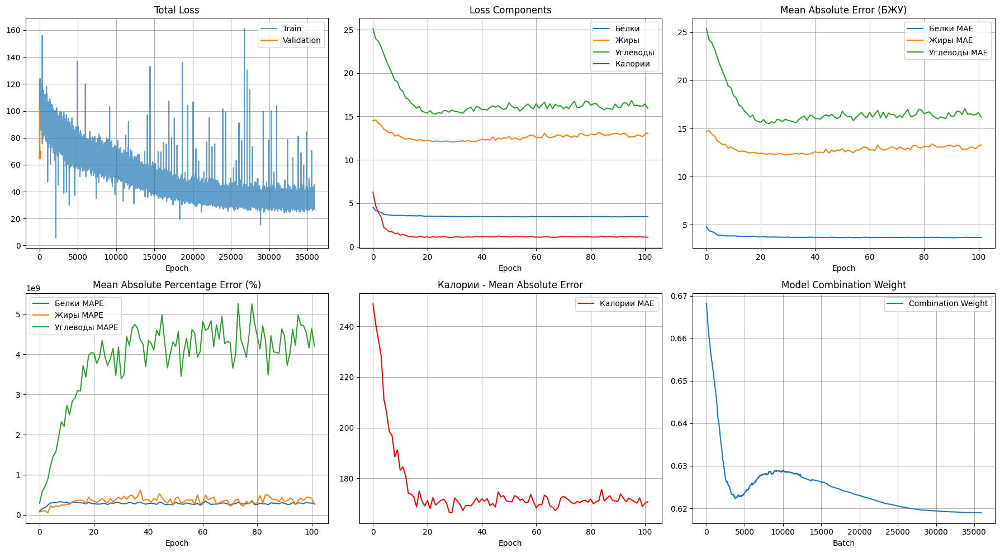

In [53]:
predictor = EnhancedFoodNutritionPredictor(
    model_config={
        'backbone': 'resnet50',
         'pretrained': True,
        'use_attention': False,

    }
)

predictor.fit(train_dataloader, val_dataloader, epochs=200)

predictor.plot_losses(save_path='training_progress.png')

In [ ]:
import torch
import torch.nn as nn
import torchvision
import pickle
import io
import struct
import tarfile
import zipfile

# 1. Определение архитектуры модели
class ResNet50Visual(nn.Module):
    def __init__(self, embDim=1024):
        super(ResNet50Visual, self).__init__()
        resnet = torchvision.models.resnet50(pretrained=False)
        # modules = list(resnet.children())[:-1]
        # self.visionMLP = nn.Sequential(*modules)
        # self.visual_embedding = nn.Sequential(
        #     nn.Linear(2048, embDim),
        #     nn.Tanh()
        # )
    
    def forward(self, x):
        visual_emb = self.visionMLP(x)
        visual_emb = visual_emb.view(visual_emb.size(0), -1)
        visual_emb = self.visual_embedding(visual_emb)
        return visual_emb

# 2. Функция для загрузки весов
def load_resnet_weights(checkpoint_path):
    model = ResNet50Visual(embDim=1024)


In [67]:
model_path = 'model_e500_v-8.950.pth'
checkpoint = torch.load(model_path, map_location='cpu', encoding='latin1')
model = torchvision.models.resnet50(pretrained=False)
if isinstance(checkpoint, dict):
    # Извлекаем только веса для ResNet
    resnet_weights = {}
    state_dict = checkpoint.get('state_dict', checkpoint)
    
    for key in state_dict:
        if 'visionMLP' in key or 'visual_embedding' in key:
            new_key = key.replace('visionMLP.', '').replace('visual_embedding.', '')
            resnet_weights[new_key] = state_dict[key]
    
    # Загружаем веса в модель
    model.load_state_dict(resnet_weights, strict=False)
    model.eval()

In [68]:
isinstance(checkpoint, dict)

True

In [57]:
model = ResNet50Visual(embDim=1024)

c:\Users\User\anaconda3\envs\MTS\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\User\anaconda3\envs\MTS\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


In [58]:
if isinstance(checkpoint, dict):
    # Извлекаем только веса для ResNet
    resnet_weights = {}
    state_dict = checkpoint.get('state_dict', checkpoint)
    
    for key in state_dict:
        if 'visionMLP' in key or 'visual_embedding' in key:
            new_key = key.replace('visionMLP.', '').replace('visual_embedding.', '')
            resnet_weights[new_key] = state_dict[key]
    
    # Загружаем веса в модель
    model.load_state_dict(resnet_weights, strict=False)
    model.eval()


In [69]:
model

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [70]:
state_dict = checkpoint.get('state_dict', checkpoint)

In [72]:
resnet_weights = {}
state_dict = checkpoint.get('state_dict', checkpoint)

for key in state_dict:
    if 'visionMLP' in key or 'visual_embedding' in key:
        new_key = key.replace('visionMLP.', '').replace('visual_embedding.', '')
        resnet_weights[new_key] = state_dict[key]

    # Загружаем веса в модель


In [73]:
resnet_weights

{'module.0.weight': tensor([[[[ 1.5962e-02,  1.6280e-02, -2.6085e-02,  ..., -5.7124e-02,
            -6.6971e-02, -1.0433e-01],
           [-1.7631e-02,  1.4254e-03,  2.5633e-02,  ...,  2.2150e-02,
            -2.8269e-02, -4.8951e-02],
           [-4.8710e-04, -2.5638e-03,  2.6306e-02,  ...,  1.7459e-01,
             8.6392e-02,  6.4811e-02],
           ...,
           [ 1.1276e-02,  3.1962e-02, -3.4836e-02,  ..., -2.2766e-01,
            -1.5658e-01, -1.7495e-02],
           [ 4.3307e-02,  9.8229e-02,  1.1343e-01,  ...,  3.1021e-02,
            -8.4410e-02, -7.6142e-02],
           [-5.6300e-02,  1.0080e-02,  7.1556e-03,  ...,  8.8325e-02,
             5.2640e-02, -1.1248e-02]],
 
          [[ 3.8445e-03,  3.6530e-02,  5.5315e-02,  ...,  8.9362e-02,
             5.5289e-02, -3.5770e-02],
           [-2.0994e-02,  1.9458e-02,  1.0983e-01,  ...,  2.5220e-01,
             2.0548e-01,  1.6693e-01],
           [-6.8808e-02, -1.2998e-01, -9.5902e-02,  ...,  2.3666e-01,
             2.4040e

In [76]:

import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models
import math

class AdvancedNutritionHead(nn.Module):
    def __init__(self, in_features, out_features, dropout=0.3, use_residual=True):
        super().__init__()
        hidden_dim = max(in_features // 2, 128)  # Минимум 128 нейронов
        
        self.use_residual = use_residual and (in_features == out_features)
        
        # Основные слои
        self.fc1 = nn.Linear(in_features, hidden_dim)
        self.bn1 = nn.BatchNorm1d(hidden_dim)
        self.dropout1 = nn.Dropout(dropout)
        
        self.fc2 = nn.Linear(hidden_dim, hidden_dim // 2)
        self.bn2 = nn.BatchNorm1d(hidden_dim // 2)
        self.dropout2 = nn.Dropout(dropout * 0.5)
        
        self.fc3 = nn.Linear(hidden_dim // 2, out_features)
        
        # Residual connection (если размерности совпадают)
        if self.use_residual:
            self.residual = nn.Linear(in_features, out_features)
            
        self._init_weights()
    
    def _init_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Linear):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)
    
    def forward(self, x):
        identity = x
        
        x = self.fc1(x)
        x = F.silu(self.bn1(x))
        x = self.dropout1(x)
        
        x = self.fc2(x)
        x = F.silu(self.bn2(x))
        x = self.dropout2(x)
        
        x = self.fc3(x)
        
        # Residual connection
        if self.use_residual:
            x = x + self.residual(identity)
        
        return F.relu(x)

class AttentionPooling(nn.Module):
    def __init__(self, in_features):
        super().__init__()
        self.attention = nn.Sequential(
            nn.Linear(in_features, in_features // 4),
            nn.ReLU(),
            nn.Linear(in_features // 4, 1),
            nn.Sigmoid()
        )
        
    def forward(self, x):
        weights = self.attention(x)
        return x * weights

class EnhancedFoodNutritionNet(nn.Module):
    def __init__(self, backbone='resnet50_RecepieM1p', pretrained=True, 
                 use_attention=True, dropout=0.2):
        """
        Args:
            backbone: тип backbone (efficientnet_b1, efficientnet_b2, resnet50)
            pretrained: использовать предобученные веса
            use_attention: использовать attention pooling
            feature_fusion: использовать fusion разных уровней признаков
        """
        super().__init__()
        
        # Backbone
        self.backbone_name = backbone
        if backbone == 'efficientnet_b1':
            self.backbone = models.efficientnet_b1(weights='IMAGENET1K_V1' if pretrained else None)
            in_features = self.backbone.classifier[1].in_features
        elif backbone == 'efficientnet_b2':
            self.backbone = models.efficientnet_b2(weights='IMAGENET1K_V1' if pretrained else None)
            in_features = self.backbone.classifier[1].in_features
        elif backbone == 'resnet50':
            self.backbone = models.resnet50(weights='IMAGENET1K_V1' if pretrained else None)
            in_features = self.backbone.fc.in_features
            self.backbone.fc = nn.Identity()
        elif backbone == 'resnet50_RecepieM1p':
            model_path = 'model_e500_v-8.950.pth'
            checkpoint = torch.load(model_path, map_location='cpu', encoding='latin1')
            self.backbone = torchvision.models.resnet50(pretrained=False)
            if isinstance(checkpoint, dict):
                # Извлекаем только веса для ResNet
                resnet_weights = {}
                state_dict = checkpoint.get('state_dict', checkpoint)
                
                for key in state_dict:
                    if 'visionMLP' in key or 'visual_embedding' in key:
                        new_key = key.replace('visionMLP.', '').replace('visual_embedding.', '')
                        resnet_weights[new_key] = state_dict[key]
                
                # Загружаем веса в модель
                self.backbone.load_state_dict(resnet_weights, strict=False)
            in_features = self.backbone.fc.in_features
            self.backbone.fc = nn.Identity()
        else:
            raise ValueError(f"Неподдерживаемый backbone: {backbone}")
            
        if 'efficientnet' in backbone:
            self.backbone.classifier = nn.Identity()
        

 
        fusion_features = in_features
        
        self.use_attention = use_attention
        if use_attention:
            self.attention_pool = AttentionPooling(fusion_features)
        
        self.shared_fc = nn.Sequential(
            nn.Linear(fusion_features, 1024),
            nn.BatchNorm1d(1024),
            nn.SiLU(),
            nn.Dropout(dropout),
            
            nn.Linear(1024, 512),
            nn.BatchNorm1d(512),
            nn.SiLU(),
            nn.Dropout(dropout * 0.5),
            
            # Дополнительный слой для лучшего разделения признаков
            nn.Linear(512, 256),
            nn.BatchNorm1d(256),
            nn.SiLU(),
        )
        
        # Специализированные головы
        self.bzu_head = AdvancedNutritionHead(256, 3)
        
        # # Отдельные головы для каждого компонента (эксперимент)
        self.protein_head = AdvancedNutritionHead(256, 1)
        self.fat_head = AdvancedNutritionHead(256, 1)
        self.carb_head = AdvancedNutritionHead(256, 1)

        self.combination_weight = nn.Parameter(torch.tensor(0.7))
        
        self._init_weights()
    
    def _register_hooks(self):
        def hook_fn(name):
            def hook(module, input, output):
                self.feature_hooks[name] = output
            return hook
        
        if hasattr(self.backbone, 'features'):
            self.backbone.features[-2].register_forward_hook(hook_fn('mid_features'))
    
    def _init_weights(self):
        """Улучшенная инициализация весов"""
        for name, module in self.named_modules():
            if isinstance(module, nn.Linear):
                if 'head' in name:
                    # Более консервативная инициализация для голов
                    nn.init.xavier_normal_(module.weight, gain=0.5)
                else:
                    nn.init.kaiming_normal_(module.weight, mode='fan_out', nonlinearity='relu')
                if module.bias is not None:
                    nn.init.constant_(module.bias, 0)
            elif isinstance(module, nn.BatchNorm1d):
                nn.init.constant_(module.weight, 1)
                nn.init.constant_(module.bias, 0)
    
    def forward(self, x):

        features = self.backbone(x)
        
        # Attention pooling
        if self.use_attention:
            features = self.attention_pool(features)
        
        # Обработка признаков
        shared = self.shared_fc(features)
        
        # Предсказания о

        bzu_general = self.bzu_head(shared)
        
        # Предсказания от отдельных голов
        protein_specific = self.protein_head(shared)
        fat_specific = self.fat_head(shared)
        carb_specific = self.carb_head(shared)
        
    
        w = torch.sigmoid(self.combination_weight)
        bzu_specific = torch.cat([protein_specific, fat_specific, carb_specific], dim=1)
        bzu = w * bzu_general + (1 - w) * bzu_specific
        
        # bzu = bzu_specific
        # Обеспечиваем положительность
        bzu = F.relu(bzu) + 1e-6
        
        # Пропорции БЖУ
        bzu_sum = bzu.sum(dim=1, keepdim=True) + 1e-8
        bzu_proportions = bzu / bzu_sum
        
        # Калории по формуле 4-4-9
        calculated_cal = 4 * bzu[:, 0] + 9 * bzu[:, 1] + 4 * bzu[:, 2]
        
        
        return {
            'bzu': bzu,
            'bzu_general': bzu_general,
            'bzu_specific': bzu_specific,

            # 'bzu_specific': bzu_specific,
            'calculated_cal': calculated_cal,
            'bzu_proportions': bzu_proportions,
            'combination_weight': w,
        }

In [77]:

import matplotlib.pyplot as plt
from tqdm import tqdm
import numpy as np
import torch
import torch.nn as nn
import os
from datetime import datetime

class EnhancedFoodNutritionPredictor:
    def __init__(self, model_config=None, device='cuda'):
        self.device = torch.device(device if torch.cuda.is_available() else 'cpu')
        
        # Конфигурация модели по умолчанию
        default_config = {
            'backbone': 'resnet50_RecepieM1p',
            'pretrained': True,
            'use_attention': False,
        }
        
        if model_config:
            default_config.update(model_config)
        
        # Создаем модель
        self.model = EnhancedFoodNutritionNet(**default_config).to(self.device)
        
        # Адаптивная функция потерь с акцентом на углеводы
        self.criterion = CompositeFoodLoss({
            'b': 1.0,
            'zh': 1.2,
            'u': 2.0,
            'cal': 0.5,
            'kl': 0.1
        })
        
        # Оптимизатор с разными learning rate для backbone и голов
        self.optimizer = self._setup_optimizer()
        
        # Планировщик learning rate
        self.scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
            self.optimizer, 
            mode='min', 
            patience=5, 
            factor=0.7,
            min_lr=1e-7,
            verbose=True
        )
        
        # Сохранение лучшей модели
        self.best_val_loss = float('inf')
        self.model_saver = ModelSaver(save_dir='models/enhanced_rm1p')
        
        # Расширенная история метрик
        self.train_history = {
            'total': [], 'b': [], 'zh': [], 'u': [], 'kl': [], 'phys': [],
            'bzu_general': [], 'bzu_specific': [], 'combination_weight': []
        }
        self.val_history = {
            'total': [], 'b': [], 'zh': [], 'u': [], 'kl': [], 'phys': [],
            'mae_b': [], 'mae_zh': [], 'mae_u': [], 'mae_cal': [],
            'mape_b': [], 'mape_zh': [], 'mape_u': [], 'mape_cal': []
        }
        
    def _setup_optimizer(self):

        optimizer = torch.optim.AdamW([
            {'params':  self.model.parameters(), 'lr': 1e-4, 'weight_decay': 1e-5}
        ])
        
        return optimizer
    
    def train_step(self, batch):
        """Один шаг обучения"""
        self.model.train()
        images = batch['images'].to(self.device)
        targets = {k: v.to(self.device) for k, v in batch['targets'].items()}
        
        self.optimizer.zero_grad()
        outputs = self.model(images)

        loss_dict = self.criterion(outputs, targets)
        loss_dict['total'].backward()
        loss_dict['bzu_general'] = outputs['bzu_general'].mean()
        loss_dict['bzu_specific'] = outputs['bzu_specific'].mean()
        loss_dict['w'] = outputs['combination_weight'].mean()

        torch.nn.utils.clip_grad_norm_(self.model.parameters(), max_norm=25.0)
        
        self.optimizer.step()
        

        self._update_train_history(loss_dict, outputs)
        
        return loss_dict
    
    def _update_train_history(self, loss_dict, outputs):
        """Обновление истории обучения"""
        for k in ['total', 'b', 'zh', 'u', 'kl', 'phys']:
            if k in loss_dict:
                self.train_history[k].append(loss_dict[k].item())
        

        if 'combination_weight' in outputs:
            self.train_history['combination_weight'].append(
                outputs['combination_weight'].mean().item()
            )
        
        # Можно добавить расхождение между общими и специфичными предсказаниями
        if 'bzu_general' in outputs and 'bzu_specific' in outputs:
            diff = torch.mean(torch.abs(outputs['bzu_general'] - outputs['bzu_specific']))
            self.train_history['bzu_general'].append(diff.item())
    
    def validate(self, dataloader):
        """Валидация с расширенными метриками"""
        self.model.eval()
        
        # Инициализация метрик
        loss_metrics = {k: 0.0 for k in ['total', 'b', 'zh', 'u', 'kl', 'phys']}
        error_metrics = {
            'mae_b': 0.0, 'mae_zh': 0.0, 'mae_u': 0.0, 'mae_cal': 0.0,
            'mape_b': 0.0, 'mape_zh': 0.0, 'mape_u': 0.0, 'mape_cal': 0.0
        }
        
        all_predictions = {'bzu': [], 'calories': []}
        all_targets = {'bzu': [], 'calories': []}
        
        with torch.no_grad():
            for batch in tqdm(dataloader, desc="Validation"):
                images = batch['images'].to(self.device)
                targets = {k: v.to(self.device) for k, v in batch['targets'].items()}
                
                outputs = self.model(images)
                loss_dict = self.criterion(outputs, targets)
                
                # Накапливаем лоссы
                for k in loss_metrics.keys():
                    if k in loss_dict:
                        loss_metrics[k] += loss_dict[k].item()
                
                # Сохраняем предсказания для расчета метрик
                all_predictions['bzu'].append(outputs['bzu'].cpu())
                all_predictions['calories'].append(outputs['calculated_cal'].cpu())
                all_targets['bzu'].append(targets['bzu'].cpu())
                all_targets['calories'].append(targets['calories'].cpu())
        
        # Объединяем все предсказания
        pred_bzu = torch.cat(all_predictions['bzu'], dim=0)
        pred_cal = torch.cat(all_predictions['calories'], dim=0)
        true_bzu = torch.cat(all_targets['bzu'], dim=0)
        true_cal = torch.cat(all_targets['calories'], dim=0)
        
        # Вычисляем дополнительные метрики
        n = len(dataloader)
        

        for k in loss_metrics.keys():
            loss_metrics[k] /= n
        
        # MAE и MAPE для каждого компонента
        error_metrics['mae_b'] = torch.mean(torch.abs(pred_bzu[:, 0] - true_bzu[:, 0])).item()
        error_metrics['mae_zh'] = torch.mean(torch.abs(pred_bzu[:, 1] - true_bzu[:, 1])).item()
        error_metrics['mae_u'] = torch.mean(torch.abs(pred_bzu[:, 2] - true_bzu[:, 2])).item()
        error_metrics['mae_cal'] = torch.mean(torch.abs(pred_cal - true_cal)).item()
        
        # MAPE (Mean Absolute Percentage Error)
        error_metrics['mape_b'] = torch.mean(torch.abs((pred_bzu[:, 0] - true_bzu[:, 0]) / (true_bzu[:, 0] + 1e-8)) * 100).item()
        error_metrics['mape_zh'] = torch.mean(torch.abs((pred_bzu[:, 1] - true_bzu[:, 1]) / (true_bzu[:, 1] + 1e-8)) * 100).item()
        error_metrics['mape_u'] = torch.mean(torch.abs((pred_bzu[:, 2] - true_bzu[:, 2]) / (true_bzu[:, 2] + 1e-8)) * 100).item()
        error_metrics['mape_cal'] = torch.mean(torch.abs((pred_cal - true_cal) / (true_cal + 1e-8)) * 100).item()
        
        # Объединяем все метрики
        all_metrics = {
            **loss_metrics,
            **error_metrics
        }
        
        # Обновляем историю валидации
        for k, v in all_metrics.items():
            self.val_history[k].append(v)
        
        # Обновляем scheduler
        self.scheduler.step(loss_metrics['total'])
        
        # Адаптируем веса лосса
        if hasattr(self.criterion, 'update_weights'):
            self.criterion.update_weights()
        
        return all_metrics
    
    def train_epoch(self, train_loader, epoch):
        """Обучение одной эпохи с детальным логированием"""


        epoch_losses = []
        
        pbar = tqdm(train_loader, desc=f"Epoch {epoch}")
        for batch_idx, batch in enumerate(pbar):
            loss_dict = self.train_step(batch)
            epoch_losses.append(loss_dict['total'].item())
            pbar.set_postfix({
                'Loss': f"{loss_dict['total'].item():.4f}",
                'Б': f"{loss_dict['b'].item():.4f}",
                'Ж': f"{loss_dict['zh'].item():.4f}",
                'У': f"{loss_dict['u'].item():.4f}",
                'KL':f"{loss_dict['kl'].item():.4f}",
                'cal':f"{loss_dict['phys'].item():.4f}",
                'combination_weight': f"{loss_dict['w'].item():.4f}",
                'bzu_general': f"{loss_dict['bzu_general'].item():.4f}",
                'bzu_specific': f"{loss_dict['bzu_specific'].item():.4f}",
                
            })    
        
        return np.mean(epoch_losses)
    
    def fit(self, train_loader, val_loader, epochs, save_every=5):
        """Полный цикл обучения"""
        print(f"Начинаем обучение на {epochs} эпох")
        print(f"Устройство: {self.device}")
        
        for epoch in range(epochs):
            print(f"\n=== Эпоха {epoch+1}/{epochs} ===")
            
            # Обучение
            train_loss = self.train_epoch(train_loader, epoch)
            
            # Валидация
            val_metrics = self.validate(val_loader)
            
            # Логирование
            print(f"Train Loss: {train_loss:.4f}")
            print(f"Val Loss: {val_metrics['total']:.4f}")
            print(f"MAE - Б: {val_metrics['mae_b']:.2f}, Ж: {val_metrics['mae_zh']:.2f}, У: {val_metrics['mae_u']:.2f}, Кал: {val_metrics['mae_cal']:.1f}")
            print(f"MAPE - Б: {val_metrics['mape_b']:.1f}%, Ж: {val_metrics['mape_zh']:.1f}%, У: {val_metrics['mape_u']:.1f}%, Кал: {val_metrics['mape_cal']:.1f}%")
            
            # Сохранение лучшей модели
            if val_metrics['total'] < self.best_val_loss:
                self.best_val_loss = val_metrics['total']
                self.save_checkpoint(epoch, val_metrics, is_best=True)
                print(f"💾 Сохранена лучшая модель! Val Loss: {val_metrics['total']:.4f}")
            
            # Периодическое сохранение
            if (epoch + 1) % save_every == 0:
                self.save_checkpoint(epoch, val_metrics, is_best=False)
            
            # Early stopping (опционально)
            current_lr = self.optimizer.param_groups[0]['lr']
            if current_lr < 1e-6:
                print("Learning rate слишком мал, останавливаем обучение")
                break
    
    def save_checkpoint(self, epoch, metrics, is_best=False):
        """Сохранение чекпоинта"""
        checkpoint = {
            'model_state_dict': self.model.state_dict(),
            'optimizer_state_dict': self.optimizer.state_dict(),
            'scheduler_state_dict': self.scheduler.state_dict(),
            'epoch': epoch,
            'metrics': metrics,
            'train_history': self.train_history,
            'val_history': self.val_history,
            'model_config': {
                'backbone': self.model.backbone_name if hasattr(self.model, 'backbone_name') else 'unknown'
            }
        }
        
        os.makedirs('models/enhanced_rm1p', exist_ok=True)
        
        if is_best:
            torch.save(checkpoint, 'models/enhanced_rm1p/best_model.pth')
        else:
            torch.save(checkpoint, f'models/enhanced_rm1p/checkpoint_epoch_{epoch}.pth')
    
    def load_checkpoint(self, path):
        """Загрузка чекпоинта"""
        checkpoint = torch.load(path, map_location=self.device)
        
        self.model.load_state_dict(checkpoint['model_state_dict'])
        self.optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        
        if 'scheduler_state_dict' in checkpoint:
            self.scheduler.load_state_dict(checkpoint['scheduler_state_dict'])
        
        if 'train_history' in checkpoint:
            self.train_history = checkpoint['train_history']
        if 'val_history' in checkpoint:
            self.val_history = checkpoint['val_history']
        
        print(f"Загружен чекпоинт с эпохи {checkpoint['epoch']}")
        return checkpoint['epoch'], checkpoint.get('metrics', {})
    
    def plot_losses(self, save_path=None):
        """Расширенная визуализация метрик"""
        fig, axes = plt.subplots(2, 3, figsize=(18, 10))
        
        # 1. Общий лосс
        axes[0, 0].plot(self.train_history['total'], label='Train', alpha=0.7)
        axes[0, 0].plot(self.val_history['total'], label='Validation', linewidth=2)
        axes[0, 0].set_title('Total Loss')
        axes[0, 0].set_xlabel('Epoch')
        axes[0, 0].legend()
        axes[0, 0].grid(True)
        
        # 2. Компоненты лосса
        axes[0, 1].plot(self.val_history['b'], label='Белки')
        axes[0, 1].plot(self.val_history['zh'], label='Жиры')
        axes[0, 1].plot(self.val_history['u'], label='Углеводы')
        axes[0, 1].plot(self.val_history['phys'], label='Калории')
        axes[0, 1].set_title('Loss Components')
        axes[0, 1].set_xlabel('Epoch')
        axes[0, 1].legend()
        axes[0, 1].grid(True)
        
        # 3. MAE для каждого компонента
        axes[0, 2].plot(self.val_history['mae_b'], label='Белки MAE')
        axes[0, 2].plot(self.val_history['mae_zh'], label='Жиры MAE')
        axes[0, 2].plot(self.val_history['mae_u'], label='Углеводы MAE')
        axes[0, 2].set_title('Mean Absolute Error (БЖУ)')
        axes[0, 2].set_xlabel('Epoch')
        axes[0, 2].legend()
        axes[0, 2].grid(True)
        
        # 4. MAPE для каждого компонента
        axes[1, 0].plot(self.val_history['mape_b'], label='Белки MAPE')
        axes[1, 0].plot(self.val_history['mape_zh'], label='Жиры MAPE')
        axes[1, 0].plot(self.val_history['mape_u'], label='Углеводы MAPE')
        axes[1, 0].set_title('Mean Absolute Percentage Error (%)')
        axes[1, 0].set_xlabel('Epoch')
        axes[1, 0].legend()
        axes[1, 0].grid(True)
        
        # 5. MAE калорий
        axes[1, 1].plot(self.val_history['mae_cal'], label='Калории MAE', color='red')
        axes[1, 1].set_title('Калории - Mean Absolute Error')
        axes[1, 1].set_xlabel('Epoch')
        axes[1, 1].legend()
        axes[1, 1].grid(True)
        
        # 6. Combination weight (если есть)
        if 'combination_weight' in self.train_history and self.train_history['combination_weight']:
            axes[1, 2].plot(self.train_history['combination_weight'], label='Combination Weight')
            axes[1, 2].set_title('Model Combination Weight')
            axes[1, 2].set_xlabel('Batch')
            axes[1, 2].legend()
            axes[1, 2].grid(True)
        else:
            axes[1, 2].text(0.5, 0.5, 'No combination\nweight data', 
                           ha='center', va='center', transform=axes[1, 2].transAxes)
            axes[1, 2].set_title('Combination Weight')
        
        plt.tight_layout()
        
        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
            print(f"График сохранен: {save_path}")
        
        plt.show()
    
    def predict(self, image_or_batch):
        """Предсказание для одного изображения или батча"""
        self.model.eval()
        
        with torch.no_grad():
            if isinstance(image_or_batch, torch.Tensor):
                if image_or_batch.dim() == 3:
                    image_or_batch = image_or_batch.unsqueeze(0)
                
                images = image_or_batch.to(self.device)
                outputs = self.model(images)
                
                return {
                    'bzu': outputs['bzu'].cpu().numpy(),
                    'calories': outputs['calories'].cpu().numpy(),
                    'bzu_proportions': outputs.get('bzu_proportions', torch.zeros_like(outputs['bzu'])).cpu().numpy()
                }


class ModelSaver:
    def __init__(self, save_dir='models', patience=5):

        self.save_dir = save_dir
        self.best_loss = float('inf')
        self.patience = patience
        self.wait = 0
        os.makedirs(save_dir, exist_ok=True)
        
    def save_if_best(self, model, optimizer, epoch, val_loss, metrics=None):
        if val_loss < self.best_loss:
            self.best_loss = val_loss
            self.wait = 0
            return True
        else:
            self.wait += 1
        return False
  

Начинаем обучение на 200 эпох
Устройство: cuda

=== Эпоха 1/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.04it/s]


Train Loss: 76.2138
Val Loss: 74.6174
MAE - Б: 4.68, Ж: 14.64, У: 25.26, Кал: 246.2
MAPE - Б: 113248496.0%, Ж: 95327648.0%, У: 347931328.0%, Кал: 83802760.0%
💾 Сохранена лучшая модель! Val Loss: 74.6174

=== Эпоха 2/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 72.3706
Val Loss: 71.6226
MAE - Б: 4.57, Ж: 14.29, У: 24.45, Кал: 235.2
MAPE - Б: 153187664.0%, Ж: 151422080.0%, У: 565173504.0%, Кал: 129030480.0%
💾 Сохранена лучшая модель! Val Loss: 71.6226

=== Эпоха 3/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.05it/s]


Train Loss: 69.7896
Val Loss: 70.2437
MAE - Б: 4.29, Ж: 14.20, У: 24.10, Кал: 230.2
MAPE - Б: 211322528.0%, Ж: 168250784.0%, У: 642685440.0%, Кал: 150521488.0%
💾 Сохранена лучшая модель! Val Loss: 70.2437

=== Эпоха 4/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.06it/s]


Train Loss: 67.7757
Val Loss: 66.5825
MAE - Б: 4.18, Ж: 13.81, У: 22.82, Кал: 215.4
MAPE - Б: 250793072.0%, Ж: 243600176.0%, У: 1014042304.0%, Кал: 218521056.0%
💾 Сохранена лучшая модель! Val Loss: 66.5825

=== Эпоха 5/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.08it/s]


Train Loss: 65.8028
Val Loss: 63.9929
MAE - Б: 4.00, Ж: 13.54, У: 21.92, Кал: 201.9
MAPE - Б: 341779744.0%, Ж: 323751008.0%, У: 1310457216.0%, Кал: 288954688.0%
💾 Сохранена лучшая модель! Val Loss: 63.9929

=== Эпоха 6/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.08it/s]


Train Loss: 64.1583
Val Loss: 63.6861
MAE - Б: 4.07, Ж: 13.56, У: 21.72, Кал: 202.7
MAPE - Б: 267677920.0%, Ж: 328523360.0%, У: 1413163648.0%, Кал: 284897024.0%
💾 Сохранена лучшая модель! Val Loss: 63.6861

=== Эпоха 7/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 62.8146
Val Loss: 62.1183
MAE - Б: 4.00, Ж: 13.45, У: 21.10, Кал: 195.0
MAPE - Б: 316371872.0%, Ж: 366604992.0%, У: 1686970496.0%, Кал: 329241600.0%
💾 Сохранена лучшая модель! Val Loss: 62.1183

=== Эпоха 8/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 61.4721
Val Loss: 61.1413
MAE - Б: 4.00, Ж: 13.37, У: 20.68, Кал: 190.8
MAPE - Б: 323218336.0%, Ж: 434369632.0%, У: 1863924736.0%, Кал: 356045344.0%
💾 Сохранена лучшая модель! Val Loss: 61.1413

=== Эпоха 9/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.05it/s]


Train Loss: 60.2433
Val Loss: 59.8350
MAE - Б: 3.98, Ж: 13.32, У: 20.12, Кал: 184.4
MAPE - Б: 327825440.0%, Ж: 457364928.0%, У: 2123806336.0%, Кал: 399157920.0%
💾 Сохранена лучшая модель! Val Loss: 59.8350

=== Эпоха 10/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 59.5387
Val Loss: 59.2566
MAE - Б: 4.00, Ж: 13.30, У: 19.84, Кал: 182.0
MAPE - Б: 327946688.0%, Ж: 482927680.0%, У: 2312217856.0%, Кал: 416567712.0%
💾 Сохранена лучшая модель! Val Loss: 59.2566

=== Эпоха 11/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 58.7902
Val Loss: 58.4337
MAE - Б: 3.99, Ж: 13.31, У: 19.45, Кал: 177.8
MAPE - Б: 316093664.0%, Ж: 499964352.0%, У: 2511383040.0%, Кал: 448263264.0%
💾 Сохранена лучшая модель! Val Loss: 58.4337

=== Эпоха 12/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 58.2843
Val Loss: 57.8501
MAE - Б: 4.00, Ж: 13.28, У: 19.17, Кал: 177.1
MAPE - Б: 311850944.0%, Ж: 496695904.0%, У: 2669276672.0%, Кал: 453655584.0%
💾 Сохранена лучшая модель! Val Loss: 57.8501

=== Эпоха 13/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 57.6256
Val Loss: 56.9349
MAE - Б: 4.00, Ж: 13.29, У: 18.72, Кал: 174.0
MAPE - Б: 315576096.0%, Ж: 515887968.0%, У: 2816675328.0%, Кал: 481499200.0%
💾 Сохранена лучшая модель! Val Loss: 56.9349

=== Эпоха 14/200 ===


Validation: 100%|██████████| 27/27 [00:26<00:00,  1.03it/s]


Train Loss: 57.1003
Val Loss: 56.3008
MAE - Б: 3.98, Ж: 13.31, У: 18.42, Кал: 169.4
MAPE - Б: 328463456.0%, Ж: 557344256.0%, У: 3230895104.0%, Кал: 526056096.0%
💾 Сохранена лучшая модель! Val Loss: 56.3008

=== Эпоха 15/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.08it/s]


Train Loss: 56.7471
Val Loss: 56.1675
MAE - Б: 3.98, Ж: 13.30, У: 18.35, Кал: 171.1
MAPE - Б: 318298592.0%, Ж: 554699072.0%, У: 3373064704.0%, Кал: 517429792.0%
💾 Сохранена лучшая модель! Val Loss: 56.1675

=== Эпоха 16/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.08it/s]


Train Loss: 56.3837
Val Loss: 55.4405
MAE - Б: 3.96, Ж: 13.27, У: 18.03, Кал: 166.3
MAPE - Б: 324256288.0%, Ж: 544442624.0%, У: 3663753984.0%, Кал: 562609728.0%
💾 Сохранена лучшая модель! Val Loss: 55.4405

=== Эпоха 17/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.06it/s]


Train Loss: 56.4384
Val Loss: 55.2226
MAE - Б: 3.99, Ж: 13.32, У: 17.87, Кал: 166.9
MAPE - Б: 312579104.0%, Ж: 554140800.0%, У: 3667449600.0%, Кал: 554151744.0%
💾 Сохранена лучшая модель! Val Loss: 55.2226

=== Эпоха 18/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.08it/s]


Train Loss: 55.8901
Val Loss: 54.8928
MAE - Б: 3.97, Ж: 13.24, У: 17.77, Кал: 164.6
MAPE - Б: 319765568.0%, Ж: 524121504.0%, У: 3966157568.0%, Кал: 578782336.0%
💾 Сохранена лучшая модель! Val Loss: 54.8928

=== Эпоха 19/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.08it/s]


Train Loss: 55.5617
Val Loss: 54.3107
MAE - Б: 3.93, Ж: 13.17, У: 17.55, Кал: 161.5
MAPE - Б: 335812640.0%, Ж: 553155584.0%, У: 4359977984.0%, Кал: 628511936.0%
💾 Сохранена лучшая модель! Val Loss: 54.3107

=== Эпоха 20/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 55.3921
Val Loss: 54.0298
MAE - Б: 3.93, Ж: 13.18, У: 17.41, Кал: 161.5
MAPE - Б: 335162528.0%, Ж: 592183872.0%, У: 4287192320.0%, Кал: 624799872.0%
💾 Сохранена лучшая модель! Val Loss: 54.0298

=== Эпоха 21/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 55.4865
Val Loss: 54.2389
MAE - Б: 3.93, Ж: 13.13, У: 17.54, Кал: 161.7
MAPE - Б: 307685376.0%, Ж: 506845888.0%, У: 4396106240.0%, Кал: 625878656.0%

=== Эпоха 22/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.08it/s]


Train Loss: 55.1463
Val Loss: 53.7963
MAE - Б: 3.92, Ж: 13.15, У: 17.31, Кал: 162.2
MAPE - Б: 321740928.0%, Ж: 486432576.0%, У: 4524205056.0%, Кал: 628292224.0%
💾 Сохранена лучшая модель! Val Loss: 53.7963

=== Эпоха 23/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 55.2257
Val Loss: 54.0517
MAE - Б: 3.94, Ж: 13.17, У: 17.41, Кал: 165.0
MAPE - Б: 288918912.0%, Ж: 454706368.0%, У: 4444939264.0%, Кал: 597902528.0%

=== Эпоха 24/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.06it/s]


Train Loss: 54.9476
Val Loss: 54.2009
MAE - Б: 3.95, Ж: 13.10, У: 17.50, Кал: 167.5
MAPE - Б: 296850784.0%, Ж: 482213632.0%, У: 4034096384.0%, Кал: 569273536.0%

=== Эпоха 25/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 54.9347
Val Loss: 53.3750
MAE - Б: 3.90, Ж: 13.06, У: 17.16, Кал: 162.1
MAPE - Б: 308483296.0%, Ж: 478359008.0%, У: 4630787584.0%, Кал: 643918464.0%
💾 Сохранена лучшая модель! Val Loss: 53.3750

=== Эпоха 26/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 54.8264
Val Loss: 53.7486
MAE - Б: 3.90, Ж: 13.05, У: 17.36, Кал: 159.5
MAPE - Б: 330553376.0%, Ж: 506032544.0%, У: 5126299648.0%, Кал: 678593344.0%

=== Эпоха 27/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 54.6202
Val Loss: 53.7547
MAE - Б: 3.92, Ж: 13.15, У: 17.29, Кал: 159.9
MAPE - Б: 321988736.0%, Ж: 527982528.0%, У: 4930918912.0%, Кал: 661212544.0%

=== Эпоха 28/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 54.7692
Val Loss: 53.2999
MAE - Б: 3.92, Ж: 13.06, У: 17.11, Кал: 162.4
MAPE - Б: 314709664.0%, Ж: 490955808.0%, У: 4508418560.0%, Кал: 637723840.0%
💾 Сохранена лучшая модель! Val Loss: 53.2999

=== Эпоха 29/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 54.7823
Val Loss: 53.3041
MAE - Б: 3.90, Ж: 13.02, У: 17.16, Кал: 161.2
MAPE - Б: 311151392.0%, Ж: 442114240.0%, У: 5123015680.0%, Кал: 656017024.0%

=== Эпоха 30/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.08it/s]


Train Loss: 54.6683
Val Loss: 53.6713
MAE - Б: 3.90, Ж: 13.11, У: 17.27, Кал: 162.6
MAPE - Б: 303943552.0%, Ж: 467006112.0%, У: 4578018304.0%, Кал: 645506944.0%

=== Эпоха 31/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.08it/s]


Train Loss: 54.7161
Val Loss: 53.2381
MAE - Б: 3.89, Ж: 13.09, У: 17.07, Кал: 162.9
MAPE - Б: 316759616.0%, Ж: 445085952.0%, У: 4642895872.0%, Кал: 663527424.0%
💾 Сохранена лучшая модель! Val Loss: 53.2381

=== Эпоха 32/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.08it/s]


Train Loss: 54.5680
Val Loss: 53.3224
MAE - Б: 3.93, Ж: 13.06, У: 17.11, Кал: 165.3
MAPE - Б: 270821984.0%, Ж: 426542784.0%, У: 4636584960.0%, Кал: 605870400.0%

=== Эпоха 33/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 54.5151
Val Loss: 52.8820
MAE - Б: 3.90, Ж: 13.04, У: 16.93, Кал: 163.0
MAPE - Б: 314432480.0%, Ж: 496068416.0%, У: 4304006656.0%, Кал: 629805184.0%
💾 Сохранена лучшая модель! Val Loss: 52.8820

=== Эпоха 34/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 54.5478
Val Loss: 52.9669
MAE - Б: 3.89, Ж: 12.98, У: 17.00, Кал: 163.8
MAPE - Б: 302921088.0%, Ж: 467634848.0%, У: 4762874880.0%, Кал: 634953152.0%

=== Эпоха 35/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 54.4567
Val Loss: 53.2632
MAE - Б: 3.88, Ж: 12.94, У: 17.18, Кал: 162.7
MAPE - Б: 283475072.0%, Ж: 379799232.0%, У: 4950940160.0%, Кал: 639475008.0%

=== Эпоха 36/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.06it/s]


Train Loss: 54.4797
Val Loss: 53.2098
MAE - Б: 3.90, Ж: 13.04, У: 17.09, Кал: 162.8
MAPE - Б: 315806272.0%, Ж: 516189920.0%, У: 4561722368.0%, Кал: 629748160.0%

=== Эпоха 37/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.06it/s]


Train Loss: 54.5236
Val Loss: 53.2160
MAE - Б: 3.85, Ж: 13.06, У: 17.10, Кал: 159.9
MAPE - Б: 343425728.0%, Ж: 549460032.0%, У: 4963305472.0%, Кал: 722032640.0%

=== Эпоха 38/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 54.4216
Val Loss: 53.4249
MAE - Б: 3.90, Ж: 13.06, У: 17.16, Кал: 166.4
MAPE - Б: 255328464.0%, Ж: 353446976.0%, У: 4534521856.0%, Кал: 613946240.0%

=== Эпоха 39/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 54.2215
Val Loss: 52.8569
MAE - Б: 3.86, Ж: 13.03, У: 16.94, Кал: 162.7
MAPE - Б: 319964320.0%, Ж: 524410944.0%, У: 5006115840.0%, Кал: 674179968.0%
💾 Сохранена лучшая модель! Val Loss: 52.8569

=== Эпоха 40/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 54.2773
Val Loss: 53.1761
MAE - Б: 3.90, Ж: 13.02, У: 17.07, Кал: 163.0
MAPE - Б: 293655456.0%, Ж: 441195904.0%, У: 4842342912.0%, Кал: 637924736.0%

=== Эпоха 41/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 54.1443
Val Loss: 52.9231
MAE - Б: 3.88, Ж: 12.96, У: 17.00, Кал: 162.9
MAPE - Б: 322700576.0%, Ж: 503699552.0%, У: 4717991936.0%, Кал: 670599424.0%

=== Эпоха 42/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 54.1491
Val Loss: 52.9944
MAE - Б: 3.89, Ж: 12.97, У: 17.01, Кал: 165.1
MAPE - Б: 294150272.0%, Ж: 410068768.0%, У: 4627711488.0%, Кал: 646960000.0%

=== Эпоха 43/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 54.2265
Val Loss: 52.9428
MAE - Б: 3.86, Ж: 12.92, У: 17.03, Кал: 162.8
MAPE - Б: 304322272.0%, Ж: 448549824.0%, У: 4834492928.0%, Кал: 671206784.0%

=== Эпоха 44/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.08it/s]


Train Loss: 54.0248
Val Loss: 53.4442
MAE - Б: 3.91, Ж: 13.04, У: 17.16, Кал: 167.4
MAPE - Б: 288283040.0%, Ж: 402233440.0%, У: 4552524288.0%, Кал: 603642368.0%

=== Эпоха 45/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.08it/s]


Epoch 00045: reducing learning rate of group 0 to 7.0000e-05.
Train Loss: 54.0947
Val Loss: 53.0134
MAE - Б: 3.89, Ж: 13.01, У: 17.01, Кал: 163.7
MAPE - Б: 319728736.0%, Ж: 411644928.0%, У: 4645805056.0%, Кал: 642060416.0%

=== Эпоха 46/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.08it/s]


Train Loss: 54.0986
Val Loss: 52.8156
MAE - Б: 3.85, Ж: 12.92, У: 16.98, Кал: 165.2
MAPE - Б: 293848128.0%, Ж: 424784672.0%, У: 4568757760.0%, Кал: 640939712.0%
💾 Сохранена лучшая модель! Val Loss: 52.8156

=== Эпоха 47/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 53.9748
Val Loss: 52.6015
MAE - Б: 3.85, Ж: 12.89, У: 16.89, Кал: 163.6
MAPE - Б: 283283904.0%, Ж: 400002944.0%, У: 5147244032.0%, Кал: 664372672.0%
💾 Сохранена лучшая модель! Val Loss: 52.6015

=== Эпоха 48/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.08it/s]


Train Loss: 53.7654
Val Loss: 52.6386
MAE - Б: 3.85, Ж: 12.93, У: 16.89, Кал: 163.7
MAPE - Б: 301931264.0%, Ж: 452285632.0%, У: 4730248192.0%, Кал: 667233280.0%

=== Эпоха 49/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 53.8083
Val Loss: 52.5836
MAE - Б: 3.88, Ж: 12.86, У: 16.87, Кал: 164.0
MAPE - Б: 283495616.0%, Ж: 398927552.0%, У: 4993206784.0%, Кал: 655258432.0%
💾 Сохранена лучшая модель! Val Loss: 52.5836

=== Эпоха 50/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.08it/s]


Train Loss: 53.8253
Val Loss: 52.8162
MAE - Б: 3.84, Ж: 12.98, У: 16.95, Кал: 162.6
MAPE - Б: 309935296.0%, Ж: 479662336.0%, У: 5344793600.0%, Кал: 709536256.0%

=== Эпоха 51/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.08it/s]


Train Loss: 53.5856
Val Loss: 52.6102
MAE - Б: 3.86, Ж: 12.88, У: 16.89, Кал: 164.2
MAPE - Б: 290980000.0%, Ж: 411818432.0%, У: 4591031296.0%, Кал: 633049792.0%

=== Эпоха 52/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 53.7832
Val Loss: 52.5974
MAE - Б: 3.85, Ж: 12.87, У: 16.89, Кал: 166.5
MAPE - Б: 262102512.0%, Ж: 337155936.0%, У: 4664315904.0%, Кал: 628365824.0%

=== Эпоха 53/200 ===


Validation: 100%|██████████| 27/27 [00:26<00:00,  1.04it/s]


Train Loss: 53.6322
Val Loss: 52.5705
MAE - Б: 3.82, Ж: 12.84, У: 16.91, Кал: 161.5
MAPE - Б: 318971520.0%, Ж: 433704896.0%, У: 5367485440.0%, Кал: 714500096.0%
💾 Сохранена лучшая модель! Val Loss: 52.5705

=== Эпоха 54/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.09it/s]


Train Loss: 53.5356
Val Loss: 52.5049
MAE - Б: 3.84, Ж: 12.86, У: 16.87, Кал: 163.3
MAPE - Б: 296884832.0%, Ж: 429879808.0%, У: 4822022144.0%, Кал: 641280576.0%
💾 Сохранена лучшая модель! Val Loss: 52.5049

=== Эпоха 55/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.06it/s]


Train Loss: 53.5236
Val Loss: 52.7806
MAE - Б: 3.83, Ж: 12.97, У: 16.95, Кал: 161.8
MAPE - Б: 320623840.0%, Ж: 467364064.0%, У: 5115297792.0%, Кал: 694064960.0%

=== Эпоха 56/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 53.5433
Val Loss: 52.1236
MAE - Б: 3.83, Ж: 12.87, У: 16.68, Кал: 163.5
MAPE - Б: 311749280.0%, Ж: 438920416.0%, У: 5018728960.0%, Кал: 668699328.0%
💾 Сохранена лучшая модель! Val Loss: 52.1236

=== Эпоха 57/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.06it/s]


Train Loss: 53.4345
Val Loss: 52.1814
MAE - Б: 3.84, Ж: 12.92, У: 16.66, Кал: 165.1
MAPE - Б: 292581888.0%, Ж: 415942816.0%, У: 5038240256.0%, Кал: 679759040.0%

=== Эпоха 58/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.06it/s]


Train Loss: 53.3262
Val Loss: 52.9929
MAE - Б: 3.85, Ж: 12.87, У: 17.09, Кал: 161.3
MAPE - Б: 306842656.0%, Ж: 419922016.0%, У: 5188486144.0%, Кал: 689849280.0%

=== Эпоха 59/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 53.5279
Val Loss: 52.7415
MAE - Б: 3.87, Ж: 12.87, У: 16.95, Кал: 165.5
MAPE - Б: 288631552.0%, Ж: 363341728.0%, У: 4682417152.0%, Кал: 621560000.0%

=== Эпоха 60/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 53.3959
Val Loss: 52.2739
MAE - Б: 3.80, Ж: 12.85, У: 16.77, Кал: 163.6
MAPE - Б: 344283328.0%, Ж: 514456320.0%, У: 4819334144.0%, Кал: 692326976.0%

=== Эпоха 61/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.06it/s]


Train Loss: 53.4113
Val Loss: 51.9288
MAE - Б: 3.83, Ж: 12.83, У: 16.59, Кал: 164.8
MAPE - Б: 288806496.0%, Ж: 408569248.0%, У: 4621622272.0%, Кал: 681651520.0%
💾 Сохранена лучшая модель! Val Loss: 51.9288

=== Эпоха 62/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.05it/s]


Train Loss: 53.3194
Val Loss: 52.4143
MAE - Б: 3.86, Ж: 12.86, У: 16.82, Кал: 162.4
MAPE - Б: 337058016.0%, Ж: 463772864.0%, У: 4383905792.0%, Кал: 671929536.0%

=== Эпоха 63/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.08it/s]


Train Loss: 53.3901
Val Loss: 52.2317
MAE - Б: 3.85, Ж: 12.89, У: 16.70, Кал: 162.9
MAPE - Б: 290950400.0%, Ж: 374830944.0%, У: 4673275904.0%, Кал: 657888832.0%

=== Эпоха 64/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.08it/s]


Train Loss: 53.2442
Val Loss: 52.6986
MAE - Б: 3.86, Ж: 12.85, У: 16.96, Кал: 163.5
MAPE - Б: 301678496.0%, Ж: 423816384.0%, У: 4975514112.0%, Кал: 679243776.0%

=== Эпоха 65/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 53.2522
Val Loss: 52.9183
MAE - Б: 3.85, Ж: 12.87, У: 17.06, Кал: 165.3
MAPE - Б: 295046592.0%, Ж: 381836992.0%, У: 5126521344.0%, Кал: 652563136.0%

=== Эпоха 66/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.06it/s]


Train Loss: 53.1649
Val Loss: 52.3085
MAE - Б: 3.81, Ж: 12.81, У: 16.82, Кал: 161.9
MAPE - Б: 311654144.0%, Ж: 438641472.0%, У: 4932921856.0%, Кал: 685289728.0%

=== Эпоха 67/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Epoch 00067: reducing learning rate of group 0 to 4.9000e-05.
Train Loss: 53.2571
Val Loss: 52.4269
MAE - Б: 3.82, Ж: 12.84, У: 16.84, Кал: 164.2
MAPE - Б: 274008000.0%, Ж: 352155840.0%, У: 5160250368.0%, Кал: 711181056.0%

=== Эпоха 68/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 53.0910
Val Loss: 52.1472
MAE - Б: 3.82, Ж: 12.87, У: 16.70, Кал: 163.1
MAPE - Б: 285350240.0%, Ж: 344859424.0%, У: 4946604032.0%, Кал: 654101248.0%

=== Эпоха 69/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 52.9605
Val Loss: 52.0105
MAE - Б: 3.85, Ж: 12.75, У: 16.68, Кал: 165.3
MAPE - Б: 291178848.0%, Ж: 414745600.0%, У: 4784180224.0%, Кал: 654862400.0%

=== Эпоха 70/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.06it/s]


Train Loss: 52.8888
Val Loss: 52.4193
MAE - Б: 3.86, Ж: 12.80, У: 16.84, Кал: 164.3
MAPE - Б: 297229664.0%, Ж: 409227072.0%, У: 4555841536.0%, Кал: 641303744.0%

=== Эпоха 71/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.08it/s]


Train Loss: 52.9004
Val Loss: 52.0863
MAE - Б: 3.80, Ж: 12.79, У: 16.71, Кал: 165.1
MAPE - Б: 274848544.0%, Ж: 346428672.0%, У: 5117801472.0%, Кал: 691980480.0%

=== Эпоха 72/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.05it/s]


Train Loss: 52.8046
Val Loss: 52.4051
MAE - Б: 3.82, Ж: 12.85, У: 16.85, Кал: 161.2
MAPE - Б: 288932256.0%, Ж: 403335808.0%, У: 5122142208.0%, Кал: 702212352.0%

=== Эпоха 73/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.06it/s]


Epoch 00073: reducing learning rate of group 0 to 3.4300e-05.
Train Loss: 52.6397
Val Loss: 52.1537
MAE - Б: 3.85, Ж: 12.86, У: 16.68, Кал: 164.7
MAPE - Б: 283044032.0%, Ж: 372905536.0%, У: 4891685376.0%, Кал: 660370048.0%

=== Эпоха 74/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.06it/s]


Train Loss: 52.6508
Val Loss: 52.3526
MAE - Б: 3.81, Ж: 12.83, У: 16.81, Кал: 165.4
MAPE - Б: 300736672.0%, Ж: 392313056.0%, У: 4519491584.0%, Кал: 652760064.0%

=== Эпоха 75/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.06it/s]


Train Loss: 52.7145
Val Loss: 52.1604
MAE - Б: 3.84, Ж: 12.77, У: 16.73, Кал: 165.8
MAPE - Б: 295304384.0%, Ж: 470098496.0%, У: 4532684288.0%, Кал: 662619584.0%

=== Эпоха 76/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 52.4720
Val Loss: 51.9458
MAE - Б: 3.82, Ж: 12.80, У: 16.62, Кал: 165.5
MAPE - Б: 293792832.0%, Ж: 388951456.0%, У: 4655219200.0%, Кал: 674434176.0%

=== Эпоха 77/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 52.4687
Val Loss: 51.8754
MAE - Б: 3.77, Ж: 12.76, У: 16.64, Кал: 165.6
MAPE - Б: 319300480.0%, Ж: 420985600.0%, У: 4613993984.0%, Кал: 695157952.0%
💾 Сохранена лучшая модель! Val Loss: 51.8754

=== Эпоха 78/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.08it/s]


Train Loss: 52.4693
Val Loss: 51.7911
MAE - Б: 3.79, Ж: 12.73, У: 16.59, Кал: 165.9
MAPE - Б: 291267296.0%, Ж: 416733600.0%, У: 4493849088.0%, Кал: 673158016.0%
💾 Сохранена лучшая модель! Val Loss: 51.7911

=== Эпоха 79/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 52.4912
Val Loss: 52.1573
MAE - Б: 3.82, Ж: 12.73, У: 16.77, Кал: 165.9
MAPE - Б: 291393280.0%, Ж: 387454560.0%, У: 4632597504.0%, Кал: 666866176.0%

=== Эпоха 80/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.08it/s]


Train Loss: 52.3316
Val Loss: 52.5831
MAE - Б: 3.83, Ж: 12.81, У: 16.92, Кал: 165.4
MAPE - Б: 300499712.0%, Ж: 457420960.0%, У: 4803001856.0%, Кал: 678491392.0%

=== Эпоха 81/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.04it/s]


Train Loss: 52.4554
Val Loss: 52.4406
MAE - Б: 3.78, Ж: 12.80, У: 16.88, Кал: 163.5
MAPE - Б: 326024352.0%, Ж: 464348576.0%, У: 4824852992.0%, Кал: 732522368.0%

=== Эпоха 82/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 52.1968
Val Loss: 51.7745
MAE - Б: 3.80, Ж: 12.71, У: 16.60, Кал: 164.8
MAPE - Б: 292877888.0%, Ж: 434946464.0%, У: 4488492032.0%, Кал: 657611008.0%
💾 Сохранена лучшая модель! Val Loss: 51.7745

=== Эпоха 83/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 52.4422
Val Loss: 51.9182
MAE - Б: 3.84, Ж: 12.84, У: 16.58, Кал: 164.1
MAPE - Б: 283711424.0%, Ж: 351789568.0%, У: 4904347136.0%, Кал: 672030528.0%

=== Эпоха 84/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.08it/s]


Train Loss: 52.2411
Val Loss: 52.0186
MAE - Б: 3.83, Ж: 12.79, У: 16.66, Кал: 165.0
MAPE - Б: 294218976.0%, Ж: 452451776.0%, У: 4706013696.0%, Кал: 668489472.0%

=== Эпоха 85/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 52.1569
Val Loss: 52.2048
MAE - Б: 3.83, Ж: 12.85, У: 16.72, Кал: 163.6
MAPE - Б: 300322944.0%, Ж: 384225120.0%, У: 4899166720.0%, Кал: 693505856.0%

=== Эпоха 86/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.06it/s]


Train Loss: 52.1534
Val Loss: 52.0405
MAE - Б: 3.82, Ж: 12.80, У: 16.67, Кал: 164.1
MAPE - Б: 322866112.0%, Ж: 442594400.0%, У: 4672559104.0%, Кал: 705128448.0%

=== Эпоха 87/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 52.0873
Val Loss: 52.1796
MAE - Б: 3.81, Ж: 12.74, У: 16.79, Кал: 166.0
MAPE - Б: 292046080.0%, Ж: 374836864.0%, У: 4538286080.0%, Кал: 645548352.0%

=== Эпоха 88/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.04it/s]


Epoch 00088: reducing learning rate of group 0 to 2.4010e-05.
Train Loss: 52.0954
Val Loss: 52.5595
MAE - Б: 3.80, Ж: 12.84, У: 16.91, Кал: 165.1
MAPE - Б: 286815584.0%, Ж: 388977952.0%, У: 4743485440.0%, Кал: 717420608.0%

=== Эпоха 89/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.05it/s]


Train Loss: 51.9493
Val Loss: 52.5258
MAE - Б: 3.81, Ж: 12.77, У: 16.94, Кал: 163.8
MAPE - Б: 282758784.0%, Ж: 404662208.0%, У: 4603574272.0%, Кал: 679387776.0%

=== Эпоха 90/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 51.8824
Val Loss: 52.4539
MAE - Б: 3.80, Ж: 12.86, У: 16.86, Кал: 164.4
MAPE - Б: 312604448.0%, Ж: 519505760.0%, У: 4891275264.0%, Кал: 717588480.0%

=== Эпоха 91/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.08it/s]


Train Loss: 51.7836
Val Loss: 52.0791
MAE - Б: 3.80, Ж: 12.74, У: 16.72, Кал: 166.3
MAPE - Б: 316678592.0%, Ж: 464109120.0%, У: 5055845888.0%, Кал: 684978240.0%

=== Эпоха 92/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 51.8103
Val Loss: 51.9267
MAE - Б: 3.80, Ж: 12.75, У: 16.64, Кал: 164.7
MAPE - Б: 299989568.0%, Ж: 412194912.0%, У: 4639548416.0%, Кал: 690204928.0%

=== Эпоха 93/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.08it/s]


Train Loss: 51.7682
Val Loss: 52.0978
MAE - Б: 3.81, Ж: 12.77, У: 16.73, Кал: 165.7
MAPE - Б: 306275968.0%, Ж: 435754080.0%, У: 4804013568.0%, Кал: 682896192.0%

=== Эпоха 94/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.05it/s]


Epoch 00094: reducing learning rate of group 0 to 1.6807e-05.
Train Loss: 51.7212
Val Loss: 52.4310
MAE - Б: 3.81, Ж: 12.86, У: 16.84, Кал: 163.9
MAPE - Б: 342149376.0%, Ж: 511533504.0%, У: 4925559808.0%, Кал: 705923264.0%

=== Эпоха 95/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.06it/s]


Train Loss: 51.5499
Val Loss: 51.9480
MAE - Б: 3.83, Ж: 12.73, У: 16.66, Кал: 164.1
MAPE - Б: 284219232.0%, Ж: 360587296.0%, У: 4584518656.0%, Кал: 660932928.0%

=== Эпоха 96/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.08it/s]


Train Loss: 51.5184
Val Loss: 52.1143
MAE - Б: 3.79, Ж: 12.76, У: 16.74, Кал: 166.1
MAPE - Б: 325452096.0%, Ж: 469998368.0%, У: 4653931520.0%, Кал: 697351552.0%

=== Эпоха 97/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 51.3852
Val Loss: 52.0730
MAE - Б: 3.82, Ж: 12.80, У: 16.70, Кал: 165.1
MAPE - Б: 300957024.0%, Ж: 416480864.0%, У: 4390451200.0%, Кал: 644204544.0%

=== Эпоха 98/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.06it/s]


Train Loss: 51.3737
Val Loss: 52.2025
MAE - Б: 3.82, Ж: 12.73, У: 16.80, Кал: 164.9
MAPE - Б: 306371328.0%, Ж: 401356768.0%, У: 4638553600.0%, Кал: 686613824.0%

=== Эпоха 99/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 51.6982
Val Loss: 52.0235
MAE - Б: 3.79, Ж: 12.72, У: 16.72, Кал: 165.7
MAPE - Б: 303536544.0%, Ж: 476206816.0%, У: 4555407360.0%, Кал: 694274816.0%

=== Эпоха 100/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.06it/s]


Epoch 00100: reducing learning rate of group 0 to 1.1765e-05.
Train Loss: 51.4502
Val Loss: 51.8878
MAE - Б: 3.80, Ж: 12.80, У: 16.59, Кал: 164.0
MAPE - Б: 293086432.0%, Ж: 405815392.0%, У: 4522568704.0%, Кал: 668500992.0%

=== Эпоха 101/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.06it/s]


Train Loss: 51.3047
Val Loss: 52.0285
MAE - Б: 3.80, Ж: 12.76, У: 16.69, Кал: 164.2
MAPE - Б: 318160192.0%, Ж: 444565696.0%, У: 4385983488.0%, Кал: 700907648.0%

=== Эпоха 102/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.05it/s]


Train Loss: 51.0821
Val Loss: 51.8375
MAE - Б: 3.78, Ж: 12.77, У: 16.59, Кал: 166.5
MAPE - Б: 309085920.0%, Ж: 454822400.0%, У: 4568307712.0%, Кал: 683850432.0%

=== Эпоха 103/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.06it/s]


Train Loss: 51.2401
Val Loss: 52.0930
MAE - Б: 3.76, Ж: 12.77, У: 16.74, Кал: 164.9
MAPE - Б: 324131264.0%, Ж: 467620896.0%, У: 4776996864.0%, Кал: 719873728.0%

=== Эпоха 104/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 51.1834
Val Loss: 52.4437
MAE - Б: 3.82, Ж: 12.77, У: 16.89, Кал: 165.2
MAPE - Б: 310859008.0%, Ж: 497886528.0%, У: 4637175808.0%, Кал: 679045312.0%

=== Эпоха 105/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.06it/s]


Train Loss: 51.0288
Val Loss: 52.2366
MAE - Б: 3.78, Ж: 12.80, У: 16.78, Кал: 165.5
MAPE - Б: 323714208.0%, Ж: 505578240.0%, У: 4363801088.0%, Кал: 715696000.0%

=== Эпоха 106/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.06it/s]


Train Loss: 51.0339
Val Loss: 51.7663
MAE - Б: 3.81, Ж: 12.76, У: 16.55, Кал: 165.7
MAPE - Б: 285286912.0%, Ж: 517293984.0%, У: 4584427008.0%, Кал: 681772352.0%
💾 Сохранена лучшая модель! Val Loss: 51.7663

=== Эпоха 107/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.07it/s]


Train Loss: 51.0504
Val Loss: 52.0912
MAE - Б: 3.78, Ж: 12.67, У: 16.78, Кал: 163.7
MAPE - Б: 297145504.0%, Ж: 412109888.0%, У: 4497684480.0%, Кал: 695462912.0%

=== Эпоха 108/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.06it/s]


Train Loss: 50.7527
Val Loss: 52.3379
MAE - Б: 3.82, Ж: 12.76, У: 16.84, Кал: 165.1
MAPE - Б: 299207168.0%, Ж: 465326720.0%, У: 4572430848.0%, Кал: 673963136.0%

=== Эпоха 109/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.06it/s]


Train Loss: 51.0006
Val Loss: 51.9587
MAE - Б: 3.79, Ж: 12.84, У: 16.61, Кал: 162.2
MAPE - Б: 317482528.0%, Ж: 424680448.0%, У: 4953673728.0%, Кал: 694602752.0%

=== Эпоха 110/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.06it/s]


Train Loss: 50.7603
Val Loss: 52.6582
MAE - Б: 3.81, Ж: 12.76, У: 17.01, Кал: 164.8
MAPE - Б: 271460896.0%, Ж: 357781440.0%, У: 4608239616.0%, Кал: 688890560.0%

=== Эпоха 111/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.05it/s]


Train Loss: 51.0146
Val Loss: 51.8337
MAE - Б: 3.79, Ж: 12.71, У: 16.63, Кал: 163.6
MAPE - Б: 290168576.0%, Ж: 426329504.0%, У: 4970571264.0%, Кал: 707827776.0%

=== Эпоха 112/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.06it/s]


Epoch 00112: reducing learning rate of group 0 to 8.2354e-06.
Train Loss: 50.7812
Val Loss: 52.0902
MAE - Б: 3.78, Ж: 12.74, У: 16.77, Кал: 164.7
MAPE - Б: 296213856.0%, Ж: 454408768.0%, У: 4458776576.0%, Кал: 674083584.0%

=== Эпоха 113/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Train Loss: 50.6789
Val Loss: 51.7219
MAE - Б: 3.79, Ж: 12.70, У: 16.58, Кал: 166.4
MAPE - Б: 310239648.0%, Ж: 462377312.0%, У: 4727688192.0%, Кал: 701576640.0%
💾 Сохранена лучшая модель! Val Loss: 51.7219

=== Эпоха 114/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Train Loss: 50.8018
Val Loss: 52.1334
MAE - Б: 3.81, Ж: 12.74, У: 16.75, Кал: 166.5
MAPE - Б: 281855232.0%, Ж: 385779648.0%, У: 4422952960.0%, Кал: 669875968.0%

=== Эпоха 115/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Train Loss: 50.7128
Val Loss: 51.4848
MAE - Б: 3.80, Ж: 12.72, У: 16.45, Кал: 166.3
MAPE - Б: 282112320.0%, Ж: 362933248.0%, У: 4430620672.0%, Кал: 670767552.0%
💾 Сохранена лучшая модель! Val Loss: 51.4848

=== Эпоха 116/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Train Loss: 50.6348
Val Loss: 51.8853
MAE - Б: 3.82, Ж: 12.67, У: 16.68, Кал: 164.6
MAPE - Б: 301315872.0%, Ж: 441599424.0%, У: 4445291520.0%, Кал: 670071040.0%

=== Эпоха 117/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Train Loss: 50.6616
Val Loss: 51.9248
MAE - Б: 3.81, Ж: 12.82, У: 16.59, Кал: 168.6
MAPE - Б: 268497280.0%, Ж: 413811008.0%, У: 4119894272.0%, Кал: 646080832.0%

=== Эпоха 118/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.08it/s]


Train Loss: 50.5541
Val Loss: 52.1856
MAE - Б: 3.80, Ж: 12.68, У: 16.83, Кал: 165.1
MAPE - Б: 289416576.0%, Ж: 379394496.0%, У: 4628237312.0%, Кал: 667835264.0%

=== Эпоха 119/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Train Loss: 50.6679
Val Loss: 52.0111
MAE - Б: 3.80, Ж: 12.76, У: 16.69, Кал: 164.6
MAPE - Б: 303840672.0%, Ж: 437726848.0%, У: 4348944384.0%, Кал: 684364416.0%

=== Эпоха 120/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Train Loss: 50.6718
Val Loss: 51.9627
MAE - Б: 3.82, Ж: 12.70, У: 16.70, Кал: 164.4
MAPE - Б: 292153216.0%, Ж: 388858944.0%, У: 4567519232.0%, Кал: 697738688.0%

=== Эпоха 121/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Epoch 00121: reducing learning rate of group 0 to 5.7648e-06.
Train Loss: 50.5787
Val Loss: 52.2272
MAE - Б: 3.79, Ж: 12.71, У: 16.82, Кал: 166.1
MAPE - Б: 295321536.0%, Ж: 367068768.0%, У: 4442255360.0%, Кал: 707908992.0%

=== Эпоха 122/200 ===


Validation: 100%|██████████| 27/27 [00:25<00:00,  1.08it/s]


Train Loss: 50.5701
Val Loss: 52.3880
MAE - Б: 3.80, Ж: 12.78, У: 16.87, Кал: 164.5
MAPE - Б: 299392576.0%, Ж: 472936320.0%, У: 4912384000.0%, Кал: 713647040.0%

=== Эпоха 123/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.11it/s]


Train Loss: 50.5602
Val Loss: 51.9880
MAE - Б: 3.81, Ж: 12.81, У: 16.64, Кал: 164.8
MAPE - Б: 314025472.0%, Ж: 533263616.0%, У: 4600970752.0%, Кал: 710299456.0%

=== Эпоха 124/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Train Loss: 50.4691
Val Loss: 52.2604
MAE - Б: 3.82, Ж: 12.74, У: 16.81, Кал: 165.5
MAPE - Б: 282631744.0%, Ж: 394156256.0%, У: 4840197632.0%, Кал: 682651776.0%

=== Эпоха 125/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.09it/s]


Train Loss: 50.3563
Val Loss: 52.1143
MAE - Б: 3.80, Ж: 12.76, У: 16.74, Кал: 163.9
MAPE - Б: 283061632.0%, Ж: 433728928.0%, У: 4600797696.0%, Кал: 687168768.0%

=== Эпоха 126/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Train Loss: 50.2924
Val Loss: 51.8558
MAE - Б: 3.80, Ж: 12.69, У: 16.65, Кал: 165.6
MAPE - Б: 297622208.0%, Ж: 416087168.0%, У: 4470329856.0%, Кал: 686171392.0%

=== Эпоха 127/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Epoch 00127: reducing learning rate of group 0 to 4.0354e-06.
Train Loss: 50.3399
Val Loss: 52.0281
MAE - Б: 3.76, Ж: 12.73, У: 16.73, Кал: 166.1
MAPE - Б: 299349408.0%, Ж: 408886848.0%, У: 4387966976.0%, Кал: 704255552.0%

=== Эпоха 128/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.09it/s]


Train Loss: 50.2672
Val Loss: 52.1391
MAE - Б: 3.81, Ж: 12.70, У: 16.80, Кал: 163.4
MAPE - Б: 287262848.0%, Ж: 463087744.0%, У: 4824493056.0%, Кал: 711279488.0%

=== Эпоха 129/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.09it/s]


Train Loss: 50.4547
Val Loss: 52.0697
MAE - Б: 3.78, Ж: 12.72, У: 16.74, Кал: 165.1
MAPE - Б: 323637408.0%, Ж: 450998240.0%, У: 4879519232.0%, Кал: 750579136.0%

=== Эпоха 130/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.11it/s]


Train Loss: 50.1878
Val Loss: 52.2877
MAE - Б: 3.80, Ж: 12.76, У: 16.81, Кал: 166.4
MAPE - Б: 299974528.0%, Ж: 413918080.0%, У: 4590002176.0%, Кал: 673456768.0%

=== Эпоха 131/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Train Loss: 50.1204
Val Loss: 52.2720
MAE - Б: 3.80, Ж: 12.71, У: 16.84, Кал: 163.3
MAPE - Б: 279388800.0%, Ж: 426302080.0%, У: 5142806528.0%, Кал: 730609408.0%

=== Эпоха 132/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.11it/s]


Train Loss: 50.4899
Val Loss: 51.7839
MAE - Б: 3.80, Ж: 12.72, У: 16.59, Кал: 167.4
MAPE - Б: 291520480.0%, Ж: 468066016.0%, У: 4613846528.0%, Кал: 662962752.0%

=== Эпоха 133/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.11it/s]


Epoch 00133: reducing learning rate of group 0 to 2.8248e-06.
Train Loss: 50.2683
Val Loss: 52.1458
MAE - Б: 3.81, Ж: 12.72, У: 16.76, Кал: 165.3
MAPE - Б: 316057760.0%, Ж: 466309888.0%, У: 4558742528.0%, Кал: 694379840.0%

=== Эпоха 134/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.11it/s]


Train Loss: 50.2736
Val Loss: 51.8208
MAE - Б: 3.78, Ж: 12.75, У: 16.62, Кал: 164.3
MAPE - Б: 293884352.0%, Ж: 396597504.0%, У: 5014059520.0%, Кал: 718945024.0%

=== Эпоха 135/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Train Loss: 50.0257
Val Loss: 51.6058
MAE - Б: 3.77, Ж: 12.78, У: 16.48, Кал: 163.5
MAPE - Б: 300986752.0%, Ж: 396049888.0%, У: 4371121152.0%, Кал: 685598912.0%

=== Эпоха 136/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.11it/s]


Train Loss: 50.1351
Val Loss: 52.1652
MAE - Б: 3.79, Ж: 12.76, У: 16.78, Кал: 164.5
MAPE - Б: 285224448.0%, Ж: 397383712.0%, У: 4795942912.0%, Кал: 690396416.0%

=== Эпоха 137/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Train Loss: 50.0714
Val Loss: 52.0159
MAE - Б: 3.78, Ж: 12.66, У: 16.74, Кал: 166.1
MAPE - Б: 284228064.0%, Ж: 483613216.0%, У: 4584782848.0%, Кал: 703713344.0%

=== Эпоха 138/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Train Loss: 50.1217
Val Loss: 52.2355
MAE - Б: 3.78, Ж: 12.81, У: 16.77, Кал: 163.0
MAPE - Б: 318300032.0%, Ж: 446796896.0%, У: 4597102080.0%, Кал: 717222144.0%

=== Эпоха 139/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Epoch 00139: reducing learning rate of group 0 to 1.9773e-06.
Train Loss: 49.9329
Val Loss: 52.2462
MAE - Б: 3.79, Ж: 12.72, У: 16.83, Кал: 164.3
MAPE - Б: 322121312.0%, Ж: 460068448.0%, У: 4596377600.0%, Кал: 701229888.0%

=== Эпоха 140/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.08it/s]


Train Loss: 50.0336
Val Loss: 51.9192
MAE - Б: 3.78, Ж: 12.70, У: 16.69, Кал: 165.6
MAPE - Б: 304941472.0%, Ж: 413937824.0%, У: 4749712896.0%, Кал: 683428800.0%

=== Эпоха 141/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Train Loss: 50.0954
Val Loss: 51.9298
MAE - Б: 3.81, Ж: 12.79, У: 16.63, Кал: 165.3
MAPE - Б: 286909920.0%, Ж: 439749824.0%, У: 4760446976.0%, Кал: 711631488.0%

=== Эпоха 142/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.09it/s]


Train Loss: 50.1348
Val Loss: 52.2726
MAE - Б: 3.79, Ж: 12.68, У: 16.86, Кал: 165.9
MAPE - Б: 298720544.0%, Ж: 472792416.0%, У: 4817412096.0%, Кал: 709451264.0%

=== Эпоха 143/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Train Loss: 50.1295
Val Loss: 52.2554
MAE - Б: 3.80, Ж: 12.75, У: 16.81, Кал: 167.2
MAPE - Б: 268573312.0%, Ж: 333259744.0%, У: 4932111360.0%, Кал: 689859456.0%

=== Эпоха 144/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Train Loss: 49.9653
Val Loss: 52.1142
MAE - Б: 3.79, Ж: 12.74, У: 16.75, Кал: 164.6
MAPE - Б: 286232576.0%, Ж: 413507136.0%, У: 4702630400.0%, Кал: 683377856.0%

=== Эпоха 145/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Epoch 00145: reducing learning rate of group 0 to 1.3841e-06.
Train Loss: 50.1738
Val Loss: 52.1567
MAE - Б: 3.81, Ж: 12.77, У: 16.75, Кал: 166.1
MAPE - Б: 286343552.0%, Ж: 466071456.0%, У: 4687188992.0%, Кал: 678485696.0%

=== Эпоха 146/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.11it/s]


Train Loss: 50.0090
Val Loss: 52.2630
MAE - Б: 3.80, Ж: 12.69, У: 16.85, Кал: 167.1
MAPE - Б: 270097376.0%, Ж: 429541024.0%, У: 4283429376.0%, Кал: 666331328.0%

=== Эпоха 147/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.11it/s]


Train Loss: 49.9204
Val Loss: 52.1557
MAE - Б: 3.79, Ж: 12.86, У: 16.71, Кал: 162.1
MAPE - Б: 314828448.0%, Ж: 481129888.0%, У: 4860754944.0%, Кал: 724631424.0%

=== Эпоха 148/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.11it/s]


Train Loss: 50.1361
Val Loss: 52.4323
MAE - Б: 3.80, Ж: 12.65, У: 16.96, Кал: 166.4
MAPE - Б: 284184768.0%, Ж: 442343136.0%, У: 4534864896.0%, Кал: 684316800.0%

=== Эпоха 149/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Train Loss: 49.9506
Val Loss: 52.2982
MAE - Б: 3.82, Ж: 12.76, У: 16.82, Кал: 166.9
MAPE - Б: 283895872.0%, Ж: 390467488.0%, У: 4383539712.0%, Кал: 660671680.0%

=== Эпоха 150/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Train Loss: 49.9234
Val Loss: 52.3428
MAE - Б: 3.80, Ж: 12.81, У: 16.81, Кал: 165.4
MAPE - Б: 306018528.0%, Ж: 438558272.0%, У: 4966323712.0%, Кал: 700740672.0%

=== Эпоха 151/200 ===


Validation: 100%|██████████| 27/27 [00:24<00:00,  1.10it/s]


Epoch 00151: reducing learning rate of group 0 to 9.6889e-07.
Train Loss: 49.8528
Val Loss: 53.0441
MAE - Б: 3.81, Ж: 12.82, У: 17.15, Кал: 165.3
MAPE - Б: 293360064.0%, Ж: 424610464.0%, У: 5204960768.0%, Кал: 721648576.0%
Learning rate слишком мал, останавливаем обучение
График сохранен: resnet50_RecepieM1p_training_progress.png


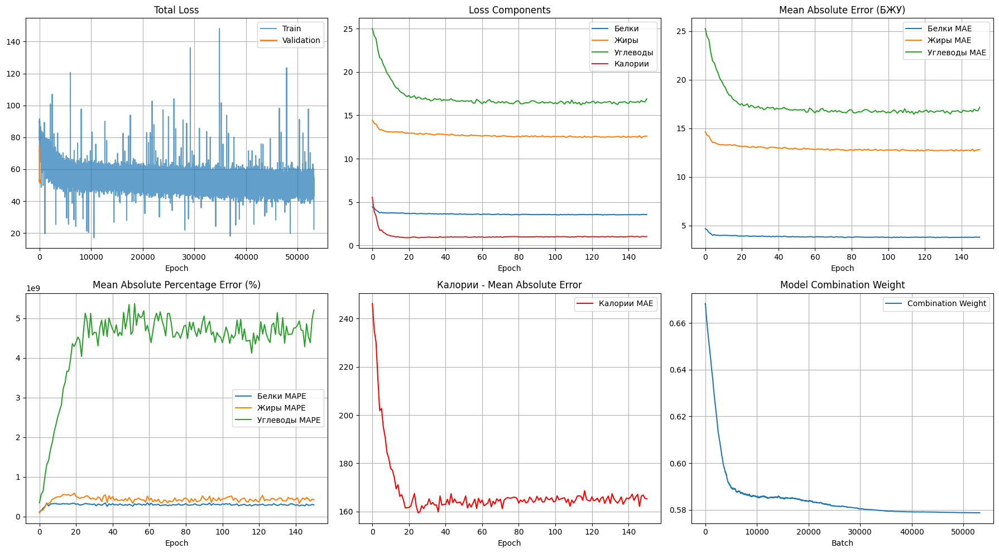

In [78]:
predictor = EnhancedFoodNutritionPredictor(
    model_config={
        'backbone': 'resnet50_RecepieM1p',
         'pretrained': True,
        'use_attention': False,

    }
)

predictor.fit(train_dataloader, val_dataloader, epochs=200)

predictor.plot_losses(save_path='resnet50_RecepieM1p_training_progress.png')

In [80]:
import numpy as np
from tqdm import tqdm

def calculate_calorie_discrepancy(dataset):
    """Вычисляет расхождения между true calories и 4-4-9 расчетом по всему датасету"""
    true_cals = []
    calculated_cals = []
    differences = []
    
    for i in tqdm(range(len(dataset))):
        sample = dataset[i]
        # Истинная калорийность на 100г
        true_cal = sample['targets']['calories'].item()
        
        # Расчет по 4-4-9
        protein, fat, carbs = sample['targets']['bzu']
        calculated_cal = protein*4 + fat*9 + carbs*4
        
        # Сохраняем результаты
        true_cals.append(true_cal)
        calculated_cals.append(calculated_cal)
        differences.append(true_cal - calculated_cal)
    
    # Конвертируем в numpy arrays для вычислений
    true_cals = np.array(true_cals)
    calculated_cals = np.array(calculated_cals)
    differences = np.array(differences)
    
    # Вычисляем метрики
    mae = np.mean(np.abs(differences))
    mse = np.mean(differences**2)
    std = np.std(differences)
    
    # Собираем статистику
    stats = {
        'mean_true_cal': np.mean(true_cals),
        'mean_calculated_cal': np.mean(calculated_cals),
        'mean_difference': np.mean(differences),
        'mae': mae,
        'mse': mse,
        'std_difference': std,
        'max_diff': np.max(np.abs(differences)),
        'min_diff': np.min(differences),
        'num_samples': len(differences)
    }
    
    return stats, differences

# Использование:
# dataset = ValidRecipeDataset(valid_json_path, mode='val')  # Лучше использовать валидационный режим без аугментаций
stats, diffs = calculate_calorie_discrepancy(train_dataset)
print("Статистика расхождений:", stats)

100%|██████████| 33698/33698 [06:37<00:00, 84.78it/s] 


Статистика расхождений: {'mean_true_cal': 271.6064558104461, 'mean_calculated_cal': 271.7838, 'mean_difference': -0.17735857, 'mae': 0.17736505, 'mse': 2.0696564, 'std_difference': 1.4276556, 'max_diff': 18.518494, 'min_diff': -18.518494, 'num_samples': 33698}


In [81]:
stats

{'mean_true_cal': 271.6064558104461,
 'mean_calculated_cal': 271.7838,
 'mean_difference': -0.17735857,
 'mae': 0.17736505,
 'mse': 2.0696564,
 'std_difference': 1.4276556,
 'max_diff': 18.518494,
 'min_diff': -18.518494,
 'num_samples': 33698}

In [57]:
import clip

In [89]:

import json
import re
from collections import Counter, defaultdict

def load_dataset(json_file_path):
    """Загружает датасет из JSON файла"""
    with open(json_file_path, 'r', encoding='utf-8') as f:
        dataset = json.load(f)
    return dataset

def analyze_ingredients(dataset):
    """Анализ всех ингредиентов в датасете"""
    
    # Собираем все ингредиенты
    all_ingredients = []
    ingredient_frequency = Counter()
    
    for sample in dataset:
        for ingredient in sample['ingredients']:
            text = ingredient['text'].lower().strip()
            all_ingredients.append(text)
            ingredient_frequency[text] += 1
    
    print(f"Общее количество упоминаний ингредиентов: {len(all_ingredients)}")
    print(f"Уникальных ингредиентов: {len(ingredient_frequency)}")
    print(f"Топ-20 самых частых ингредиентов:")
    
    for ingredient, count in ingredient_frequency.most_common(20):
        print(f"  {ingredient}: {count}")
    
    return ingredient_frequency

def extract_base_ingredients(ingredient_text):
    """Извлечение базового ингредиента из описания"""
    
    # Паттерны для очистки
    patterns_to_remove = [
        r', raw$', r', fresh$', r', dried$', r', frozen$',
        r', canned.*$', r', bottled.*$', r', organic.*$',
        r', unsalted$', r', salted$', r', without salt$',
        r', ground$', r', whole$', r', chopped$', r', sliced$',
        r', cooked.*$', r', uncooked$', r', prepared.*$',
        r', low fat.*$', r', fat free.*$', r', reduced.*$',
        r', generic$', r', commercial.*$', r', homemade$',
        r', unenriched$', r', enriched.*$', r', fortified.*$',
        r', plain$', r', nonfat$', r', ready-to-eat.*$'
    ]
    
    cleaned = ingredient_text.lower().strip()
    
    # Применяем паттерны очистки
    for pattern in patterns_to_remove:
        cleaned = re.sub(pattern, '', cleaned)
    
    # Дополнительная очистка
    cleaned = re.sub(r'\s+', ' ', cleaned).strip()
    
    return cleaned

def create_ingredient_hierarchy():
    """Создание иерархии ингредиентов"""
    
    hierarchy = {
        'proteins': {
            'meat_beef': ['beef', 'ground beef', 'steak', 'roast beef'],
            'meat_pork': ['pork', 'ham', 'bacon', 'sausage', 'pepperoni'],
            'meat_lamb': ['lamb', 'mutton'],
            'poultry': ['chicken', 'turkey', 'duck', 'goose'],
            'fish': ['salmon', 'tuna', 'cod', 'fish', 'trout', 'halibut'],
            'shellfish': ['shrimp', 'crab', 'lobster', 'scallop', 'mussel', 'clams'],
            'eggs': ['egg', 'eggs'],
            'legumes': ['beans', 'lentils', 'chickpeas', 'peas', 'tofu', 'tempeh', 'soybeans']
        },
        
        'dairy': {
            'milk': ['milk', 'buttermilk', 'skim milk', 'whole milk'],
            'cheese': ['cheese', 'cheddar', 'mozzarella', 'parmesan', 'feta', 'swiss', 'cream cheese'],
            'yogurt': ['yogurt', 'greek yogurt'],
            'butter': ['butter'],
            'cream': ['cream', 'sour cream', 'heavy cream', 'whipping cream']
        },
        
        'grains': {
            'wheat_flour': ['flour', 'wheat flour', 'bread flour', 'all-purpose flour', 'whole wheat flour'],
            'rice': ['rice', 'brown rice', 'white rice', 'wild rice', 'jasmine rice'],
            'oats': ['oats', 'oatmeal', 'rolled oats'],
            'pasta': ['pasta', 'spaghetti', 'noodles', 'macaroni'],
            'bread': ['bread', 'breadcrumbs', 'baguette', 'rolls'],
            'cereals': ['cereals', 'granola', 'cornflakes'],
            'other_grains': ['quinoa', 'barley', 'bulgur', 'cornmeal', 'couscous']
        },
        
        'vegetables': {
            'onion_family': ['onion', 'garlic', 'shallot', 'leek', 'chive'],
            'root_vegetables': ['potato', 'carrot', 'beet', 'turnip', 'radish', 'sweet potato'],
            'leafy_greens': ['spinach', 'lettuce', 'kale', 'cabbage', 'arugula'],
            'cruciferous':['broccoli', 'cauliflower', 'brussels sprouts'],
            'nightshades': ['tomato', 'pepper', 'eggplant', 'bell pepper'],
            'squash': ['zucchini', 'squash', 'pumpkin', 'butternut squash'],
            'mushrooms': ['mushroom', 'shiitake', 'portobello'],
            'herbs_fresh': ['parsley', 'cilantro', 'basil', 'oregano', 'thyme', 'rosemary', 'sage', 'dill'],
            'celery_cucumber': ['celery', 'cucumber'],
            'corn': ['corn', 'sweet corn']
        },
        
        'fruits': {
            'citrus': ['lemon', 'lime', 'orange', 'grapefruit'],
            'berries': ['strawberry', 'strawberries', 'blueberry', 'raspberry', 'blackberry', 'cranberry'],
            'stone_fruits': ['peach', 'plum', 'cherry', 'apricot'],
            'tropical': ['banana', 'pineapple', 'mango', 'coconut', 'papaya'],
            'apples_pears': ['apple', 'pear'],
            'grapes': ['grape', 'raisin'],
            'melons': ['watermelon', 'cantaloupe', 'honeydew']
        },
        
        'fats_oils': {
            'cooking_oils': ['oil', 'olive oil', 'vegetable oil', 'canola oil', 'coconut oil', 'sesame oil'],
            'nuts': ['almonds', 'walnuts', 'pecans', 'cashews', 'pistachios', 'pine nuts'],
            'seeds': ['sesame seeds', 'sunflower seeds', 'pumpkin seeds'],
            'avocado': ['avocado']
        },
        
        'seasonings': {
            'salt': ['salt', 'sea salt', 'kosher salt', 'table salt'],
            'sugar': ['sugar', 'brown sugar', 'granulated sugar', 'powdered sugar', 'confectioners sugar'],
            'sweeteners': ['honey', 'maple syrup', 'molasses', 'corn syrup'],
            'spices_warm': ['cinnamon', 'nutmeg', 'cloves', 'allspice', 'ginger'],
            'spices_savory': ['pepper', 'paprika', 'cumin', 'turmeric', 'chili powder', 'cayenne'],
            'baking': ['baking powder', 'baking soda', 'yeast', 'vanilla', 'vanilla extract'],
            'vinegar': ['vinegar', 'balsamic vinegar', 'apple cider vinegar', 'white vinegar'],
            'sauces': ['soy sauce', 'worcestershire', 'hot sauce', 'tomato sauce', 'ketchup', 'mustard']
        },
        
        'liquids': {
            'water': ['water'],
            'broths': ['broth', 'stock', 'bouillon', 'chicken broth', 'beef broth', 'vegetable broth'],
            'wines_alcohol': ['wine', 'beer', 'sherry', 'rum', 'whiskey'],
            'juices': ['juice', 'lemon juice', 'orange juice', 'apple juice'],
            'coffee_tea': ['coffee', 'tea', 'espresso']
        }
    }
    
    return hierarchy

def classify_ingredients(ingredient_frequency, hierarchy):
    """Классификация ингредиентов по категориям"""
    
    # Создаем обратный индекс: ключевое слово -> категория
    keyword_to_category = {}
    
    for main_cat, subcategories in hierarchy.items():
        for subcat, keywords in subcategories.items():
            for keyword in keywords:
                keyword_to_category[keyword] = {
                    'main_category': main_cat,
                    'subcategory': subcat
                }
    
    # Классифицируем ингредиенты
    classified = defaultdict(lambda: defaultdict(list))
    unclassified = []
    
    for ingredient, count in ingredient_frequency.items():
        base_ingredient = extract_base_ingredients(ingredient)
        
        # Ищем совпадение
        found_category = None
        best_match_length = 0
        
        for keyword, category in keyword_to_category.items():
            # Ищем точное совпадение или вхождение
            if keyword == base_ingredient or keyword == ingredient:
                found_category = category
                break
            elif keyword in base_ingredient or base_ingredient in keyword:
                if len(keyword) > best_match_length:
                    found_category = category
                    best_match_length = len(keyword)
        
        if found_category:
            main_cat = found_category['main_category']
            subcat= found_category['subcategory']
            classified[main_cat][subcat].append((ingredient, count))
        else:
            unclassified.append((ingredient, count))
    
    return classified, unclassified

def create_final_classification(dataset, min_frequency=5):
    """Создание финальной классификации ингредиентов"""
    
    # Анализируем датасет
    ingredient_frequency = analyze_ingredients(dataset)
    hierarchy = create_ingredient_hierarchy()
    classified, unclassified = classify_ingredients(ingredient_frequency, hierarchy)
    
    print(f"\n=== РЕЗУЛЬТАТЫ КЛАССИФИКАЦИИ ===")
    
    # Создаем финальные классы
    final_classes = {}
    class_id = 0
    
    # Основные категории
    total_classified = 0
    for main_cat, subcategories in classified.items():
        print(f"\n{main_cat.upper()}:")
        for subcat, ingredients in subcategories.items():
            total_count = sum(ing[1] for ing in ingredients)
            if total_count >= min_frequency:  # Только если достаточно примеров
                class_name = f"{main_cat}_{subcat}"
                final_classes[class_name] = {
                    'class_id': class_id,
                    'ingredients': [ing[0] for ing in ingredients],
                    'total_count': total_count
                }
                total_classified += total_count
                print(f"  {subcat}: {len(ingredients)} ингредиентов, {total_count} упоминаний")
                # Показываем несколько примеров
                examples = sorted(ingredients, key=lambda x: x[1], reverse=True)[:3]
                for ing, count in examples:
                    print(f"    - {ing} ({count})")
                class_id += 1
    
    # Обрабатываем неклассифицированные частые ингредиенты
    frequent_unclassified = [ing for ing in unclassified if ing[1] >= 20]
    if frequent_unclassified:
        print(f"\nЧАСТЫЕ НЕКЛАССИФИЦИРОВАННЫЕ:")
        final_classes['other_frequent'] = {
            'class_id': class_id,
            'ingredients': [ing[0] for ing in frequent_unclassified],
            'total_count': sum(ing[1] for ing in frequent_unclassified)
        }
        for ing, count in sorted(frequent_unclassified, key=lambda x: x[1], reverse=True)[:10]:
            print(f"  - {ing} ({count})")
        class_id += 1
        total_classified += sum(ing[1] for ing in frequent_unclassified)
    
    # Остальные редкие ингредиенты
    rare_unclassified = [ing for ing in unclassified if ing[1] < 20]
    if rare_unclassified:
        final_classes['other_rare'] = {
            'class_id': class_id,
            'ingredients': [ing[0] for ing in rare_unclassified],
            'total_count': sum(ing[1] for ing in rare_unclassified)
        }
        total_classified += sum(ing[1] for ing in rare_unclassified)
    
    total_ingredients = sum(ingredient_frequency.values())
    coverage = (total_classified / total_ingredients) * 100
    
    print(f"\n=== СТАТИСТИКА ===")
    print(f"Общее количество классов: {len(final_classes)}")
    print(f"Покрытие датасета: {coverage:.1f}% ({total_classified}/{total_ingredients})")
    print(f"Неклассифицированных (редких): {len(rare_unclassified)}")
    
    return final_classes, ingredient_frequency

def create_ingredient_mappings(final_classes):
    """Создание маппингов ингредиент -> класс"""
    
    ingredient_to_class = {}
    class_to_ingredients = {}
    
    for class_name, class_info in final_classes.items():
        class_id = class_info['class_id']
        class_to_ingredients[class_id] = {
            'name': class_name,
            'ingredients': class_info['ingredients'],
            'count': class_info['total_count']
        }
        
        for ingredient in class_info['ingredients']:
            ingredient_to_class[ingredient] = class_id
    
    return ingredient_to_class, class_to_ingredients

# Основная функция для запуска анализа
def main(json_file_path):
    """Главная функция для анализа датасета"""


    print("Загружаем датасет...")
    dataset = load_dataset(json_file_path)
    print(f"Загружено {len(dataset)} рецептов")
    
    print("\nАнализируем ингредиенты...")
    final_classes, ingredient_frequency = create_final_classification(dataset)
    
    print("\nСоздаем маппинги...")
    ingredient_to_class, class_to_ingredients = create_ingredient_mappings(final_classes)
    
    # Сохраняем результаты
    import pickle
    
    with open('ingredient_mappings.pkl', 'wb') as f:
        pickle.dump({
            'ingredient_to_class': ingredient_to_class,
            'class_to_ingredients': class_to_ingredients,
            'final_classes': final_classes
        }, f)
    
    print(f"\nМаппинги сохранены в 'ingredient_mappings.pkl'")
    print(f"Создано {len(final_classes)} классов ингредиентов")
    
    return final_classes, ingredient_to_class, class_to_ingredients


json_file_path = "recipes_with_nutritional_info.json"
final_classes, ingredient_to_class, class_to_ingredients = main(json_file_path)



Загружаем датасет...
Загружено 51235 рецептов

Анализируем ингредиенты...
Общее количество упоминаний ингредиентов: 311435
Уникальных ингредиентов: 357
Топ-20 самых частых ингредиентов:
  salt, table: 22023
  sugars, granulated: 17661
  butter, without salt: 15140
  water, bottled, generic: 13908
  wheat flour, white, all-purpose, unenriched: 13689
  oil, olive, salad or cooking: 8570
  milk, fluid, 1% fat, without added vitamin a and vitamin d: 8479
  spices, pepper, black: 7539
  sugars, brown: 6643
  spices, garlic powder: 5378
  vanilla extract: 5311
  spices, cinnamon, ground: 5025
  honey: 4922
  lemon juice, raw: 4453
  spartan, real semi-sweet chocolate baking chips, upc: 011213162966: 3642
  leavening agents, baking powder, double-acting, sodium aluminum sulfate: 3588
  mustard, prepared, yellow: 3422
  oats: 3322
  onions, raw: 3292
  leavening agents, baking soda: 3285

=== РЕЗУЛЬТАТЫ КЛАССИФИКАЦИИ ===

DAIRY:
  yogurt: 1 ингредиентов, 2028 упоминаний
    - yogurt, greek, pl

In [90]:
final_classes

{'dairy_yogurt': {'class_id': 0,
  'ingredients': ['yogurt, greek, plain, nonfat'],
  'total_count': 2028},
 'dairy_butter': {'class_id': 1,
  'ingredients': ['butter, without salt',
   'peanut butter, smooth style, without salt',
   'squash, winter, butternut, raw',
   'butter, salted',
   'seeds, sesame butter, tahini, from roasted and toasted kernels (most common type)',
   'margarine-like, margarine-butter blend, soybean oil and butter'],
  'total_count': 17699},
 'dairy_cheese': {'class_id': 2,
  'ingredients': ['cheese, pasteurized process, american, without added vitamin d',
   'cheese, parmesan, hard',
   'cheese, cheddar',
   'cheese, feta',
   'cheese, cottage, creamed, large or small curd',
   'cheese, mozzarella, low sodium',
   'cheese, brie',
   'cheese, blue',
   'cheese, gouda',
   'cheese, roquefort',
   'cheese, provolone',
   'cheese, goat, soft type',
   'cheese, fontina',
   'cheese, gruyere',
   'cheese, neufchatel',
   'il villaggio, mascarpone cheese, upc: 03798

In [104]:
!pip uninstall clip

^C


In [1]:

import json
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import clip
import os
import random

class CompositeFoodLossWithCLIP(nn.Module):
    """
    Комбинированная функция потерь для JSON датасета
    """
    def __init__(self, weights={
            'b': 1.0,
            'zh': 1.2,
            'u': 1.5,
            'cal': 1.0,
            'kl': 0.1,
            'clip': 0.5
            }):
        super().__init__()
        self.weights = weights
        
        self.mse = nn.MSELoss()
        self.kl = nn.KLDivLoss(reduction='batchmean')
        self.huber = nn.SmoothL1Loss(beta=0.5)
        self.cross_entropy = nn.CrossEntropyLoss()
        
    def clip_loss(self, logits_per_image, logits_per_text):
        """CLIP contrastive loss"""
        batch_size = logits_per_image.shape[0]
        labels = torch.arange(batch_size, device=logits_per_image.device)
        
        loss_i = self.cross_entropy(logits_per_image, labels)
        loss_t = self.cross_entropy(logits_per_text, labels)
        
        return (loss_i + loss_t) / 2
        
    def forward(self, outputs, targets, use_clip_loss=True):
        # Основные потери для БЖУ
        loss_b = self.huber(outputs['bzu'][:, 0], targets['bzu'][:, 0])
        loss_zh = self.huber(outputs['bzu'][:, 1], targets['bzu'][:, 1])
        loss_u = self.huber(outputs['bzu'][:, 2], targets['bzu'][:, 2])
        
        # KL-дивергенция для пропорций
        true_proportions = targets['bzu_proportions'] 
        loss_kl = self.kl(torch.log(outputs['bzu_proportions'] + 1e-8), true_proportions)
        
        # Физическая согласованность
        loss_phys = self.mse(
            torch.log1p(outputs['calculated_cal']), torch.log1p(targets['calories'])
        )

        # Базовый loss
        total_loss = (
            self.weights['b'] * loss_b +
            self.weights['zh'] * loss_zh +
            self.weights['u'] * loss_u +
            self.weights['cal'] * loss_phys +
            self.weights['kl'] * loss_kl
        )
        
        loss_dict = {
            'total': total_loss,
            'b': loss_b,
            'zh': loss_zh, 
            'u': loss_u,
            'kl': loss_kl,
            'phys': loss_phys
        }
        
        # CLIP loss (если есть текстовые данные)
        if use_clip_loss and 'clip_logits_per_image' in outputs:
            clip_loss_val = self.clip_loss(
                outputs['clip_logits_per_image'], 
                outputs['clip_logits_per_text']
            )
            total_loss = total_loss + self.weights['clip'] * clip_loss_val
            loss_dict['clip'] = clip_loss_val
            loss_dict['total'] = total_loss
        
        return loss_dict


In [79]:

def load_json_dataset(json_path):
    """Загружает датасет из JSON файла"""
    with open(json_path, 'r', encoding='utf-8') as f:
        data = json.load(f)
    return data


def create_text_descriptions_from_title(title):
    """Создает различные текстовые описания на основе названия блюда"""
    if not title:
        return ["food dish"]
    
    title = title.lower().strip()
    
    # Базовые описания
    descriptions = [title]
    
    # Убираем слова "recipe", "how to make" и т.д.
    clean_title = title.replace(" recipe", "").replace("recipe ", "")
    clean_title = clean_title.replace("how to make ", "").replace("homemade ", "")
    
    if clean_title != title:
        descriptions.append(clean_title)
    
    # Добавляем вариации
    food_variations = [
        f"delicious {clean_title}",
        f"homemade {clean_title}",
        f"fresh {clean_title}",
        f"tasty {clean_title}",
        f"healthy {clean_title}",
        f"cooked {clean_title}",
        f"prepared {clean_title}",
        f"natural {clean_title}"
    ]
    
    descriptions.extend(food_variations)
    
    keywords_descriptions = {
        'cake': ['sweet cake', 'dessert cake', 'baked cake'],
        'bread': ['fresh bread', 'baked bread', 'soft bread'],
        'soup': ['hot soup', 'warm soup', 'liquid soup'],
        'salad': ['fresh salad', 'green salad', 'mixed salad'],
        'chicken': ['cooked chicken', 'grilled chicken', 'roasted chicken'],
        'beef': ['grilled beef', 'cooked beef', 'roasted beef'],
        'fish': ['cooked fish', 'grilled fish', 'fresh fish'],
        'pasta': ['cooked pasta', 'italian pasta', 'boiled pasta'],
        'rice': ['cooked rice', 'steamed rice', 'white rice'],
        'pizza': ['baked pizza', 'italian pizza', 'cheese pizza'],
        'sandwich': ['fresh sandwich', 'toasted sandwich', 'filled sandwich'],
        'smoothie': ['fruit smoothie', 'healthy smoothie', 'blended smoothie'],
        'juice': ['fresh juice', 'fruit juice', 'natural juice'],
        'tea': ['hot tea', 'herbal tea', 'brewed tea'],
        'coffee': ['hot coffee', 'brewed coffee', 'fresh coffee'],
        'ice cream': ['frozen ice cream', 'cold ice cream', 'creamy ice cream']
    }
    
    for keyword, desc_list in keywords_descriptions.items():
        if keyword in clean_title:
            descriptions.extend(desc_list)
    
    return descriptions


def process_json_to_dataframe(data, base_image_path=""):
    """Преобразует JSON данные в DataFrame с текстовыми описаниями"""
    processed_data = []
    
    for item in data:
        # Пропускаем элементы без изображений или с нулевыми питательными веществами
        if not item.get('images') or len(item['images']) == 0:
            continue
            
        nutr_per100g = item.get('nutr_per100g', {})
        
        # Получаем питательные вещества
        protein = nutr_per100g.get('protein_g', 0.0)
        fat = nutr_per100g.get('fat_g', 0.0)
        carbs = nutr_per100g.get('carbs_g', 0.0)
        calories = nutr_per100g.get('energy_kcal', 0.0)
        
        # Пропускаем элементы с нулевыми значениями БЖУ и калорий
        if protein == 0 and fat == 0 and carbs == 0 and calories == 0:
            continue
        
        # Вычисляем пропорции БЖУ
        total_macros = protein + fat + carbs
        if total_macros > 0:
            protein_prop = protein / total_macros
            fat_prop = fat / total_macros
            carb_prop = carbs / total_macros
        else:
            protein_prop = fat_prop = carb_prop = 0.0
        
        # Получаем путь к изображению
        image_info = item['images'][0]  # Берем первое изображение
        image_path = os.path.join(base_image_path, image_info.get('valid_path', ''))
        
        # Создаем текстовые описания
        title = item.get('title', '')
        text_descriptions = create_text_descriptions_from_title(title)
        
        # Выбираем случайное описание
        selected_description = random.choice(text_descriptions) if text_descriptions else title
        
        processed_item = {
            'id': item.get('id', ''),
            'title': title,
            'text_description': selected_description,
            'image_path': image_path,
            'protein': float(protein),
            'fat': float(fat),
            'carbs': float(carbs),
            'calories': float(calories),
            'protein_prop': float(protein_prop),
            'fat_prop': float(fat_prop),
            'carb_prop': float(carb_prop),
            'partition': item.get('partition', 'train'),
            'total_weight_g': item.get('total_weight_g', 0.0)
        }
        
        processed_data.append(processed_item)
    
    return pd.DataFrame(processed_data)


class JSONFoodDataset(Dataset):
    def __init__(self, dataframe, transform=None, use_text=True, base_image_path="", mode='train'):
        self.df = dataframe.reset_index(drop=True)
        self.use_text = use_text
        self.base_image_path = base_image_path
        self.mode = mode
        self.transform = transform or self.get_default_transforms()
        
    def get_default_transforms(self):
        """Возвращает трансформации в зависимости от режима"""
        if self.mode == 'train':
            return T.Compose([
                T.RandomResizedCrop(224, scale=(0.8, 1.0), ratio=(0.9, 1.1)),
                T.RandomHorizontalFlip(p=0.5),
                T.RandomApply([T.ColorJitter(0.4, 0.4, 0.2, 0.1)], p=0.8),
                T.RandomGrayscale(p=0.1),
                T.RandomApply([GaussianBlur()], p=0.2),
                T.ToTensor(),
                T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
                T.RandomErasing(p=0.2, scale=(0.02, 0.1)), 
            ])
        else:  # val/test
            return T.Compose([
                T.Resize(256),
                T.CenterCrop(224),
                T.ToTensor(),
                T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
            ])
        
    def __len__(self):
        return len(self.df)
    
    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        
        # Загружаем изображение
        image_path = row['image_path']

        image = Image.open(image_path).convert('RGB')

        if self.transform:
            image = self.transform(image)
        
        # Подготавливаем targets
        targets = {
            'bzu': torch.tensor([row['protein'], row['fat'], row['carbs']], dtype=torch.float32),
            'calories': torch.tensor(row['calories'], dtype=torch.float32),
            'bzu_proportions': torch.tensor([row['protein_prop'], row['fat_prop'], row['carb_prop']], dtype=torch.float32)
        }
        
        # Добавляем текст если нужно
        result = {
            'image': image,
            'targets': targets,
            'item_id': row['id'],
            'title': row['title']
        }
        
        if self.use_text:
            result['text_description'] = row['text_description']
            
        return result

def create_json_dataloader(json_path, batch_size=32, shuffle=True, transform=None, 
                          base_image_path="", partition=None, use_text=True):
    """Создает DataLoader из JSON файла"""
    
    # Загружаем JSON данные
    data = load_json_dataset(json_path)
    
    # Преобразуем в DataFrame
    df = process_json_to_dataframe(data, base_image_path)
    
    print(f"Loaded {len(df)} items from JSON")
    print(f"Partitions: {df['partition'].value_counts().to_dict()}")
    
    # Фильтруем по partition если нужно
    if partition:
        df = df[df['partition'] == partition].copy()
        print(f"Filtered to {len(df)} items for partition '{partition}'")
    
    # Создаем датасет
    dataset = JSONFoodDataset(df, transform=transform, use_text=use_text, base_image_path=base_image_path, mode=partition)
    
    def collate_fn(batch):
        images = torch.stack([item['image'] for item in batch])
        
        # Собираем targets
        targets = {}
        for key in batch[0]['targets'].keys():
            targets[key] = torch.stack([item['targets'][key] for item in batch])
        
        result = {
            'images': images,
            'targets': targets,
            'item_ids': [item['item_id'] for item in batch],
            'titles': [item['title'] for item in batch]
        }
        
        # Tokenize текстовые описания если есть
        if use_text and 'text_description' in batch[0]:
            text_descriptions = [item['text_description'] for item in batch]
            text_tokens = clip.tokenize(text_descriptions, truncate=True)
            result['text'] = text_tokens
            result['text_descriptions'] = text_descriptions
        
        return result
    
    dataloader = DataLoader(
            dataset,
            batch_size=batch_size,
            shuffle=shuffle,
            collate_fn=collate_fn,
            pin_memory=True
        )

    return dataloader

# Функция для анализа датасета
def analyze_json_dataset(json_path):
    """Анализирует JSON датасет"""
    data = load_json_dataset(json_path)
    df = process_json_to_dataframe(data)
    
    print("=== Dataset Analysis ===")
    print(f"Total items: {len(df)}")
    print(f"Partitions: {df['partition'].value_counts().to_dict()}")
    print(f"\nNutrition stats:")
    print(f"Protein: mean={df['protein'].mean():.2f}, std={df['protein'].std():.2f}")
    print(f"Fat: mean={df['fat'].mean():.2f}, std={df['fat'].std():.2f}")
    print(f"Carbs: mean={df['carbs'].mean():.2f}, std={df['carbs'].std():.2f}")
    print(f"Calories: mean={df['calories'].mean():.2f}, std={df['calories'].std():.2f}")
    
    print(f"\nSample titles:")
    for title in df['title'].head(10):
        print(f"- {title}")
    
    print(f"\nSample text descriptions:")
    for desc in df['text_description'].head(10):
        print(f"- {desc}")
    
    return df


In [47]:
# Анализируем датасет
json_path = "./processed_recipes/train_fix.json"
base_image_path = ""

# Анализ датасета
df = analyze_json_dataset(json_path)



=== Dataset Analysis ===
Total items: 33661
Partitions: {'train': 33661}

Nutrition stats:
Protein: mean=5.19, std=5.53
Fat: mean=16.17, std=20.13
Carbs: mean=26.44, std=21.95
Calories: mean=271.91, std=182.62

Sample titles:
- Yogurt Parfaits
- Honey Sriracha Chicken Wings
- Shrimp and Caper Salad
- Natural Peanut Butter Chocolate Bon Bons
- Easy Cheese Sauce
- Easy Chocolate Frosting Recipe
- Cornmeal Crackers with Pumpkin Seeds
- Chocolate-Orange Angel Food Cake
- Creamed Broccoli And Cauliflower Soup Recipe
- Aunt Julie's Pineapple Cookies

Sample text descriptions:
- tasty yogurt parfaits
- honey sriracha chicken wings
- green salad
- healthy natural peanut butter chocolate bon bons
- easy cheese sauce
- delicious easy chocolate frosting
- cornmeal crackers with pumpkin seeds
- sweet cake
- warm soup
- fresh aunt julie's pineapple cookies


In [48]:
df

,id,title,text_description,image_path,protein,fat,carbs,calories,protein_prop,fat_prop,carb_prop,partition,total_weight_g
0,000095fc1d,Yogurt Parfaits,tasty yogurt parfaits,train\a\1\3\7\a1374cdd98.jpg,6.914437,2.140139,8.552615,81.129461,0.392705,0.121549,0.485746,train,409.296000
1,00059b093b,Honey Sriracha Chicken Wings,honey sriracha chicken wings,train\e\4\1\2\e412a11941.jpg,15.383456,14.297046,4.462935,208.058983,0.450554,0.418735,0.130711,train,1579.409333
2,0005fc89f7,Shrimp and Caper Salad,green salad,train\5\0\2\a\502a40d740.jpg,11.946687,15.980767,0.784736,194.752596,0.416084,0.556585,0.027331,train,1574.431917
3,0006ca31f4,Natural Peanut Butter Chocolate Bon Bons,healthy natural peanut butter chocolate bon bons,train\2\3\6\0\2360331788.jpg,5.067961,5.094847,59.327483,303.435400,0.072930,0.073317,0.853752,train,5356.000000
4,00073a6b36,Easy Cheese Sauce,easy cheese sauce,train\3\d\f\9\3df946082c.jpg,4.019151,2.477641,4.687040,57.123532,0.359372,0.221538,0.419091,train,3426.114280
...,...,...,...,...,...,...,...,...,...,...,...,...,...
33656,fff9cafaa6,French Bread Rolls,fresh bread,train\4\e\7\9\4e79db9632.jpg,7.001239,4.066914,51.785006,271.747212,0.111390,0.064705,0.823905,train,807.000000
33657,fffa89c6e3,Raspberry Wasabi Mustard,prepared raspberry wasabi mustard,train\6\e\7\9\6e79fc21f3.jpg,3.620182,3.131620,4.430821,60.388593,0.323733,0.280043,0.396224,train,199.437500
33658,fffb3bbff2,Granola Supreme,natural granola supreme,train\2\1\6\5\2165d028e4.jpg,1.147211,25.488530,54.441425,451.751314,0.014150,0.314374,0.671477,train,26290.141730
33659,fffd4b124b,Almond Bark Candy,delicious almond bark candy,train\8\f\d\6\8fd61894b2.jpg,10.677064,23.820486,43.630672,431.615316,0.136661,0.304890,0.558450,train,4149.592000


In [81]:
# Анализируем датасет
json_path = "./processed_recipes/train_fix.json"
base_image_path = ""

# Анализ датасета
df = analyze_json_dataset(json_path)


train_loader = create_json_dataloader(
    json_path=json_path,
    batch_size=32,
    shuffle=True,
    partition='train',
    base_image_path=base_image_path,
    use_text=True
)

=== Dataset Analysis ===
Total items: 33661
Partitions: {'train': 33661}

Nutrition stats:
Protein: mean=5.19, std=5.53
Fat: mean=16.17, std=20.13
Carbs: mean=26.44, std=21.95
Calories: mean=271.91, std=182.62

Sample titles:
- Yogurt Parfaits
- Honey Sriracha Chicken Wings
- Shrimp and Caper Salad
- Natural Peanut Butter Chocolate Bon Bons
- Easy Cheese Sauce
- Easy Chocolate Frosting Recipe
- Cornmeal Crackers with Pumpkin Seeds
- Chocolate-Orange Angel Food Cake
- Creamed Broccoli And Cauliflower Soup Recipe
- Aunt Julie's Pineapple Cookies

Sample text descriptions:
- homemade yogurt parfaits
- honey sriracha chicken wings
- homemade shrimp and caper salad
- delicious natural peanut butter chocolate bon bons
- tasty easy cheese sauce
- prepared easy chocolate frosting
- cooked cornmeal crackers with pumpkin seeds
- healthy chocolate-orange angel food cake
- warm soup
- healthy aunt julie's pineapple cookies
Loaded 33661 items from JSON
Partitions: {'train': 33661}
Filtered to 33661

In [82]:
# Тестируем один batch
for batch in train_loader:
    print(f"Batch shapes:")
    print(f"Images: {batch['images'].shape}")
    print(f"Text: {batch['text'].shape}")
    print(f"BZU targets: {batch['targets']['bzu'].shape}")
    print(f"Sample titles: {batch['titles'][:3]}")
    print(f"Sample descriptions: {batch['text_descriptions'][:3]}")
    break

Batch shapes:
Images: torch.Size([32, 3, 224, 224])
Text: torch.Size([32, 77])
BZU targets: torch.Size([32, 3])
Sample titles: ['Glazed Nuts', 'Century Plaza Low-Calorie Buttermilk Dressing', 'Cornmeal Dumpling Dough']
Sample descriptions: ['glazed nuts', 'healthy century plaza low-calorie buttermilk dressing', 'delicious cornmeal dumpling dough']


In [ ]:


# Анализируем датасет
json_path = "./processed_recipes/train_fix.json"
base_image_path = "./train"

# Анализ датасета
df = analyze_json_dataset(json_path)

# Создаем DataLoader для обучения
train_loader = create_json_dataloader(
    json_path=json_path,
    batch_size=32,
    shuffle=True,
    partition='train',
    base_image_path=base_image_path,
    use_text=True
)

# Создаем DataLoader для валидации
val_loader = create_json_dataloader(
    json_path=json_path,
    batch_size=32,
    shuffle=False,
    partition='val',
    base_image_path=base_image_path,
    use_text=True
)

print(f"Train batches: {len(train_loader)}")
print(f"Val batches: {len(val_loader)}")

# Тестируем один batch
for batch in train_loader:
    print(f"Batch shapes:")
    print(f"Images: {batch['images'].shape}")
    print(f"Text: {batch['text'].shape}")
    print(f"BZU targets: {batch['targets']['bzu'].shape}")
    print(f"Sample titles: {batch['titles'][:3]}")
    print(f"Sample descriptions: {batch['text_descriptions'][:3]}")
    break

=== Dataset Analysis ===
Total items: 33661
Partitions: {'train': 33661}

Nutrition stats:
Protein: mean=5.19, std=5.53
Fat: mean=16.17, std=20.13
Carbs: mean=26.44, std=21.95
Calories: mean=271.91, std=182.62

Sample titles:
- Yogurt Parfaits
- Honey Sriracha Chicken Wings
- Shrimp and Caper Salad
- Natural Peanut Butter Chocolate Bon Bons
- Easy Cheese Sauce
- Easy Chocolate Frosting Recipe
- Cornmeal Crackers with Pumpkin Seeds
- Chocolate-Orange Angel Food Cake
- Creamed Broccoli And Cauliflower Soup Recipe
- Aunt Julie's Pineapple Cookies

Sample text descriptions:
- prepared yogurt parfaits
- homemade honey sriracha chicken wings
- prepared shrimp and caper salad
- healthy natural peanut butter chocolate bon bons
- natural easy cheese sauce
- homemade easy chocolate frosting
- tasty cornmeal crackers with pumpkin seeds
- tasty chocolate-orange angel food cake
- delicious creamed broccoli and cauliflower soup
- fresh aunt julie's pineapple cookies
Loaded 33661 items from JSON
Part

In [62]:
cl.transformer

Transformer(
  (resblocks): Sequential(
    (0): ResidualAttentionBlock(
      (attn): MultiheadAttention(
        (out_proj): NonDynamicallyQuantizableLinear(in_features=512, out_features=512, bias=True)
      )
      (ln_1): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
      (mlp): Sequential(
        (c_fc): Linear(in_features=512, out_features=2048, bias=True)
        (gelu): QuickGELU()
        (c_proj): Linear(in_features=2048, out_features=512, bias=True)
      )
      (ln_2): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
    )
    (1): ResidualAttentionBlock(
      (attn): MultiheadAttention(
        (out_proj): NonDynamicallyQuantizableLinear(in_features=512, out_features=512, bias=True)
      )
      (ln_1): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
      (mlp): Sequential(
        (c_fc): Linear(in_features=512, out_features=2048, bias=True)
        (gelu): QuickGELU()
        (c_proj): Linear(in_features=2048, out_features=512, bias=True)
      

In [101]:
torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models
import torchvision
import clip
import math

class CLIPWithCustomVision(nn.Module):
    def __init__(self, clip_model_name='RN50', freeze_text_encoder=False, text_lr_multiplier=0.1):
        super().__init__()
        
        # Загружаем оригинальный CLIP
        self.clip_model, self.preprocess = clip.load(clip_model_name, device='cpu')
        
        # Настройки для fine-tuning текстового энкодера
        self.freeze_text_encoder = freeze_text_encoder
        self.text_lr_multiplier = text_lr_multiplier
        
        if not freeze_text_encoder:
            # Делаем текстовый энкодер обучаемым
            self._setup_text_encoder_training()
        else:
            # Замораживаем текстовый энкодер
            self._freeze_text_encoder()
        
        # Загружаем кастомную визуальную модель
        self.custom_vision_encoder = self._load_custom_vision()
        
        # Получаем размерности эмбеддингов
        self.vision_embed_dim = 2048  # ResNet50 output
        self.text_embed_dim = self.clip_model.text_projection.shape[1]
        
        # Проекционные слои для приведения к одинаковой размерности
        self.vision_projection = nn.Linear(self.vision_embed_dim, 512)
        self.text_projection_adapter = nn.Linear(self.text_embed_dim, 512)
        
        # Логит масштаб (как в оригинальном CLIP)
        self.logit_scale = nn.Parameter(torch.ones([]) * torch.log(torch.tensor(1/0.07)))
        
        # Дополнительные адаптерные слои для fine-tuning
        self.vision_adapter = nn.Sequential(
            nn.Linear(512, 256),
            nn.ReLU(),
            nn.Linear(256, 512),
            nn.Dropout(0.1)
        )
        
        self.text_adapter = nn.Sequential(
            nn.Linear(512, 256),
            nn.ReLU(),
            nn.Linear(256, 512),
            nn.Dropout(0.1)
        )
        
    def _setup_text_encoder_training(self):
        """Настройка текстового энкодера для обучения"""
        # Размораживаем последние слои transformer
        num_layers_to_unfreeze = 4
        total_layers = len(self.clip_model.transformer.resblocks)
        
        for i in range(max(0, total_layers - num_layers_to_unfreeze), total_layers):
            for param in self.clip_model.transformer.resblocks[i].parameters():
                param.requires_grad = True
        
        # Размораживаем финальную нормализацию
        for param in self.clip_model.ln_final.parameters():
            param.requires_grad = True
        
        # Исправление: text_projection - это Parameter, не модуль
        if hasattr(self.clip_model, 'text_projection') and self.clip_model.text_projection is not None:
            self.clip_model.text_projection.requires_grad = True
        
        # Устанавливаем пониженный learning rate для текстового энкодера
        self._set_text_encoder_lr()

    def _freeze_text_encoder(self):
        """Замораживание текстового энкодера"""
        for param in self.clip_model.transformer.parameters():
            param.requires_grad = False
        for param in self.clip_model.ln_final.parameters():
            param.requires_grad = False
        
        # Исправление: text_projection - это Parameter
        if hasattr(self.clip_model, 'text_projection') and self.clip_model.text_projection is not None:
            self.clip_model.text_projection.requires_grad = False

    def _set_text_encoder_lr(self):
        """Устанавливает пониженный learning rate для текстового энкодера"""
        # Помечаем параметры текстового энкодера для разных learning rates
        for name, param in self.clip_model.named_parameters():
            if 'transformer' in name or 'ln_final' in name or 'text_projection' in name:
                param._is_text_encoder = True
            else:
                param._is_text_encoder = False

        
    def _load_custom_vision(self):
        model_path = 'model_e500_v-8.950.pth'
        checkpoint = torch.load(model_path, map_location='cpu', encoding='latin1')
        backbone = torchvision.models.resnet50(pretrained=False)
        
        if isinstance(checkpoint, dict):
            # Извлекаем только веса для ResNet
            resnet_weights = {}
            state_dict = checkpoint.get('state_dict', checkpoint)
            
            for key in state_dict:
                if 'visionMLP' in key or 'visual_embedding' in key:
                    new_key = key.replace('visionMLP.', '').replace('visual_embedding.', '')
                    resnet_weights[new_key] = state_dict[key]
            
            # Загружаем веса в модель
            backbone.load_state_dict(resnet_weights, strict=False)
        
        # Убираем последний слой классификации
        backbone.fc = nn.Identity()
        return backbone

    def get_parameter_groups(self, base_lr):
        """Возвращает группы параметров с разными learning rates"""
        param_groups = []
        
        # Визуальный энкодер (всегда обучаемый)
        visual_params = list(self.custom_vision_encoder.parameters())
        param_groups.append({
            'params': visual_params,
            'lr': base_lr,
            'name': 'visual_encoder'
        })
        
        # Текстовый энкодер (если не заморожен)
        if not self.freeze_text_encoder:
            text_params = []
            
            # Добавляем обучаемые слои transformer
            num_layers_to_unfreeze = 4
            total_layers = len(self.clip_model.transformer.resblocks)
            for i in range(max(0, total_layers - num_layers_to_unfreeze), total_layers):
                text_params.extend(list(self.clip_model.transformer.resblocks[i].parameters()))
            
            # Добавляем другие текстовые параметры
            if hasattr(self.clip_model, 'token_embedding'):
                text_params.extend(list(self.clip_model.token_embedding.parameters()))
            
            if hasattr(self.clip_model, 'positional_embedding') and self.clip_model.positional_embedding.requires_grad:
                text_params.append(self.clip_model.positional_embedding)
                
            text_params.extend(list(self.clip_model.ln_final.parameters()))
            
            # ИСПРАВЛЕНИЕ: text_projection - это Parameter, а не модуль
            if hasattr(self.clip_model, 'text_projection') and self.clip_model.text_projection is not None:
                if self.clip_model.text_projection.requires_grad:
                    text_params.append(self.clip_model.text_projection)
            
            if text_params:  # Добавляем только если есть обучаемые параметры
                param_groups.append({
                    'params': text_params,
                    'lr': base_lr * self.text_lr_multiplier,
                    'name': 'text_encoder'
                })
        
        return param_groups
    
    def encode_image(self, image):
        return self.custom_vision_encoder(image)
    
    def encode_text(self, text):
        """Кодирование текста с проверкой устройства"""
        # Переносим уже токенизированный текст на нужное устройство
        text = text.to(next(self.clip_model.parameters()).device)
        
        # Используем текстовый энкодер CLIP
        x = self.clip_model.token_embedding(text)
        
        x = x + self.clip_model.positional_embedding
        x = x.permute(1, 0, 2)  # NLD -> LND
        
        x = self.clip_model.transformer(x)
        x = x.permute(1, 0, 2)  # LND -> NLD
        x = self.clip_model.ln_final(x)
        
        # Берем токен [CLS] (обычно в позиции text.argmax(dim=-1))
        x = x[torch.arange(x.shape[0]), text.argmax(dim=-1)]
        
        # Применяем проекцию (если есть)
        if hasattr(self.clip_model, 'text_projection') and self.clip_model.text_projection is not None:
            x = x @ self.clip_model.text_projection
        
        return x

    
    def forward(self, image, text=None):
        # Кодируем изображение через кастомную модель
        image_features = self.encode_image(image)
        image_features = self.vision_projection(image_features)
        
        # Применяем адаптер для изображений
        image_features_adapted = image_features + self.vision_adapter(image_features)
        
        if text is not None:
            # Кодируем текст через CLIP
            text_features = self.encode_text(text)
            text_features = self.text_projection_adapter(text_features)
            
            # Применяем адаптер для текста
            text_features_adapted = text_features + self.text_adapter(text_features)
            
            # Нормализуем эмбеддинги
            image_features_norm = image_features_adapted / image_features_adapted.norm(dim=1, keepdim=True)
            text_features_norm = text_features_adapted / text_features_adapted.norm(dim=1, keepdim=True)
            
            # Вычисляем логиты
            logit_scale = self.logit_scale.exp()
            logits_per_image = logit_scale * image_features_norm @ text_features_norm.t()
            logits_per_text = logits_per_image.t()
            
            return {
                'image_features': image_features_adapted,
                'text_features': text_features_adapted,
                'image_features_norm': image_features_norm,
                'text_features_norm': text_features_norm,
                'logits_per_image': logits_per_image,
                'logits_per_text': logits_per_text,
                'logit_scale': logit_scale
            }
        else:

            image_features_norm = image_features_adapted / image_features_adapted.norm(dim=1, keepdim=True)
            return {
                'image_features': image_features_adapted,
                'image_features_norm': image_features_norm
            }


In [102]:

class CrossModalAttention(nn.Module):
    def __init__(self, visual_dim, text_dim, attention_dim=256):
        super().__init__()
        self.attention_dim = attention_dim
        
        # Проекции для visual и text признаков
        self.visual_proj = nn.Linear(visual_dim, attention_dim)
        self.text_proj = nn.Linear(text_dim, attention_dim)
        
        # Cross-attention layers
        self.visual_to_text_attn = nn.MultiheadAttention(
            embed_dim=attention_dim, 
            num_heads=8, 
            dropout=0.1,
            batch_first=True
        )
        self.text_to_visual_attn = nn.MultiheadAttention(
            embed_dim=attention_dim, 
            num_heads=8, 
            dropout=0.1,
            batch_first=True
        )
        
        # Output projections
        self.visual_out = nn.Linear(attention_dim, visual_dim)
        self.text_out = nn.Linear(attention_dim, text_dim)
        
        # Layer norms
        self.visual_ln = nn.LayerNorm(visual_dim)
        self.text_ln = nn.LayerNorm(text_dim)
        
    def forward(self, visual_features, text_features):
        batch_size = visual_features.shape[0]
        
        # Проецируем в общее пространство
        visual_proj = self.visual_proj(visual_features).unsqueeze(1)  # (B, 1, attention_dim)
        text_proj = self.text_proj(text_features).unsqueeze(1)        # (B, 1, attention_dim)
        
        # Cross-attention: visual attends to text
        visual_attended, _ = self.visual_to_text_attn(
            visual_proj, text_proj, text_proj
        )
        visual_attended = visual_attended.squeeze(1)  # (B, attention_dim)
        
        # Cross-attention: text attends to visual
        text_attended, _ = self.text_to_visual_attn(
            text_proj, visual_proj, visual_proj
        )
        text_attended = text_attended.squeeze(1)  # (B, attention_dim)
        
        # Проецируем обратно и добавляем residual connections
        visual_out = self.visual_ln(visual_features + self.visual_out(visual_attended))
        text_out = self.text_ln(text_features + self.text_out(text_attended))
        
        return visual_out, text_out


In [103]:

class SimpleNutritionHead(nn.Module):
    def __init__(self, in_features, out_features, dropout=0.3, use_attention=True):
        super().__init__()
        
        self.use_attention = use_attention
        
        # Простой attention через стандартный модуль
        if use_attention:
            self.attention = nn.MultiheadAttention(
                embed_dim=in_features,
                num_heads=8,
                dropout=0.1,
                batch_first=True
            )
            self.attention_norm = nn.LayerNorm(in_features)
        
        # Основная сеть
        self.net = nn.Sequential(
            nn.Linear(in_features, in_features // 2),
            nn.BatchNorm1d(in_features // 2),
            nn.SiLU(),
            nn.Dropout(dropout),
            
            nn.Linear(in_features // 2, in_features // 4),
            nn.BatchNorm1d(in_features // 4),
            nn.SiLU(),
            nn.Dropout(dropout * 0.5),
            
            nn.Linear(in_features // 4, out_features),
            nn.ReLU()
        )
    
    def forward(self, x):
        if self.use_attention:
            # Self-attention
            x_seq = x.unsqueeze(1)  # (batch, 1, features)
            attended, _ = self.attention(x_seq, x_seq, x_seq)
            x = self.attention_norm(x + attended.squeeze(1))
        
        return self.net(x)

class EnhancedFoodNutritionNetWithCLIP(nn.Module):
    def __init__(self, clip_model_name='RN50', use_nutrition_attention=True, 
                 use_cross_modal_attention=True, dropout=0.2, use_text_features=True, 
                 freeze_text_encoder=False, text_lr_multiplier=0.1):
        super().__init__()
        
        # CLIP с кастомной визуальной частью
        self.clip_model = CLIPWithCustomVision(
            clip_model_name, 
            freeze_text_encoder=freeze_text_encoder,
            text_lr_multiplier=text_lr_multiplier
        )
        self.use_text_features = use_text_features
        self.use_cross_modal_attention = use_cross_modal_attention
        self.use_nutrition_attention = use_nutrition_attention
        
        # Размерность признаков после проекции
        feature_dim = 512
        
        # Cross-modal attention (если используется)
        if use_cross_modal_attention and use_text_features:
            self.cross_modal_attention = CrossModalAttention(
                visual_dim=feature_dim, 
                text_dim=feature_dim, 
                attention_dim=256
            )
        
        # Feature fusion
        if use_text_features:
            fusion_features = feature_dim * 2
            self.feature_fusion = nn.Sequential(
                nn.Linear(fusion_features, feature_dim),
                nn.BatchNorm1d(feature_dim),
                nn.SiLU(),
                nn.Dropout(dropout * 0.5)
            )
        
        # Основная сеть для предсказания питательности
        self.shared_fc = nn.Sequential(
            nn.Linear(feature_dim, 1024),
            nn.BatchNorm1d(1024),
            nn.SiLU(),
            nn.Dropout(dropout),
            
            nn.Linear(1024, 512),
            nn.BatchNorm1d(512),
            nn.SiLU(),
            nn.Dropout(dropout * 0.5),
            
            nn.Linear(512, 256),
            nn.BatchNorm1d(256),
            nn.SiLU(),
        )
        
        # Простые головы с attention
        self.bzu_head = SimpleNutritionHead(256, 3, dropout, use_nutrition_attention)
        self.protein_head = SimpleNutritionHead(256, 1, dropout, use_nutrition_attention)
        self.fat_head = SimpleNutritionHead(256, 1, dropout, use_nutrition_attention)
        self.carb_head = SimpleNutritionHead(256, 1, dropout, use_nutrition_attention)
        
        self.combination_weight = nn.Parameter(torch.tensor(0.7))
        
        self._init_weights()
    
    def get_parameter_groups(self, base_lr=1e-4):
        param_groups = []
        
        # Параметры CLIP модели
        clip_param_groups = self.clip_model.get_parameter_groups(base_lr)
        param_groups.extend(clip_param_groups)
        
        # Cross-modal attention parameters
        if self.use_cross_modal_attention and self.use_text_features:
            param_groups.append({
                'params': list(self.cross_modal_attention.parameters()),
                'lr': base_lr,
                'name': 'cross_modal_attention'
            })
        
        # Feature fusion parameters
        if self.use_text_features:
            param_groups.append({
                'params': list(self.feature_fusion.parameters()),
                'lr': base_lr,
                'name': 'feature_fusion'
            })
        
        # Shared FC parameters
        param_groups.append({
            'params': list(self.shared_fc.parameters()),
            'lr': base_lr,
            'name': 'shared_fc'
        })
        
        # Nutrition-specific heads with attention
        head_params = []
        head_params.extend(list(self.bzu_head.parameters()))
        head_params.extend(list(self.protein_head.parameters()))
        head_params.extend(list(self.fat_head.parameters()))
        head_params.extend(list(self.carb_head.parameters()))
        head_params.append(self.combination_weight)
        
        param_groups.append({
            'params': head_params,
            'lr': base_lr * 1.2,  # Немного выше LR для голов
            'name': 'nutrition_heads_with_attention'
        })
        return param_groups
    
    def _init_weights(self):
        for name, module in self.named_modules():
            if isinstance(module, nn.Linear):
                if 'head' in name or 'attention' in name:
                    nn.init.xavier_normal_(module.weight, gain=0.5)
                else:
                    nn.init.kaiming_normal_(module.weight, mode='fan_out', nonlinearity='relu')
                if module.bias is not None:
                    nn.init.constant_(module.bias, 0)
            elif isinstance(module, nn.BatchNorm1d):
                nn.init.constant_(module.weight, 1)
                nn.init.constant_(module.bias, 0)
    
    def forward(self, x, text=None):
        # Получаем признаки через CLIP
        clip_output = self.clip_model(x, text)
        
        # Берем визуальные признаки
        visual_features = clip_output['image_features']
        
        # Обработка мультимодальных признаков
        if self.use_text_features and text is not None and 'text_features' in clip_output:
            text_features = clip_output['text_features']
            
            # Применяем cross-modal attention
            if self.use_cross_modal_attention:
                visual_features, text_features = self.cross_modal_attention(
                    visual_features, text_features
                )
            
            # Конкатенируем и применяем fusion
            features = torch.cat([visual_features, text_features], dim=1)
            features = self.feature_fusion(features)
        else:
            features = visual_features
        
        # Обработка общих признаков
        shared = self.shared_fc(features)
        
        # Каждая голова применяет свой attention
        bzu_general = self.bzu_head(shared)
        protein_specific = self.protein_head(shared)
        fat_specific = self.fat_head(shared)
        carb_specific = self.carb_head(shared)
        
        # Комбинация предсказаний
        w = torch.sigmoid(self.combination_weight)
        bzu_specific = torch.cat([protein_specific, fat_specific, carb_specific], dim=1)
        bzu = w * bzu_general + (1 - w) * bzu_specific
        
        # Обеспечиваем положительность
        bzu = F.relu(bzu) + 1e-6
        
        # Пропорции БЖУ
        bzu_sum = bzu.sum(dim=1, keepdim=True) + 1e-8
        bzu_proportions = bzu / bzu_sum
        
        # Калории
        calculated_cal = 4 * bzu[:, 0] + 9 * bzu[:, 1] + 4 * bzu[:, 2]
        
        result = {
            'bzu': bzu,
            'bzu_general': bzu_general,
            'bzu_specific': bzu_specific,
            'calculated_cal': calculated_cal,
            'bzu_proportions': bzu_proportions,
            'combination_weight': w,
        }
        
        # Добавляем CLIP-специфичные выходы
        if text is not None and 'logits_per_image' in clip_output:
            result.update({
                'clip_logits_per_image': clip_output['logits_per_image'],
                'clip_logits_per_text': clip_output['logits_per_text'],
                'clip_image_features': clip_output['image_features'],
                'clip_text_features': clip_output['text_features'],
            })
        
        return result

# Функция для создания оптимизатора
def create_optimizer(model, base_lr=1e-4, weight_decay=1e-4):
    """Создает оптимизатор с разными скоростями обучения для разных компонентов"""
    param_groups = model.get_parameter_groups(base_lr)
    
    optimizer = torch.optim.AdamW(
        param_groups,
        weight_decay=weight_decay,
        betas=(0.9, 0.999),
        eps=1e-8
    )
    
    return optimizer

# Функция для создания модели
def create_model(freeze_text_encoder=False, use_attention=True):
    model = EnhancedFoodNutritionNetWithCLIP(
        clip_model_name='RN50',
        use_nutrition_attention=use_attention,
        use_cross_modal_attention=True,
        dropout=0.2,
        use_text_features=True,
        freeze_text_encoder=freeze_text_encoder,
        text_lr_multiplier=0.1
    )
    return model


# Функция для настройки обучения
def setup_training(model, base_lr=1e-4):
    """Настройка оптимизатора с разными learning rates"""
    
    # Разделяем параметры на группы
    text_encoder_params = []
    other_params = []
    
    for name, param in model.named_parameters():
        if param.requires_grad:
            # Проверяем, относится ли к текстовому энкодеру
            if hasattr(param, '_is_text_encoder') and param._is_text_encoder:
                text_encoder_params.append(param)
            else:
                other_params.append(param)
    
    # Создаем группы параметров с разными learning rates
    param_groups = [
        {'params': other_params, 'lr': base_lr},
        {'params': text_encoder_params, 'lr': base_lr * 0.1}  # Пониженный LR для текста
    ]
    
    optimizer = torch.optim.AdamW(
        param_groups,
        weight_decay=0.01,
        betas=(0.9, 0.999)
    )
    
    print(f"Text encoder params: {len(text_encoder_params)}")
    print(f"Other params: {len(other_params)}")
    
    return optimizer




In [104]:
# Создаем модель
model = create_model(freeze_text_encoder=False)  # Доучиваем текстовый энкодер
optimizer = setup_training(model, base_lr=1e-4)

# Пример forward pass
batch_size = 4
image = torch.randn(batch_size, 3, 224, 224)

# Для текста используем clip.tokenize
text_descriptions = ["grilled chicken breast", "chocolate cake", "green salad", "pasta with tomatoes"]
text = clip.tokenize(text_descriptions)

# Forward pass с текстом
model.eval()
with torch.no_grad():
    output_with_text = model(image, text)
    print("Output with text keys:", output_with_text.keys())
    print("BZU shape:", output_with_text['bzu'].shape)
    print("BZU values:", output_with_text['bzu'])

# Forward pass только с изображением
with torch.no_grad():
    output_image_only = model(image)
    print("\nOutput image only keys:", output_image_only.keys())
    print("BZU shape:", output_image_only['bzu'].shape)

Text encoder params: 147
Other params: 450
Output with text keys: dict_keys(['bzu', 'bzu_general', 'bzu_specific', 'calculated_cal', 'bzu_proportions', 'combination_weight', 'clip_logits_per_image', 'clip_logits_per_text', 'clip_image_features', 'clip_text_features'])
BZU shape: torch.Size([4, 3])
BZU values: tensor([[1.0000e-06, 3.7105e-02, 4.4390e-02],
        [1.0000e-06, 3.7116e-02, 4.4568e-02],
        [1.0000e-06, 3.6594e-02, 4.3825e-02],
        [1.0000e-06, 3.7000e-02, 4.3513e-02]])

Output image only keys: dict_keys(['bzu', 'bzu_general', 'bzu_specific', 'calculated_cal', 'bzu_proportions', 'combination_weight'])
BZU shape: torch.Size([4, 3])


In [105]:

import matplotlib.pyplot as plt
from tqdm import tqdm
import numpy as np
import torch
import torch.nn as nn
import os
from datetime import datetime

class EnhancedCLIPNutritionPredictor:
    def __init__(self, model_config=None, device='cuda'):
        self.device = torch.device(device if torch.cuda.is_available() else 'cpu')
        
        # Конфигурация модели по умолчанию
        default_config = {
            'clip_model_name': 'RN50',
            'use_nutrition_attention': True,
            'use_cross_modal_attention': True,
            'dropout': 0.2,
            'use_text_features': True,
            'freeze_text_encoder': False,
            'text_lr_multiplier': 0.1
        }
        
        if model_config:
            default_config.update(model_config)
        
        # Создаем модель
        self.model = EnhancedFoodNutritionNetWithCLIP(**default_config).to(self.device)
        
        # Используем вашу функцию потерь
        self.criterion = CompositeFoodLossWithCLIP({
            'b': 1.0,
            'zh': 1.2,
            'u': 1.5,
            'cal': 1.0,
            'kl': 0.1,
            'clip': 0.5
        })
        
        # Оптимизатор с разными learning rate
        self.optimizer = self._setup_optimizer()
        
        # Планировщик learning rate
        self.scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
            self.optimizer, 
            mode='min', 
            patience=5, 
            factor=0.7,
            min_lr=1e-7,
            verbose=True
        )
        
        # Сохранение лучшей модели
        self.best_val_loss = float('inf')
        self.model_saver = ModelSaver(save_dir='models/enhanced_clip_nutrition')
        
        # Расширенная история метрик для CLIP
        self.train_history = {
            'total': [], 'b': [], 'zh': [], 'u': [], 'cal': [], 'kl': [],
            'clip': [], 'phys': []
        }
        self.val_history = {
            'total': [], 'b': [], 'zh': [], 'u': [], 'cal': [], 'kl': [],
            'clip': [], 'phys': [],
            'mae_b': [], 'mae_zh': [], 'mae_u': [], 'mae_cal': [],
            'mape_b': [], 'mape_zh': [], 'mape_u': [], 'mape_cal': []
        }
        
    def _setup_optimizer(self):
        """Создание оптимизатора с разными learning rates для CLIP компонентов"""
        return setup_training(self.model, base_lr=1e-4)
    
    def train_step(self, batch):
        """Один шаг обучения с поддержкой CLIP"""
        self.model.train()
        
        # Подготовка данных
        images = batch['images'].to(self.device)
        targets = {k: v.to(self.device) for k, v in batch['targets'].items()}
        
        # Текстовые данные (если есть)
        text_inputs = batch.get('text', None)
        
        self.optimizer.zero_grad()
        
        # Forward pass
        if text_inputs is not None:
            outputs = self.model(images, text_inputs)
            # Определяем, использовать ли CLIP loss
            use_clip_loss = True
        else:
            outputs = self.model(images)
            use_clip_loss = False
        
        # Вычисление лосса с помощью вашей функции потерь
        loss_dict = self.criterion(outputs, targets, use_clip_loss=use_clip_loss)
        
        # Backward pass
        loss_dict['total'].backward()
        
        # Градиентный клиппинг
        torch.nn.utils.clip_grad_norm_(self.model.parameters(), max_norm=1.0)
        
        self.optimizer.step()
        
        # Обновление истории
        self._update_train_history(loss_dict, outputs)
        
        return loss_dict
    
    def _update_train_history(self, loss_dict, outputs):
        """Обновление истории обучения"""
        for k in ['total', 'b', 'zh', 'u', 'cal', 'kl', 'clip', 'phys']:
            if k in loss_dict:
                self.train_history[k].append(loss_dict[k].item())
    
    def validate(self, dataloader):
        """Валидация с расширенными метриками"""
        self.model.eval()
        # Инициализация метрик
        loss_metrics = {k: 0.0 for k in ['total', 'b', 'zh', 'u', 'cal', 'kl', 'clip', 'phys']}
        error_metrics = {
            'mae_b': 0.0, 'mae_zh': 0.0, 'mae_u': 0.0, 'mae_cal': 0.0,
            'mape_b': 0.0, 'mape_zh': 0.0, 'mape_u': 0.0, 'mape_cal': 0.0
        }
        
        all_predictions = {'bzu': [], 'calories': []}
        all_targets = {'bzu': [], 'calories': []}
        
        batch_count = 0
        
        with torch.no_grad():
            for batch in tqdm(dataloader, desc="Validation"):
                images = batch['images'].to(self.device)
                targets = {k: v.to(self.device) for k, v in batch['targets'].items()}
                
                # Текстовые данные (если есть)
                text_inputs = batch.get('text', None)
                
                # Forward pass
                if text_inputs is not None:
                    outputs = self.model(images, text_inputs)
                    use_clip_loss = True
                else:
                    outputs = self.model(images)
                    use_clip_loss = False
                
                # Вычисление лосса
                loss_dict = self.criterion(outputs, targets, use_clip_loss=use_clip_loss)
                
                # Накапливаем лоссы
                for k in loss_metrics.keys():
                    if k in loss_dict:
                        loss_metrics[k] += loss_dict[k].item()
                
                batch_count += 1
                
                # Сохраняем предсказания для расчета метрик
                if 'bzu' in outputs:
                    all_predictions['bzu'].append(outputs['bzu'].cpu())
                    all_targets['bzu'].append(targets['bzu'].cpu())
                
                if 'calculated_cal' in outputs:
                    all_predictions['calories'].append(outputs['calculated_cal'].cpu())
                elif 'calories' in outputs:
                    all_predictions['calories'].append(outputs['calories'].cpu())
                
                if 'calories' in targets:
                    all_targets['calories'].append(targets['calories'].cpu())
        
        # Усредняем лоссы
        for k in loss_metrics.keys():
            if loss_metrics[k] > 0:
                loss_metrics[k] /= batch_count
        
        # Вычисляем MAE и MAPE
        if all_predictions['bzu']:
            pred_bzu = torch.cat(all_predictions['bzu'], dim=0)
            true_bzu = torch.cat(all_targets['bzu'], dim=0)
            
            error_metrics['mae_b'] = torch.mean(torch.abs(pred_bzu[:, 0] - true_bzu[:, 0])).item()
            error_metrics['mae_zh'] = torch.mean(torch.abs(pred_bzu[:, 1] - true_bzu[:, 1])).item()
            error_metrics['mae_u'] = torch.mean(torch.abs(pred_bzu[:, 2] - true_bzu[:, 2])).item()
            
            error_metrics['mape_b'] = torch.mean(torch.abs((pred_bzu[:, 0] - true_bzu[:, 0]) / (true_bzu[:, 0] + 1e-8)) * 100).item()
            error_metrics['mape_zh'] = torch.mean(torch.abs((pred_bzu[:, 1] - true_bzu[:, 1]) / (true_bzu[:, 1] + 1e-8)) * 100).item()
            error_metrics['mape_u'] = torch.mean(torch.abs((pred_bzu[:, 2] - true_bzu[:, 2]) / (true_bzu[:, 2] + 1e-8)) * 100).item()
        
        if all_predictions['calories'] and all_targets['calories']:
            pred_cal = torch.cat(all_predictions['calories'], dim=0)
            true_cal = torch.cat(all_targets['calories'], dim=0)
            
            error_metrics['mae_cal'] = torch.mean(torch.abs(pred_cal - true_cal)).item()
            error_metrics['mape_cal'] = torch.mean(torch.abs((pred_cal - true_cal) / (true_cal + 1e-8)) * 100).item()
        
        # Объединяем все метрики
        all_metrics = {**loss_metrics, **error_metrics}
        
        # Обновляем историю валидации
        for k, v in all_metrics.items():
            if k in self.val_history:
                self.val_history[k].append(v)
        
        # Обновляем scheduler
        self.scheduler.step(loss_metrics['total'])
        
        return all_metrics

    
    def train_epoch(self, train_loader, epoch):
        """Обучение одной эпохи с детальным логированием"""
        epoch_losses = []
        
        pbar = tqdm(train_loader, desc=f"Epoch {epoch}")
        for batch_idx, batch in enumerate(pbar):
            loss_dict = self.train_step(batch)
            epoch_losses.append(loss_dict['total'].item())
            
            # Формируем postfix для прогресс-бара
            postfix = {
                'Loss': f"{loss_dict['total'].item():.4f}",
                'Б': f"{loss_dict['b'].item():.4f}",
                'Ж': f"{loss_dict['zh'].item():.4f}", 
                'У': f"{loss_dict['u'].item():.4f}",
                'Cal': f"{loss_dict['phys'].item():.4f}",
                'KL': f"{loss_dict['kl'].item():.4f}"
            }
            
            # Добавляем CLIP loss если есть
            if 'clip' in loss_dict:
                postfix['CLIP'] = f"{loss_dict['clip'].item():.4f}"
            
            pbar.set_postfix(postfix)
        
        return np.mean(epoch_losses)
    
    def fit(self, train_loader, val_loader, epochs, save_every=5):
        """Полный цикл обучения"""
        print(f"Начинаем обучение CLIP-based модели на {epochs} эпох")
        print(f"Устройство: {self.device}")
        print(f"Модель: {self.model.__class__.__name__}")
        print(f"Веса функции потерь: {self.criterion.weights}")
        
        for epoch in range(epochs):
            print(f"\n=== Эпоха {epoch+1}/{epochs} ===")
            
            # Обучение
            train_loss = self.train_epoch(train_loader, epoch)
            
            # Валидация
            val_metrics = self.validate(val_loader)
            
            # Логирование
            print(f"Train Loss: {train_loss:.4f}")
            print(f"Val Loss: {val_metrics['total']:.4f}")
            
            # Детальные метрики
            print(f"Loss Components - Б: {val_metrics['b']:.4f}, Ж: {val_metrics['zh']:.4f}, У: {val_metrics['u']:.4f}")
            print(f"Physical: {val_metrics['phys']:.4f}, KL: {val_metrics['kl']:.4f}")
            
            if 'clip' in val_metrics and val_metrics['clip'] > 0:
                print(f"CLIP Loss: {val_metrics['clip']:.4f}")
            
            if 'mae_b' in val_metrics:
                print(f"MAE - Б: {val_metrics['mae_b']:.2f}, Ж: {val_metrics['mae_zh']:.2f}, У: {val_metrics['mae_u']:.2f}")
                print(f"MAPE - Б: {val_metrics['mape_b']:.1f}%, Ж: {val_metrics['mape_zh']:.1f}%, У: {val_metrics['mape_u']:.1f}%")
            
            if 'mae_cal' in val_metrics:
                print(f"Калории - MAE: {val_metrics['mae_cal']:.1f}, MAPE: {val_metrics['mape_cal']:.1f}%")
            
            # Сохранение лучшей модели
            if val_metrics['total'] < self.best_val_loss:
                self.best_val_loss = val_metrics['total']
                self.save_checkpoint(epoch, val_metrics, is_best=True)
                print(f"💾 Сохранена лучшая модель! Val Loss: {val_metrics['total']:.4f}")
            
            # Периодическое сохранение
            if (epoch + 1) % save_every == 0:
                self.save_checkpoint(epoch, val_metrics, is_best=False)
            
            # Early stopping
            current_lr = min([group['lr'] for group in self.optimizer.param_groups])
            if current_lr < 1e-7:
                print("Learning rate слишком мал, останавливаем обучение")
                break
    
    def plot_losses(self, save_path=None):
        """Расширенная визуализация метрик для CLIP модели"""
        fig, axes = plt.subplots(3, 3, figsize=(20, 15))
        
        # 1. Общий лосс
        if self.train_history['total'] and self.val_history['total']:
            axes[0, 0].plot(self.train_history['total'], label='Train', alpha=0.7)
            axes[0, 0].plot(self.val_history['total'], label='Validation', linewidth=2)
            axes[0, 0].set_title('Total Loss')
            axes[0, 0].set_xlabel('Epoch')
            axes[0, 0].legend()
            axes[0, 0].grid(True)

        # 2. Компоненты лосса БЖУ
        axes[0, 1].plot(self.val_history['b'], label='Белки', color='red')
        axes[0, 1].plot(self.val_history['zh'], label='Жиры', color='green')
        axes[0, 1].plot(self.val_history['u'], label='Углеводы', color='blue')
        axes[0, 1].set_title('БЖУ Loss Components')
        axes[0, 1].set_xlabel('Epoch')
        axes[0, 1].legend()
        axes[0, 1].grid(True)
        
        # 3. Физические потери (калории + KL)
        axes[0, 2].plot(self.val_history['phys'], label='Physical (Cal)', color='orange')
        axes[0, 2].plot(self.val_history['kl'], label='KL Divergence', color='purple')
        if 'clip' in self.val_history and any(x > 0 for x in self.val_history['clip']):
            axes[0, 2].plot(self.val_history['clip'], label='CLIP Loss', color='brown')
        axes[0, 2].set_title('Physical & CLIP Losses')
        axes[0, 2].set_xlabel('Epoch')
        axes[0, 2].legend()
        axes[0, 2].grid(True)
        
        # 4. MAE метрики
        if self.val_history['mae_b']:
            axes[1, 0].plot(self.val_history['mae_b'], label='Белки MAE', color='red')
            axes[1, 0].plot(self.val_history['mae_zh'], label='Жиры MAE', color='green')
            axes[1, 0].plot(self.val_history['mae_u'], label='Углеводы MAE', color='blue')
            axes[1, 0].set_title('Mean Absolute Error (БЖУ)')
            axes[1, 0].set_xlabel('Epoch')
            axes[1, 0].legend()
            axes[1, 0].grid(True)
        
        # 5. MAPE метрики
        if self.val_history['mape_b']:
            axes[1, 1].plot(self.val_history['mape_b'], label='Белки MAPE', color='red')
            axes[1, 1].plot(self.val_history['mape_zh'], label='Жиры MAPE', color='green')
            axes[1, 1].plot(self.val_history['mape_u'], label='Углеводы MAPE', color='blue')
            axes[1, 1].set_title('Mean Absolute Percentage Error (%)')
            axes[1, 1].set_xlabel('Epoch')
            axes[1, 1].legend()
            axes[1, 1].grid(True)
        
        # 6. Калории
        if self.val_history['mae_cal']:
            axes[1, 2].plot(self.val_history['mae_cal'], label='MAE', color='red', linewidth=2)
            ax2 = axes[1, 2].twinx()
            if self.val_history['mape_cal']:
                ax2.plot(self.val_history['mape_cal'], label='MAPE (%)', color='blue', linestyle='--')
                ax2.set_ylabel('MAPE (%)', color='blue')
                ax2.legend(loc='upper right')
            axes[1, 2].set_title('Калории - MAE & MAPE')
            axes[1, 2].set_xlabel('Epoch')
            axes[1, 2].set_ylabel('MAE', color='red')
            axes[1, 2].legend(loc='upper left')
            axes[1, 2].grid(True)
        
        # 7. CLIP Loss отдельно (если есть)
        if 'clip' in self.train_history and any(x > 0 for x in self.train_history['clip']):
            clip_train = [x for x in self.train_history['clip'] if x > 0]
            clip_val = [x for x in self.val_history['clip'] if x > 0]
            
            if clip_train:
                axes[2, 0].plot(clip_train, label='Train CLIP', alpha=0.7)
            if clip_val:
                axes[2, 0].plot(clip_val, label='Val CLIP', linewidth=2)
            axes[2, 0].set_title('CLIP Contrastive Loss')
            axes[2, 0].set_xlabel('Epoch')
            axes[2, 0].legend()
            axes[2, 0].grid(True)
        else:
            axes[2, 0].text(0.5, 0.5, 'No CLIP loss\ndata available', 
                           ha='center', va='center', transform=axes[2, 0].transAxes)
            axes[2, 0].set_title('CLIP Contrastive Loss')
        
        # 8. Learning Rate
        if hasattr(self, 'lr_history'):
            axes[2, 1].plot(self.lr_history, label='Learning Rate')
            axes[2, 1].set_title('Learning Rate Schedule')
            axes[2, 1].set_xlabel('Epoch')
            axes[2, 1].set_yscale('log')
            axes[2, 1].legend()
            axes[2, 1].grid(True)
        else:
            axes[2, 1].text(0.5, 0.5, 'No LR history\navailable',
                           ha='center', va='center', transform=axes[2, 1].transAxes)
            axes[2, 1].set_title('Learning Rate Schedule')
        
        # 9. Суммарная точность (комбинированная метрика)
        if self.val_history['mae_b'] and self.val_history['mae_cal']:
            combined_mae = [
                (b + zh + u + cal/100) / 4  # Нормализуем калории
                for b, zh, u, cal in zip(
                    self.val_history['mae_b'],
                    self.val_history['mae_zh'], 
                    self.val_history['mae_u'],
                    self.val_history['mae_cal']
                )
            ]
            axes[2, 2].plot(combined_mae, label='Combined MAE', color='black', linewidth=2)
            axes[2, 2].set_title('Combined Accuracy Score')
            axes[2, 2].set_xlabel('Epoch')
            axes[2, 2].legend()
            axes[2, 2].grid(True)
        else:
            axes[2, 2].text(0.5, 0.5, 'No combined\nmetrics available', 
                           ha='center', va='center', transform=axes[2, 2].transAxes)
            axes[2, 2].set_title('Combined Accuracy Score')
        
        plt.tight_layout()
        
        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
            print(f"График сохранен: {save_path}")
        
        plt.show()
    
    # Остальные методы остаются такими же...
    def save_checkpoint(self, epoch, metrics, is_best=False):
        """Сохранение чекпоинта"""
        checkpoint = {
            'model_state_dict': self.model.state_dict(),
            'optimizer_state_dict': self.optimizer.state_dict(),
            'scheduler_state_dict': self.scheduler.state_dict(),
            'epoch': epoch,
            'metrics': metrics,
            'train_history': self.train_history,
            'val_history': self.val_history,
            'loss_weights': self.criterion.weights,
            'model_config': {
                'clip_model_name': getattr(self.model, 'clip_model_name', 'ViT-B/32'),
                'use_text_features': getattr(self.model, 'use_text_features', True)
            }
        }
        
        os.makedirs('models/enhanced_clip_nutrition', exist_ok=True)
        
        if is_best:
            torch.save(checkpoint, 'models/enhanced_clip_nutrition/best_model.pth')
        else:
            torch.save(checkpoint, f'models/enhanced_clip_nutrition/checkpoint_epoch_{epoch}.pth')
    
    def load_checkpoint(self, path):
        """Загрузка чекпоинта"""
        checkpoint = torch.load(path, map_location=self.device)
        
        self.model.load_state_dict(checkpoint['model_state_dict'])
        self.optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        
        if 'scheduler_state_dict' in checkpoint:
            self.scheduler.load_state_dict(checkpoint['scheduler_state_dict'])
        
        if 'train_history' in checkpoint:
            self.train_history = checkpoint['train_history']
        if 'val_history' in checkpoint:
            self.val_history = checkpoint['val_history']
        
        # Восстанавливаем веса функции потерь
        if 'loss_weights' in checkpoint:
            self.criterion.weights = checkpoint['loss_weights']
        
        print(f"Загружен чекпоинт с эпохи {checkpoint['epoch']}")
        return checkpoint['epoch'], checkpoint.get('metrics', {})
    
    def predict(self, image_or_batch, text=None):
        """Предсказание для одного изображения или батча с опциональным текстом"""
        self.model.eval()
        
        with torch.no_grad():
            if isinstance(image_or_batch, torch.Tensor):
                if image_or_batch.dim() == 3:
                    image_or_batch = image_or_batch.unsqueeze(0)
                
                images = image_or_batch.to(self.device)
                
                if text is not None:
                    outputs = self.model(images, text)
                else:
                    outputs = self.model(images)
                
                result = {}
                if 'bzu' in outputs:
                    result['bzu'] = outputs['bzu'].cpu().numpy()
                if 'calculated_cal' in outputs:
                    result['calories'] = outputs['calculated_cal'].cpu().numpy()
                elif 'calories' in outputs:
                    result['calories'] = outputs['calories'].cpu().numpy()
                if 'bzu_proportions' in outputs:
                    result['bzu_proportions'] = outputs['bzu_proportions'].cpu().numpy()
                if 'clip_logits_per_image' in outputs:
                    result['clip_similarity'] = outputs['clip_logits_per_image'].cpu().numpy()
                
                return result


class ModelSaver:
    def __init__(self, save_dir='models', patience=5):
        self.save_dir = save_dir
        self.best_loss = float('inf')
        self.patience = patience
        self.wait = 0
        os.makedirs(save_dir, exist_ok=True)
        
    def save_if_best(self, model, optimizer, epoch, val_loss, metrics=None):
        if val_loss < self.best_loss:
            self.best_loss = val_loss
            self.wait = 0
            return True
        else:
            self.wait += 1
        return False


In [106]:
# Анализируем датасет


train_loader = create_json_dataloader(
    json_path="./processed_recipes/train_fix.json",
    batch_size=64,
    shuffle=False,
    partition='train',
    base_image_path="",
    use_text=True,
       transform=  T.Compose([
                T.RandomResizedCrop(224, scale=(0.8, 1.0), ratio=(0.9, 1.1)),
                T.RandomHorizontalFlip(p=0.5),
                T.RandomApply([T.ColorJitter(0.4, 0.4, 0.2, 0.1)], p=0.8),
                T.RandomGrayscale(p=0.2),
                T.RandomApply([GaussianBlur()], p=0.3),
                T.ToTensor(),
                T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
                T.RandomErasing(p=0.2, scale=(0.02, 0.1)), 
            ])
)


val_loader = create_json_dataloader(
    json_path="./processed_recipes/val_fix.json",
    batch_size=64,
    shuffle=False,
    partition='val',
    base_image_path=base_image_path,
    use_text=True
)


test_loader = create_json_dataloader(
    json_path="./processed_recipes/test_fix.json",
    batch_size=64,
    shuffle=False,
    partition='test',
    base_image_path=base_image_path,
    use_text=True
)

Loaded 33661 items from JSON
Partitions: {'train': 33661}
Filtered to 33661 items for partition 'train'
Loaded 2567 items from JSON
Partitions: {'val': 2567}
Filtered to 2567 items for partition 'val'
Loaded 2719 items from JSON
Partitions: {'test': 2719}
Filtered to 2719 items for partition 'test'


Text encoder params: 147
Other params: 450
Начинаем обучение CLIP-based модели на 50 эпох
Устройство: cuda
Модель: EnhancedFoodNutritionNetWithCLIP
Веса функции потерь: {'b': 1.0, 'zh': 1.2, 'u': 1.5, 'cal': 1.0, 'kl': 0.1, 'clip': 0.5}

=== Эпоха 1/50 ===


Validation: 100%|██████████| 41/41 [00:19<00:00,  2.15it/s]


Train Loss: 67.7433
Val Loss: 63.5841
Loss Components - Б: 4.1632, Ж: 13.8630, У: 24.4447
Physical: 4.0229, KL: 0.3838
CLIP Loss: 4.1139
MAE - Б: 4.36, Ж: 14.02, У: 24.70
MAPE - Б: 112762896.0%, Ж: 86970024.0%, У: 505785600.0%
Калории - MAE: 236.2, MAPE: 87.4%
💾 Сохранена лучшая модель! Val Loss: 63.5841

=== Эпоха 2/50 ===


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.18it/s]


Train Loss: 61.8526
Val Loss: 59.6650
Loss Components - Б: 3.7632, Ж: 13.2137, У: 23.5163
Physical: 2.6788, KL: 0.3747
CLIP Loss: 4.1092
MAE - Б: 3.98, Ж: 13.37, У: 23.77
MAPE - Б: 176064832.0%, Ж: 86514816.0%, У: 663595264.0%
Калории - MAE: 220.5, MAPE: 84.6%
💾 Сохранена лучшая модель! Val Loss: 59.6650

=== Эпоха 3/50 ===


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.18it/s]


Train Loss: 58.5278
Val Loss: 56.5938
Loss Components - Б: 3.6947, Ж: 12.5422, У: 22.4836
Physical: 2.0244, KL: 0.4535
CLIP Loss: 4.1065
MAE - Б: 3.93, Ж: 12.66, У: 22.73
MAPE - Б: 240181040.0%, Ж: 81395888.0%, У: 843826688.0%
Калории - MAE: 207.3, MAPE: 86.2%
💾 Сохранена лучшая модель! Val Loss: 56.5938

=== Эпоха 4/50 ===


Validation: 100%|██████████| 41/41 [00:19<00:00,  2.09it/s]


Train Loss: 55.5662
Val Loss: 53.9358
Loss Components - Б: 3.4960, Ж: 12.1862, У: 21.3093
Physical: 1.7520, KL: 0.5538
CLIP Loss: 4.0904
MAE - Б: 3.72, Ж: 12.32, У: 21.56
MAPE - Б: 254399040.0%, Ж: 100660432.0%, У: 890399744.0%
Калории - MAE: 197.8, MAPE: 88.9%
💾 Сохранена лучшая модель! Val Loss: 53.9358

=== Эпоха 5/50 ===


Validation: 100%|██████████| 41/41 [00:19<00:00,  2.11it/s]


Train Loss: 53.0678
Val Loss: 51.7205
Loss Components - Б: 3.3264, Ж: 11.5476, У: 20.6564
Physical: 1.4546, KL: 0.4858
CLIP Loss: 4.0984
MAE - Б: 3.54, Ж: 11.70, У: 20.91
MAPE - Б: 169306352.0%, Ж: 148313520.0%, У: 882064960.0%
Калории - MAE: 185.9, MAPE: 89.2%
💾 Сохранена лучшая модель! Val Loss: 51.7205

=== Эпоха 6/50 ===


Validation: 100%|██████████| 41/41 [00:19<00:00,  2.08it/s]


Train Loss: 50.5261
Val Loss: 49.3346
Loss Components - Б: 3.1902, Ж: 11.6028, У: 19.2321
Physical: 1.2844, KL: 0.4525
CLIP Loss: 4.0866
MAE - Б: 3.41, Ж: 11.74, У: 19.49
MAPE - Б: 195723200.0%, Ж: 131482784.0%, У: 981453760.0%
Калории - MAE: 179.8, MAPE: 87.3%
💾 Сохранена лучшая модель! Val Loss: 49.3346

=== Эпоха 7/50 ===


Validation: 100%|██████████| 41/41 [00:19<00:00,  2.11it/s]


Train Loss: 47.6546
Val Loss: 46.5679
Loss Components - Б: 3.0206, Ж: 10.9433, У: 18.1773
Physical: 1.0427, KL: 0.6324
CLIP Loss: 4.0867
MAE - Б: 3.23, Ж: 11.09, У: 18.43
MAPE - Б: 199455376.0%, Ж: 191077376.0%, У: 1082970112.0%
Калории - MAE: 162.4, MAPE: 90.9%
💾 Сохранена лучшая модель! Val Loss: 46.5679

=== Эпоха 8/50 ===


Validation: 100%|██████████| 41/41 [00:19<00:00,  2.08it/s]


Train Loss: 44.5572
Val Loss: 44.0765
Loss Components - Б: 2.9156, Ж: 10.6078, У: 16.9442
Physical: 0.9235, KL: 0.5324
CLIP Loss: 4.0769
MAE - Б: 3.13, Ж: 10.74, У: 17.18
MAPE - Б: 189348000.0%, Ж: 152595616.0%, У: 1005445504.0%
Калории - MAE: 153.6, MAPE: 89.9%
💾 Сохранена лучшая модель! Val Loss: 44.0765

=== Эпоха 9/50 ===


Validation: 100%|██████████| 41/41 [00:19<00:00,  2.09it/s]


Train Loss: 41.5911
Val Loss: 42.0039
Loss Components - Б: 2.8042, Ж: 10.2019, У: 16.0601
Physical: 0.7808, KL: 0.5114
CLIP Loss: 4.0705
MAE - Б: 3.01, Ж: 10.34, У: 16.32
MAPE - Б: 206514656.0%, Ж: 256224416.0%, У: 1152082944.0%
Калории - MAE: 140.0, MAPE: 90.7%
💾 Сохранена лучшая модель! Val Loss: 42.0039

=== Эпоха 10/50 ===


Validation: 100%|██████████| 41/41 [00:19<00:00,  2.12it/s]


Train Loss: 38.7689
Val Loss: 40.2234
Loss Components - Б: 2.7816, Ж: 10.4112, У: 14.7474
Physical: 0.7565, KL: 0.3986
CLIP Loss: 4.0618
MAE - Б: 2.99, Ж: 10.48, У: 14.98
MAPE - Б: 249721184.0%, Ж: 244376752.0%, У: 1465656448.0%
Калории - MAE: 134.9, MAPE: 96.6%
💾 Сохранена лучшая модель! Val Loss: 40.2234

=== Эпоха 11/50 ===


Validation: 100%|██████████| 41/41 [00:19<00:00,  2.10it/s]


Train Loss: 36.2331
Val Loss: 39.2052
Loss Components - Б: 2.7504, Ж: 10.2296, У: 14.2579
Physical: 0.7202, KL: 0.4564
CLIP Loss: 4.0532
MAE - Б: 2.97, Ж: 10.29, У: 14.47
MAPE - Б: 224631360.0%, Ж: 279863552.0%, У: 1498893312.0%
Калории - MAE: 126.7, MAPE: 93.2%
💾 Сохранена лучшая модель! Val Loss: 39.2052

=== Эпоха 12/50 ===


Validation: 100%|██████████| 41/41 [00:19<00:00,  2.11it/s]


Train Loss: 33.7683
Val Loss: 38.1855
Loss Components - Б: 2.7946, Ж: 10.3975, У: 13.4502
Physical: 0.6755, KL: 0.4622
CLIP Loss: 4.0338
MAE - Б: 3.00, Ж: 10.39, У: 13.70
MAPE - Б: 211120496.0%, Ж: 285486432.0%, У: 1747509504.0%
Калории - MAE: 121.3, MAPE: 95.1%
💾 Сохранена лучшая модель! Val Loss: 38.1855

=== Эпоха 13/50 ===


Validation: 100%|██████████| 41/41 [00:19<00:00,  2.10it/s]


Train Loss: 31.5107
Val Loss: 38.1049
Loss Components - Б: 2.8227, Ж: 10.3866, У: 13.4090
Physical: 0.6500, KL: 0.4407
CLIP Loss: 4.0215
MAE - Б: 3.03, Ж: 10.41, У: 13.63
MAPE - Б: 202950192.0%, Ж: 359732896.0%, У: 1579558912.0%
Калории - MAE: 119.8, MAPE: 94.8%
💾 Сохранена лучшая модель! Val Loss: 38.1049

=== Эпоха 14/50 ===


Validation: 100%|██████████| 41/41 [00:19<00:00,  2.08it/s]


Train Loss: 29.5422
Val Loss: 36.9635
Loss Components - Б: 2.7803, Ж: 10.5087, У: 12.6196
Physical: 0.5896, KL: 0.4359
CLIP Loss: 4.0200
MAE - Б: 2.98, Ж: 10.45, У: 12.88
MAPE - Б: 191855456.0%, Ж: 379721568.0%, У: 2106816512.0%
Калории - MAE: 111.7, MAPE: 96.5%
💾 Сохранена лучшая модель! Val Loss: 36.9635

=== Эпоха 15/50 ===


Validation: 100%|██████████| 41/41 [00:19<00:00,  2.09it/s]


Train Loss: 27.8669
Val Loss: 36.7080
Loss Components - Б: 2.8009, Ж: 10.2093, У: 12.7044
Physical: 0.5635, KL: 0.3551
CLIP Loss: 4.0005
MAE - Б: 3.01, Ж: 10.33, У: 12.96
MAPE - Б: 187076144.0%, Ж: 370660832.0%, У: 2467675648.0%
Калории - MAE: 108.8, MAPE: 97.3%
💾 Сохранена лучшая модель! Val Loss: 36.7080

=== Эпоха 16/50 ===


Validation: 100%|██████████| 41/41 [00:19<00:00,  2.10it/s]


Train Loss: 26.4195
Val Loss: 36.4996
Loss Components - Б: 2.7740, Ж: 10.3037, У: 12.4892
Physical: 0.5904, KL: 0.4068
CLIP Loss: 3.9929
MAE - Б: 2.99, Ж: 10.43, У: 12.72
MAPE - Б: 237657456.0%, Ж: 478770432.0%, У: 2522441984.0%
Калории - MAE: 107.3, MAPE: 101.3%
💾 Сохранена лучшая модель! Val Loss: 36.4996

=== Эпоха 17/50 ===


Validation: 100%|██████████| 41/41 [00:19<00:00,  2.11it/s]


Train Loss: 25.4723
Val Loss: 36.7267
Loss Components - Б: 2.7749, Ж: 10.4194, У: 12.5666
Physical: 0.5628, KL: 0.3772
CLIP Loss: 3.9960
MAE - Б: 2.99, Ж: 10.55, У: 12.77
MAPE - Б: 280230080.0%, Ж: 463750560.0%, У: 2846336256.0%
Калории - MAE: 108.2, MAPE: 100.4%

=== Эпоха 18/50 ===


Validation: 100%|██████████| 41/41 [00:19<00:00,  2.10it/s]


Train Loss: 24.3030
Val Loss: 36.9033
Loss Components - Б: 2.7955, Ж: 10.3571, У: 12.7384
Physical: 0.5452, KL: 0.3329
CLIP Loss: 3.9864
MAE - Б: 2.99, Ж: 10.47, У: 12.95
MAPE - Б: 201572544.0%, Ж: 419792832.0%, У: 2690816256.0%
Калории - MAE: 106.6, MAPE: 99.2%

=== Эпоха 19/50 ===


Validation: 100%|██████████| 41/41 [00:19<00:00,  2.10it/s]


Train Loss: 23.2726
Val Loss: 37.0022
Loss Components - Б: 2.7982, Ж: 10.4223, У: 12.7387
Physical: 0.5616, KL: 0.3391
CLIP Loss: 3.9874
MAE - Б: 3.00, Ж: 10.54, У: 12.94
MAPE - Б: 238371312.0%, Ж: 439085792.0%, У: 2606079488.0%
Калории - MAE: 108.4, MAPE: 106.4%

=== Эпоха 20/50 ===


Validation: 100%|██████████| 41/41 [00:19<00:00,  2.10it/s]


Train Loss: 22.5414
Val Loss: 37.1620
Loss Components - Б: 2.8726, Ж: 10.4523, У: 12.7566
Physical: 0.5758, KL: 0.4115
CLIP Loss: 3.9894
MAE - Б: 3.05, Ж: 10.59, У: 13.00
MAPE - Б: 204721648.0%, Ж: 499159104.0%, У: 2671951616.0%
Калории - MAE: 108.3, MAPE: 107.1%

=== Эпоха 21/50 ===


Validation: 100%|██████████| 41/41 [00:19<00:00,  2.10it/s]


Train Loss: 21.7815
Val Loss: 37.0300
Loss Components - Б: 2.8173, Ж: 10.5570, У: 12.6392
Physical: 0.5611, KL: 0.3369
CLIP Loss: 3.9815
MAE - Б: 3.01, Ж: 10.69, У: 12.84
MAPE - Б: 223369232.0%, Ж: 487435168.0%, У: 2630789888.0%
Калории - MAE: 108.8, MAPE: 109.8%

=== Эпоха 22/50 ===


Validation: 100%|██████████| 41/41 [00:21<00:00,  1.95it/s]


Epoch 00022: reducing learning rate of group 0 to 7.0000e-05.
Epoch 00022: reducing learning rate of group 1 to 7.0000e-06.
Train Loss: 21.2279
Val Loss: 37.9525
Loss Components - Б: 2.9136, Ж: 10.7563, У: 13.0183
Physical: 0.5810, KL: 0.3807
CLIP Loss: 3.9694
MAE - Б: 3.06, Ж: 10.85, У: 13.16
MAPE - Б: 232378352.0%, Ж: 500630464.0%, У: 2756895232.0%
Калории - MAE: 109.1, MAPE: 115.8%

=== Эпоха 23/50 ===


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.20it/s]


Train Loss: 20.3059
Val Loss: 36.9176
Loss Components - Б: 2.8563, Ж: 10.3939, У: 12.6760
Physical: 0.5637, KL: 0.3663
CLIP Loss: 3.9486
MAE - Б: 3.03, Ж: 10.48, У: 12.88
MAPE - Б: 264562320.0%, Ж: 472298112.0%, У: 2823776512.0%
Калории - MAE: 106.3, MAPE: 114.0%

=== Эпоха 24/50 ===


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.21it/s]


Train Loss: 19.4287
Val Loss: 37.2943
Loss Components - Б: 2.8525, Ж: 10.6855, У: 12.6931
Physical: 0.5754, KL: 0.3495
CLIP Loss: 3.9387
MAE - Б: 3.03, Ж: 10.80, У: 12.89
MAPE - Б: 263534832.0%, Ж: 551217536.0%, У: 2718804736.0%
Калории - MAE: 109.4, MAPE: 118.2%

=== Эпоха 25/50 ===


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.23it/s]


Train Loss: 18.7938
Val Loss: 37.2086
Loss Components - Б: 2.8703, Ж: 10.5803, У: 12.6927
Physical: 0.5956, KL: 0.3636
CLIP Loss: 3.9421
MAE - Б: 3.06, Ж: 10.69, У: 12.89
MAPE - Б: 339578976.0%, Ж: 473997152.0%, У: 2883661568.0%
Калории - MAE: 110.6, MAPE: 114.7%

=== Эпоха 26/50 ===


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.21it/s]


Train Loss: 18.3302
Val Loss: 37.9255
Loss Components - Б: 2.8666, Ж: 10.8836, У: 12.9196
Physical: 0.6083, KL: 0.3585
CLIP Loss: 3.9503
MAE - Б: 3.05, Ж: 11.01, У: 13.11
MAPE - Б: 333699936.0%, Ж: 545008448.0%, У: 2808589056.0%
Калории - MAE: 111.4, MAPE: 117.6%

=== Эпоха 27/50 ===


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.22it/s]


Train Loss: 18.1017
Val Loss: 37.4646
Loss Components - Б: 2.8431, Ж: 10.5641, У: 12.8726
Physical: 0.6181, KL: 0.3533
CLIP Loss: 3.9645
MAE - Б: 3.03, Ж: 10.65, У: 13.09
MAPE - Б: 311021984.0%, Ж: 468480672.0%, У: 2753490944.0%
Калории - MAE: 108.9, MAPE: 113.2%

=== Эпоха 28/50 ===


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.22it/s]


Epoch 00028: reducing learning rate of group 0 to 4.9000e-05.
Epoch 00028: reducing learning rate of group 1 to 4.9000e-06.
Train Loss: 17.8379
Val Loss: 37.9034
Loss Components - Б: 2.8926, Ж: 10.6458, У: 13.1024
Physical: 0.5859, KL: 0.3705
CLIP Loss: 3.9183
MAE - Б: 3.07, Ж: 10.75, У: 13.31
MAPE - Б: 294028896.0%, Ж: 461023520.0%, У: 3095717376.0%
Калории - MAE: 108.9, MAPE: 111.1%

=== Эпоха 29/50 ===


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.19it/s]


Train Loss: 17.1872
Val Loss: 37.2760
Loss Components - Б: 2.8968, Ж: 10.3957, У: 12.8961
Physical: 0.5718, KL: 0.3396
CLIP Loss: 3.9090
MAE - Б: 3.07, Ж: 10.50, У: 13.07
MAPE - Б: 365627840.0%, Ж: 452201760.0%, У: 3066539264.0%
Калории - MAE: 105.9, MAPE: 115.7%

=== Эпоха 30/50 ===


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.21it/s]


Train Loss: 16.4031
Val Loss: 37.1840
Loss Components - Б: 2.9224, Ж: 10.4831, У: 12.7449
Physical: 0.5787, KL: 0.3283
CLIP Loss: 3.9064
MAE - Б: 3.11, Ж: 10.59, У: 12.96
MAPE - Б: 348271264.0%, Ж: 489725216.0%, У: 2994387968.0%
Калории - MAE: 106.7, MAPE: 114.3%

=== Эпоха 31/50 ===


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.22it/s]


Train Loss: 15.9560
Val Loss: 37.6258
Loss Components - Б: 2.9323, Ж: 10.5050, У: 13.0065
Physical: 0.5862, KL: 0.3681
CLIP Loss: 3.9094
MAE - Б: 3.10, Ж: 10.61, У: 13.16
MAPE - Б: 301301344.0%, Ж: 476567936.0%, У: 2849720832.0%
Калории - MAE: 107.7, MAPE: 106.7%

=== Эпоха 32/50 ===


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.20it/s]


Train Loss: 15.6974
Val Loss: 37.7307
Loss Components - Б: 2.9516, Ж: 10.7113, У: 12.9015
Physical: 0.5854, KL: 0.3196
CLIP Loss: 3.9117
MAE - Б: 3.13, Ж: 10.81, У: 13.04
MAPE - Б: 299066464.0%, Ж: 492790368.0%, У: 2637221120.0%
Калории - MAE: 108.1, MAPE: 110.2%

=== Эпоха 33/50 ===


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.22it/s]


Train Loss: 15.4223
Val Loss: 37.4086
Loss Components - Б: 2.8911, Ж: 10.5415, У: 12.8777
Physical: 0.5659, KL: 0.3146
CLIP Loss: 3.9075
MAE - Б: 3.08, Ж: 10.65, У: 13.00
MAPE - Б: 302984672.0%, Ж: 525857440.0%, У: 2956877568.0%
Калории - MAE: 106.7, MAPE: 115.0%

=== Эпоха 34/50 ===


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.25it/s]


Epoch 00034: reducing learning rate of group 0 to 3.4300e-05.
Epoch 00034: reducing learning rate of group 1 to 3.4300e-06.
Train Loss: 15.2259
Val Loss: 37.5403
Loss Components - Б: 2.8932, Ж: 10.5296, У: 12.9718
Physical: 0.5719, KL: 0.3308
CLIP Loss: 3.8974
MAE - Б: 3.10, Ж: 10.63, У: 13.10
MAPE - Б: 274690624.0%, Ж: 508800736.0%, У: 3093925376.0%
Калории - MAE: 107.1, MAPE: 110.0%

=== Эпоха 35/50 ===


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.19it/s]


Train Loss: 14.8927
Val Loss: 37.9530
Loss Components - Б: 2.9088, Ж: 10.7133, У: 13.0805
Physical: 0.5883, KL: 0.3282
CLIP Loss: 3.8926
MAE - Б: 3.11, Ж: 10.80, У: 13.21
MAPE - Б: 265983872.0%, Ж: 545347520.0%, У: 2852704000.0%
Калории - MAE: 107.5, MAPE: 113.8%

=== Эпоха 36/50 ===


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.27it/s]


Train Loss: 14.3255
Val Loss: 37.9719
Loss Components - Б: 2.9733, Ж: 10.6872, У: 13.0843
Physical: 0.5807, KL: 0.3200
CLIP Loss: 3.8697
MAE - Б: 3.16, Ж: 10.78, У: 13.21
MAPE - Б: 278600672.0%, Ж: 540915328.0%, У: 2971347712.0%
Калории - MAE: 107.8, MAPE: 113.5%

=== Эпоха 37/50 ===


Validation: 100%|██████████| 41/41 [00:17<00:00,  2.30it/s]


Train Loss: 14.0601
Val Loss: 37.9445
Loss Components - Б: 2.9723, Ж: 10.6733, У: 13.0728
Physical: 0.5879, KL: 0.3407
CLIP Loss: 3.8662
MAE - Б: 3.15, Ж: 10.77, У: 13.22
MAPE - Б: 277961568.0%, Ж: 536503424.0%, У: 2976460288.0%
Калории - MAE: 107.9, MAPE: 112.8%

=== Эпоха 38/50 ===


Validation: 100%|██████████| 41/41 [00:17<00:00,  2.29it/s]


Train Loss: 13.7921
Val Loss: 38.1161
Loss Components - Б: 3.0033, Ж: 10.7277, У: 13.1262
Physical: 0.5831, KL: 0.3332
CLIP Loss: 3.8676
MAE - Б: 3.20, Ж: 10.83, У: 13.29
MAPE - Б: 274930528.0%, Ж: 546353600.0%, У: 2913129728.0%
Калории - MAE: 108.3, MAPE: 114.1%

=== Эпоха 39/50 ===


Validation: 100%|██████████| 41/41 [00:17<00:00,  2.28it/s]


Train Loss: 13.6289
Val Loss: 38.0729
Loss Components - Б: 2.9391, Ж: 10.7204, У: 13.1467
Physical: 0.5840, KL: 0.3364
CLIP Loss: 3.8634
MAE - Б: 3.14, Ж: 10.83, У: 13.31
MAPE - Б: 251647040.0%, Ж: 518350656.0%, У: 3209018624.0%
Калории - MAE: 108.0, MAPE: 115.7%

=== Эпоха 40/50 ===


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.20it/s]


Epoch 00040: reducing learning rate of group 0 to 2.4010e-05.
Epoch 00040: reducing learning rate of group 1 to 2.4010e-06.
Train Loss: 13.4664
Val Loss: 37.8991
Loss Components - Б: 2.9900, Ж: 10.6424, У: 13.0561
Physical: 0.5886, KL: 0.3404
CLIP Loss: 3.8630
MAE - Б: 3.19, Ж: 10.76, У: 13.24
MAPE - Б: 271533984.0%, Ж: 509156832.0%, У: 3202268672.0%
Калории - MAE: 108.4, MAPE: 114.2%

=== Эпоха 41/50 ===


Validation: 100%|██████████| 41/41 [00:17<00:00,  2.28it/s]


Train Loss: 13.2084
Val Loss: 38.0507
Loss Components - Б: 2.9939, Ж: 10.7491, У: 13.0615
Physical: 0.5977, KL: 0.3517
CLIP Loss: 3.8657
MAE - Б: 3.18, Ж: 10.86, У: 13.23
MAPE - Б: 249301472.0%, Ж: 545280448.0%, У: 3087624704.0%
Калории - MAE: 108.8, MAPE: 109.5%

=== Эпоха 42/50 ===


Validation: 100%|██████████| 41/41 [00:17<00:00,  2.29it/s]


Train Loss: 12.8492
Val Loss: 38.0893
Loss Components - Б: 2.9814, Ж: 10.7976, У: 13.0614
Physical: 0.5942, KL: 0.3517
CLIP Loss: 3.8587
MAE - Б: 3.19, Ж: 10.91, У: 13.20
MAPE - Б: 249226080.0%, Ж: 519402688.0%, У: 3113263872.0%
Калории - MAE: 109.2, MAPE: 112.5%

=== Эпоха 43/50 ===


Validation: 100%|██████████| 41/41 [00:17<00:00,  2.29it/s]


Train Loss: 12.7161
Val Loss: 38.1965
Loss Components - Б: 2.9667, Ж: 10.8369, У: 13.1134
Physical: 0.5934, KL: 0.3517
CLIP Loss: 3.8534
MAE - Б: 3.18, Ж: 10.94, У: 13.28
MAPE - Б: 259131008.0%, Ж: 522665152.0%, У: 3162409216.0%
Калории - MAE: 109.1, MAPE: 115.8%

=== Эпоха 44/50 ===


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.27it/s]


Train Loss: 12.5761
Val Loss: 38.1639
Loss Components - Б: 2.9963, Ж: 10.7526, У: 13.1371
Physical: 0.5993, KL: 0.3566
CLIP Loss: 3.8476
MAE - Б: 3.20, Ж: 10.86, У: 13.28
MAPE - Б: 225820160.0%, Ж: 495728768.0%, У: 3318149632.0%
Калории - MAE: 109.0, MAPE: 112.1%

=== Эпоха 45/50 ===


Validation: 100%|██████████| 41/41 [00:17<00:00,  2.28it/s]


Train Loss: 12.4349
Val Loss: 38.3916
Loss Components - Б: 3.0278, Ж: 10.9067, У: 13.1424
Physical: 0.6015, KL: 0.3588
CLIP Loss: 3.8498
MAE - Б: 3.19, Ж: 11.02, У: 13.28
MAPE - Б: 225126480.0%, Ж: 536954368.0%, У: 3153948672.0%
Калории - MAE: 109.9, MAPE: 109.7%

=== Эпоха 46/50 ===


Validation: 100%|██████████| 41/41 [00:17<00:00,  2.28it/s]


Epoch 00046: reducing learning rate of group 0 to 1.6807e-05.
Epoch 00046: reducing learning rate of group 1 to 1.6807e-06.
Train Loss: 12.3324
Val Loss: 38.4757
Loss Components - Б: 3.0183, Ж: 10.8198, У: 13.2732
Physical: 0.6050, KL: 0.3631
CLIP Loss: 3.8450
MAE - Б: 3.19, Ж: 10.93, У: 13.42
MAPE - Б: 225462608.0%, Ж: 508153696.0%, У: 3231340032.0%
Калории - MAE: 109.5, MAPE: 106.7%

=== Эпоха 47/50 ===


Validation: 100%|██████████| 41/41 [00:18<00:00,  2.26it/s]


Train Loss: 12.1921
Val Loss: 38.3865
Loss Components - Б: 2.9931, Ж: 10.7817, У: 13.2616
Physical: 0.6034, KL: 0.3642
CLIP Loss: 3.8463
MAE - Б: 3.19, Ж: 10.89, У: 13.41
MAPE - Б: 208396384.0%, Ж: 495245760.0%, У: 3127378432.0%
Калории - MAE: 109.6, MAPE: 106.1%

=== Эпоха 48/50 ===


Validation: 100%|██████████| 41/41 [00:17<00:00,  2.29it/s]


Train Loss: 11.9213
Val Loss: 38.5160
Loss Components - Б: 3.0424, Ж: 10.7913, У: 13.3102
Physical: 0.6043, KL: 0.3688
CLIP Loss: 3.8352
MAE - Б: 3.22, Ж: 10.90, У: 13.47
MAPE - Б: 214810208.0%, Ж: 509342688.0%, У: 3219703552.0%
Калории - MAE: 109.4, MAPE: 107.5%

=== Эпоха 49/50 ===


Validation: 100%|██████████| 41/41 [00:17<00:00,  2.29it/s]


Train Loss: 11.8313
Val Loss: 38.5571
Loss Components - Б: 3.0356, Ж: 10.8168, У: 13.3194
Physical: 0.6008, KL: 0.3573
CLIP Loss: 3.8514
MAE - Б: 3.21, Ж: 10.92, У: 13.46
MAPE - Б: 214654048.0%, Ж: 512619520.0%, У: 3125700096.0%
Калории - MAE: 109.2, MAPE: 109.6%

=== Эпоха 50/50 ===


Validation: 100%|██████████| 41/41 [00:17<00:00,  2.29it/s]


Train Loss: 11.7482
Val Loss: 38.6442
Loss Components - Б: 3.0403, Ж: 10.8933, У: 13.3113
Physical: 0.6030, KL: 0.3594
CLIP Loss: 3.8521
MAE - Б: 3.23, Ж: 11.00, У: 13.46
MAPE - Б: 225432608.0%, Ж: 530891744.0%, У: 3133902848.0%
Калории - MAE: 109.6, MAPE: 109.6%
График сохранен: training_plots_clip.png


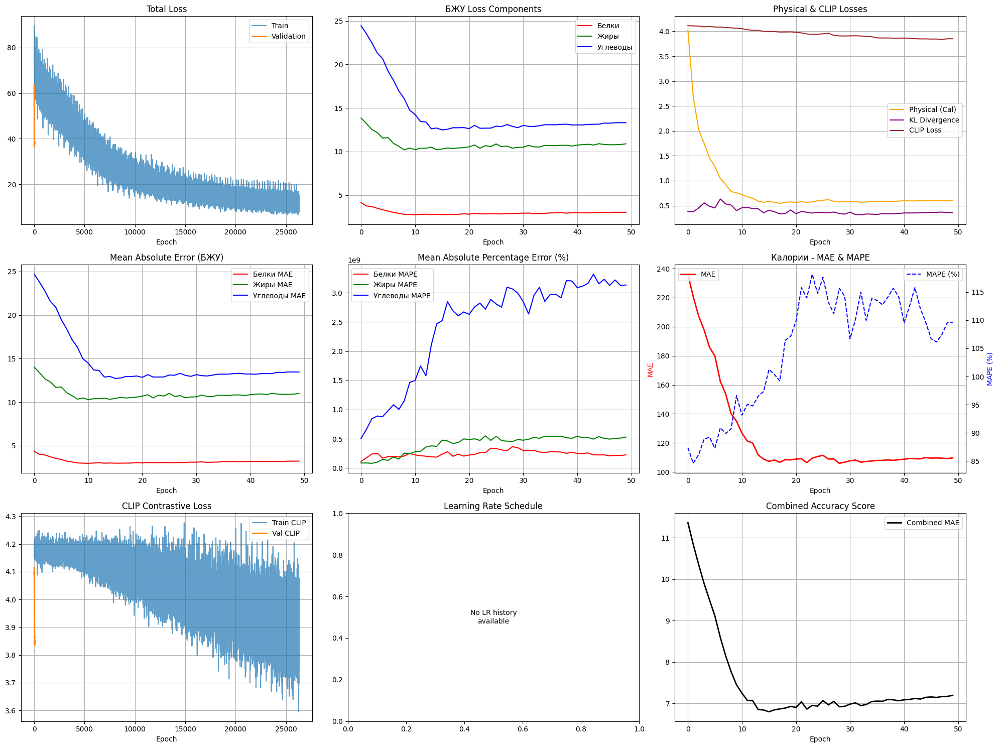

In [109]:
predictor = EnhancedCLIPNutritionPredictor(
    model_config={
        'clip_model_name': 'RN50',
        'freeze_text_encoder': False,
        'use_text_features': True
    }
)

# Обучение
predictor.fit(train_loader, val_loader, epochs=50)

# Визуализация
predictor.plot_losses(save_path='training_plots_clip.png')

In [114]:

import json
import os
import shutil
from pathlib import Path
from tqdm import tqdm

def copy_images_to_train_valid(json_data, source_base_path=".", target_base_path="train_valid"):
    """
    Копирует все изображения из JSON данных в папку train_valid
    
    Args:
        json_data: список словарей с данными о рецептах
        source_base_path: базовый путь где находятся исходные изображения
        target_base_path: путь куда копировать изображения
    """
    
    # Создаем целевую папку
    os.makedirs(target_base_path, exist_ok=True)
    
    copied_count = 0
    failed_count = 0
    skipped_count = 0
    
    print(f"📁 Создана папка: {target_base_path}")
    print(f"🔄 Начинаем копирование изображений...")
    
    for item in tqdm(json_data, desc="Копирование изображений"):
        recipe_id = item.get('id', 'unknown')
        images = item.get('images', [])
        
        if not images:
            continue
            
        for img_info in images:
            valid_path = img_info.get('valid_path')
            image_id = img_info.get('image_id', 'unknown.jpg')
            
            if not valid_path:
                continue
            
            # Исходный путь (заменяем обратные слеши на прямые для кроссплатформенности)
            source_path = os.path.join(source_base_path, valid_path.replace('\\', os.sep))
            
            # Целевой путь - сохраняем структуру папок или делаем плоскую структуру
            # Вариант 1: Сохраняем структуру
            target_path = os.path.join(target_base_path, valid_path.replace('\\', os.sep))
            
            # Вариант 2: Плоская структура (раскомментируйте если нужно)
            # target_path = os.path.join(target_base_path, image_id)
            
            try:
                # Создаем промежуточные папки
                os.makedirs(os.path.dirname(target_path), exist_ok=True)
                
                # Проверяем существование исходного файла
                if os.path.exists(source_path):
                    # Проверяем, не существует ли уже целевой файл
                    if os.path.exists(target_path):
                        skipped_count += 1
                        continue
                    
                    # Копируем файл
                    shutil.copy2(source_path, target_path)
                    copied_count += 1
                    
                else:
                    print(f"❌ Файл не найден: {source_path}")
                    failed_count += 1
                    
            except Exception as e:
                print(f"❌ Ошибка копирования {source_path}: {e}")
                failed_count += 1
    
    # Статистика
    print(f"\n📊 РЕЗУЛЬТАТЫ КОПИРОВАНИЯ:")
    print(f"✅ Скопировано: {copied_count} файлов")
    print(f"⏭️ Пропущено (уже существуют): {skipped_count} файлов") 
    print(f"❌ Ошибок: {failed_count} файлов")
    print(f"📁 Целевая папка: {os.path.abspath(target_base_path)}")
    
    return copied_count, failed_count, skipped_count


def update_json_paths(json_data, new_base_path="train_valid"):
    """
    Обновляет пути в JSON данных на новые
    
    Args:
        json_data: исходные данные
        new_base_path: новый базовый путь
    
    Returns:
        Обновленные данные с новыми путями
    """
    
    updated_data = []
    
    for item in json_data:
        updated_item = item.copy()
        
        if 'images' in updated_item:
            updated_images = []
            
            for img_info in updated_item['images']:
                updated_img = img_info.copy()
                
                if 'valid_path' in updated_img:
                    old_path = updated_img['valid_path']
                    # Создаем новый путь
                    new_path = os.path.join(new_base_path, old_path.replace('\\', os.sep))
                    updated_img['valid_path'] = new_path.replace(os.sep, '/')  # Нормализуем к Unix стилю
                
                updated_images.append(updated_img)
            
            updated_item['images'] = updated_images
        
        updated_data.append(updated_item)
    
    return updated_data

def create_image_index(json_data):
    """
    Создает индекс всех изображений для быстрого поиска
    """
    
    image_index = {}
    
    for item in json_data:
        recipe_id = item.get('id')
        images = item.get('images', [])
        
        for img_info in images:
            image_id = img_info.get('image_id')
            valid_path = img_info.get('valid_path')
            
            if image_id and valid_path:
                image_index[image_id] = {
                    'recipe_id': recipe_id,
                    'valid_path': valid_path,
                    'title': item.get('title', ''),
                    'url': img_info.get('url', '')
                }
    
    return image_index

def verify_copied_images(json_data, target_base_path="train_valid"):
    """
    Проверяет, что все изображения скопированы корректно
    """
    
    print(f"🔍 Проверяем скопированные изображения...")
    
    found_count = 0
    missing_count = 0
    missing_files = []
    
    for item in tqdm(json_data, desc="Проверка файлов"):
        images = item.get('images', [])
        
        for img_info in images:
            valid_path = img_info.get('valid_path')
            if not valid_path:
                continue
                
            # Путь к скопированному файлу
            target_path = os.path.join(target_base_path, valid_path.replace('\\', os.sep))
            
            if os.path.exists(target_path):
                found_count += 1
            else:
                missing_count += 1
                missing_files.append(target_path)
    
    print(f"\n📋 РЕЗУЛЬТАТЫ ПРОВЕРКИ:")
    print(f"✅ Найдено: {found_count} файлов")
    print(f"❌ Отсутствует: {missing_count} файлов")
    
    if missing_files[:10]:  # Показываем первые 10 отсутствующих
        print(f"\nПримеры отсутствующих файлов:")
        for file_path in missing_files[:10]:
            print(f"  - {file_path}")
    
    return found_count, missing_count

def main(json_file_path, source_images_path=".", target_path="train_valid"):
    """
    Основная функция для копирования изображений
    
    Args:
        json_file_path: путь к JSON файлу с данными
        source_images_path: путь к папке с исходными изображениями
        target_path: путь куда копировать
    """
    
    print("🚀 КОПИРОВАНИЕ ИЗОБРАЖЕНИЙ В TRAIN_VALID")
    print("="*60)
    
    # Загружаем JSON данные
    print(f"📖 Загружаем данные из {json_file_path}...")
    
    if isinstance(json_file_path, str):
        with open(json_file_path, 'r', encoding='utf-8') as f:
            json_data = json.load(f)
    else:
        # Если передан уже загруженный список
        json_data = json_file_path
    
    print(f"✅ Загружено {len(json_data)} рецептов")
    
    # Создаем индекс изображений
    image_index = create_image_index(json_data)
    print(f"📋 Найдено {len(image_index)} уникальных изображений")
    
    # Копируем изображения
    copied, failed, skipped = copy_images_to_train_valid(
        json_data, source_images_path, target_path
    )
    
    # Проверяем результат
    if copied > 0:
        verify_copied_images(json_data, target_path)
    
    # Создаем обновленный JSON с новыми путями
    if copied > 0:
        updated_data = update_json_paths(json_data, target_path)
        
        updated_json_path = "updated_dataset_with_new_paths.json"
        with open(updated_json_path, 'w', encoding='utf-8') as f:
            json.dump(updated_data, f, ensure_ascii=False, indent=2)
        
        print(f"💾 Сохранен обновленный JSON: {updated_json_path}")
    
    return json_data, image_index



def copy_images_flat_structure(json_data, source_base_path=".", target_path="train_valid_flat"):
    """
    Копирует изображения в плоскую структуру (все файлы в одной папке)
    """
    
    os.makedirs(target_path, exist_ok=True)
    
    copied_count = 0
    failed_count = 0
    
    for item in tqdm(json_data, desc="Копирование в плоскую структуру"):
        images = item.get('images', [])
        
        for img_info in images:
            valid_path = img_info.get('valid_path')
            image_id = img_info.get('image_id', 'unknown.jpg')
            
            if not valid_path:
                continue
            
            source_path = os.path.join(source_base_path, valid_path.replace('\\', os.sep))
            target_file_path = os.path.join(target_path, image_id)
            
            try:
                if os.path.exists(source_path) and not os.path.exists(target_file_path):
                    shutil.copy2(source_path, target_file_path)
                    copied_count += 1
                elif not os.path.exists(source_path):
                    failed_count += 1
                    
            except Exception as e:
                print(f"❌ Ошибка: {e}")
                failed_count += 1
    
    print(f"✅ Скопировано в плоскую структуру: {copied_count} файлов")
    print(f"❌ Ошибок: {failed_count} файлов")

def get_copy_statistics(json_data):
    """
    Показывает статистику по изображениям до копирования
    """
    
    total_recipes = len(json_data)
    total_images = sum(len(item.get('images', [])) for item in json_data)
    recipes_with_images = sum(1 for item in json_data if item.get('images'))
    
    print(f"📊 СТАТИСТИКА ИЗОБРАЖЕНИЙ:")
    print(f"   Всего рецептов: {total_recipes}")
    print(f"   Рецептов с изображениями: {recipes_with_images}")
    print(f"   Всего изображений: {total_images}")
    print(f"   Среднее изображений на рецепт: {total_images/total_recipes:.2f}")



In [ ]:
        with open(json_file_path, 'r', encoding='utf-8') as f:
            json_data = json.load(f)

In [ ]:
# Использование с вашими данными
if __name__ == "__main__":
    # Ваши данные (замените на реальный путь к JSON или используйте переменную dataset)
    
    # Вариант 1: Если данные в переменной
    # dataset = [ваши данные]
    # main(dataset, source_images_path=".", target_path="train_valid")
    
    # Вариант 2: Если данные в файле
    # main("your_dataset.json", source_images_path=".", target_path="train_valid")
    
    # Вариант 3: Прямое использование с вашими данными
    dataset = [
        {
            "id": "000095fc1d",
            "images": [
                {
                    "image_id": "a1374cdd98.jpg",
                    "valid_path": "train\\a\\1\\3\\7\\a1374cdd98.jpg"
                }
            ],
            "title": "Yogurt Parfaits"
        },
   
    ]
    
    main(dataset, source_images_path=".", target_path="train_valid")

In [117]:
        with open(r'C:\Users\User\Desktop\Магистратруа\CV\project\data_pars\pic2kcal\extraction\processed_recipes\train_fix.json', 'r', encoding='utf-8') as f:
            json_data = json.load(f)

In [121]:
main(r"C:\Users\User\Desktop\Магистратруа\CV\project\data_pars\pic2kcal\extraction\processed_recipes\val_fix.json", source_images_path="", target_path="val_valid")


🚀 КОПИРОВАНИЕ ИЗОБРАЖЕНИЙ В TRAIN_VALID
📖 Загружаем данные из C:\Users\User\Desktop\Магистратруа\CV\project\data_pars\pic2kcal\extraction\processed_recipes\val_fix.json...
✅ Загружено 2568 рецептов
📋 Найдено 6782 уникальных изображений
📁 Создана папка: val_valid
🔄 Начинаем копирование изображений...


Копирование изображений: 100%|██████████| 2568/2568 [00:08<00:00, 302.58it/s]



📊 РЕЗУЛЬТАТЫ КОПИРОВАНИЯ:
✅ Скопировано: 6782 файлов
⏭️ Пропущено (уже существуют): 0 файлов
❌ Ошибок: 0 файлов
📁 Целевая папка: c:\Users\User\Desktop\Магистратруа\CV\project\data_pars\pic2kcal\extraction\val_valid
🔍 Проверяем скопированные изображения...


Проверка файлов: 100%|██████████| 2568/2568 [00:00<00:00, 13441.67it/s]



📋 РЕЗУЛЬТАТЫ ПРОВЕРКИ:
✅ Найдено: 6782 файлов
❌ Отсутствует: 0 файлов
💾 Сохранен обновленный JSON: updated_dataset_with_new_paths.json


([{'id': '000982e226',
   'total_weight_g': 315.3958333333333,
   'nutr_per_portion': {'energy_kcal': 849.5,
    'fat_g': 75.95708333333333,
    'protein_g': 22.225833333333334,
    'carbs_g': 19.87072916666667,
    'saturated_fat_g': 7.437333333333332,
    'sugars_g': 7.244583333333333,
    'salt_g': 1200.75},
   'nutr_per100g': {'energy_kcal': 269.3440782086003,
    'fat_g': 24.083096637822845,
    'protein_g': 7.046964792918951,
    'carbs_g': 6.102087324129727,
    'saturated_fat_g': 2.358094986458815,
    'sugars_g': 2.296981306559218,
    'salt_g': 0.9517801704207676},
   'images': [{'image_id': '6b40555086.jpg',
     'url': 'http://images.media-allrecipes.com/userphotos/256x256/1323244.jpg',
     'valid_path': './val/val\\6\\b\\4\\0\\6b40555086.jpg'}],
   'partition': 'val',
   'title': "Cheryl's Veggie-Nut Patties"},
  {'id': '00180ff35c',
   'total_weight_g': 1784.471,
   'nutr_per_portion': {'energy_kcal': 4736.15295,
    'fat_g': 331.23466529999996,
    'protein_g': 259.7585